<a href="https://colab.research.google.com/github/yunchae-kim/food.com_review_analysis/blob/master/Food_com_review_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **CIS5450 Final Project**

By Rishi Patel, Yunchae Kim, Tom Liu

# **Introduction**

This is the [link](https://drive.google.com/drive/folders/1f_AbN_P1RP7GFAit6EfIo_iR40qQu2rp?usp=share_link) to the shared google drive folder with this file present, the proposal present, all the datasets present and one intermediate dataset present (only used as a backup to maintain a deterministic solution)

## **Objective**

Our overall objective for this project was to help people make better decisions about the food they are consuming and the recipes they are using in their day to day lives. 

Specifically, we are using a Food.com dataset that provides us with recipe information, nutritional information and review information for each individual recipe. We make use of this dataset to specifically answer the following questions through the use of Machine Learning models
1. Can we predict the Fiber content of a recipe based on other relevant information within recipes? This would thereby help people identify their fiber intake based on different recipes and food they are ingesting. This would also help publishers better estimate the fiber content of their food.
2. Can we predict the Cholesterol content of a recipe based on other relevant information within recipes? High cholesterol is a very common health condition in the US. Being able to predict the cholesterol content based on a given recipe would help publishers improve their own recipes, and users make more informed decisions.
3. Can we classify different recipes based on time? Is this recipe a quick cook of under 30 min or not? Being able to correctly classify this would help people plan their days, choose recipes and food items better suited to their schedules and make more informed choices.
4. Can we classify recipes into various high level categories based on other recipe specific information provided to us? This would help users find the right recipes according to their preferences and publishers to automate the process of categorizing their recipe and removing the irregularities in different user-defined categories.

Beyond these modeling efforts, we also aim to answer broader questions about recipes, health and Food.com in general to satiate our curiosity for health and food specific patterns. We want to see if there are certain trends in recipe nutrition levels, which ingredients are most commonly used, and how Food.com has been used over time. Additionally we want to analyze the sentiment of different reviews for recipes and compare them with numeric ratings given to recipes. These additional questions along with our modeling efforts help us achieve our overall goal of improving the decision making of people for the betterment of their own health.


## **Motivation**

With the increase in people valuing nutrition, health and home-cooking, there have been more and more online recipes that try to cater to the ever-evolving needs of humans. As food enthusiasts and health conscious individuals ourselves, we were extremely curious to analyse the trends in data for food being posted online, what people have a preference for, and whether we can create models to make more informed decisions about the recipes. Food.com is a highly popular website to provide various recipes to its users, so we decided to use this data to answer our questions!

This project is interesting because it allows us to see the evolution of human preferences over time, in different seasons and within different categories of food. It also allows us to creater ML models for prediction and classification to help people make better decisions about food in accordance to their preferences. Furthermore, we can also use unsupervised learning to understand and visualize different groups of food based on the data available to us. This is highly relevant from a nutritional point of view as this information shows food consumption patterns over time, which can then be linked to various disease factors that unhealthy food habits give rise to. Additionally it also gives insight into people’s use of the internet and online recipes, and how they express themselves.


# **Setup**

## **Import Statements**

In [ ]:
!pip install pandasql
!pip install pattern3
!pip install nltk
!pip install fasttext
!pip install inflector


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for pandasql: filename=pandasql-0.7.3-py3-none-any.whl size=26787 sha256=c0b8aec4b05344d077c68c84f06bd21076433bc6a5fc23ffb056f4467a60679e
  Stored in directory: /root/.cache/pip/wheels/ed/8f/46/a383923333728744f01ba24adbd8e364f2cb9470a8b8e5b9ff
Successfully built pandasql
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 23.7 MB 357 kB/s 
     |████████████████████████████████| 348 kB 65.3 MB/s 
     |████████████████████████████████| 54 kB 3.0 MB/s 
     |████████████████████████████████| 81 kB 10.9 MB/s 
     |████████████████████████████████| 100 kB 11.7 MB/s 
     |████████████████████████████████| 139 kB 84.7 MB/s 
     |████████████████████████████████| 5.6 MB 70.5 MB/s 
     |████████████████████████████████| 100 kB 11.4 MB/s 
     |████████████████████████████████| 4.0 MB 76.4 

In [ ]:
import pandas as pd
import numpy as np
import math
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import re
import html
import pandasql as ps
from collections import Counter 
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('omw-1.4')
nltk.download('vader_lexicon')
from inflector import Inflector
from collections import Counter
from wordcloud import WordCloud
from nltk.sentiment import SentimentIntensityAnalyzer
import fasttext
from mpl_toolkits.mplot3d import Axes3D

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
from sklearn.decomposition import PCA
from sklearn.preprocessing import PolynomialFeatures
from sklearn.cluster import KMeans
from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.linear_model import ElasticNetCV
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

import torch
import torchvision
from torchvision import transforms, utils
import torch.nn as nn
import torch.optim as optim
import torchvision.transforms as transforms
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


In [ ]:
prefix = '/content/drive'
from google.colab import drive
drive.mount(prefix, force_remount=True)

Mounted at /content/drive


## **Load Original Datasets**

The original data can be found here: [Link](https://www.kaggle.com/datasets/irkaal/foodcom-recipes-and-reviews)
Both data sets we use, i.e. recipes.csv and reviews.csv can be found and downloaded from there.

recipes.csv is over 700MB large and reviews.csv is over 400MB large so it ends up taking a significantly long time to download and upload to COLAB so we have added this to our Google Drive to use this data conveniently.

We use the recipe data as the the primary dataset for features for most of our modelling, however, some columns have been aggregated and merged from the reviews dataset to provide additonal features. We also use the reviews dataset for sentiment analysis and to analyse various patterns people's perception and satisfaction over time. 

The URL below may need to be changed in accordance with where the files have been stored on other systems.


In [ ]:
recipes_df = pd.read_csv('/content/drive/My Drive/CIS5450 Project/recipes.csv')

In [ ]:
reviews_df = pd.read_csv('/content/drive/My Drive/CIS5450 Project/reviews.csv')

# **Brief EDA and Data Cleaning**

In this section, we preprocess and clean both our datasets. Since these datasets were scraped from Food.com, they had quite a few missing values and discrepencies which needed to be resolved before you can use this data for our in depth analyses and modelling efforts. 

We begin by looking into the Reviews data first. This is because the reviews dataset contains user review data specific to recipes in the recipes dataset. Once this datset is cleaned, it can be aggregated and merged with the Recipes dataset. 

## **Reviews Dataset**

This sub-section is to preprocess and clean reviews_df

### **Brief Data Overview**

First, we begin by displaying a few rows of the data and looking at the information of the overall table to understand our data from a very high level. 

In [ ]:
# Briefly observing the first few rows of data
reviews_df.head()

,ReviewId,RecipeId,AuthorId,AuthorName,Rating,Review,DateSubmitted,DateModified
0,2,992,2008,gayg msft,5,better than any you can get at a restaurant!,2000-01-25T21:44:00Z,2000-01-25T21:44:00Z
1,7,4384,1634,Bill Hilbrich,4,"I cut back on the mayo, and made up the differ...",2001-10-17T16:49:59Z,2001-10-17T16:49:59Z
2,9,4523,2046,Gay Gilmore ckpt,2,i think i did something wrong because i could ...,2000-02-25T09:00:00Z,2000-02-25T09:00:00Z
3,13,7435,1773,Malarkey Test,5,easily the best i have ever had. juicy flavor...,2000-03-13T21:15:00Z,2000-03-13T21:15:00Z
4,14,44,2085,Tony Small,5,An excellent dish.,2000-03-28T12:51:00Z,2000-03-28T12:51:00Z


In [ ]:
# Looking into data types and Non-null counts in our data
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1401982 entries, 0 to 1401981
Data columns (total 8 columns):
 #   Column         Non-Null Count    Dtype 
---  ------         --------------    ----- 
 0   ReviewId       1401982 non-null  int64 
 1   RecipeId       1401982 non-null  int64 
 2   AuthorId       1401982 non-null  int64 
 3   AuthorName     1401982 non-null  object
 4   Rating         1401982 non-null  int64 
 5   Review         1401768 non-null  object
 6   DateSubmitted  1401982 non-null  object
 7   DateModified   1401982 non-null  object
dtypes: int64(4), object(4)
memory usage: 85.6+ MB


After reviewing the information above, the following insights were gathered:


1.   There is only one column - `Review` - that has `NaN` values
2.   The date related columns (`DateSubmitted` and `DateModified`) have the incorrect dtype 

Based on this, we clean the data in the following sections

### **Missing Value correction and Dtype Modification**

We begin with the only column that contains `NaN` values -  `Review`. There are only 214 missing values (0.015% of the entire data) in this column. Since, we want to use this column later for our sentiment analysis and as a feature in our modelling, we decide to drop the rows with null values.

In [ ]:
#drop rows with missing Review
reviews_df = reviews_df.dropna()

Next, the `DateSubmitted` AND `DateModified` columns have the `object` dtype. To be able to effectively use these dates, we convert them to the datetime dtype.

In [ ]:
#Converting original ISO date string to datetime dtype for DateSubmitted
reviews_df["DateSubmitted"] = reviews_df["DateSubmitted"].apply(lambda x: dt.datetime.strptime(x, "%Y-%m-%dT%H:%M:%SZ"))

#Converting original ISO date string to datetime dtype for DateModified
reviews_df["DateModified"] = reviews_df["DateModified"].apply(lambda x: dt.datetime.strptime(x, "%Y-%m-%dT%H:%M:%SZ"))

### **Cleaned Final Data Overview**

Now, we have fully cleaned reviews_df. This dataframe can be seen below:

In [ ]:
reviews_df

,ReviewId,RecipeId,AuthorId,AuthorName,Rating,Review,DateSubmitted,DateModified
0,2,992,2008,gayg msft,5,better than any you can get at a restaurant!,2000-01-25 21:44:00,2000-01-25 21:44:00
1,7,4384,1634,Bill Hilbrich,4,"I cut back on the mayo, and made up the differ...",2001-10-17 16:49:59,2001-10-17 16:49:59
2,9,4523,2046,Gay Gilmore ckpt,2,i think i did something wrong because i could ...,2000-02-25 09:00:00,2000-02-25 09:00:00
3,13,7435,1773,Malarkey Test,5,easily the best i have ever had. juicy flavor...,2000-03-13 21:15:00,2000-03-13 21:15:00
4,14,44,2085,Tony Small,5,An excellent dish.,2000-03-28 12:51:00,2000-03-28 12:51:00
...,...,...,...,...,...,...,...,...
1401977,2090339,139499,2002080368,terrylbiggs,2,I was disappointed. I couldn't wait to make th...,2020-12-27 23:57:54,2020-12-27 23:57:54
1401978,2090340,148484,41805321,rogerberry,5,Nothing to drain. And I don’t heat up the liqu...,2020-12-28 00:44:42,2020-12-28 00:44:42
1401979,2090341,264191,2002901848,Reiketsukan 6.,5,Good base recipe for someone to start with. I ...,2020-12-28 01:04:43,2020-12-28 01:04:43
1401980,2090345,411791,2002901938,Sue M.,5,Thank you so much for this amazing recipe! I l...,2020-12-28 03:07:10,2020-12-28 03:07:10


In [ ]:
reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1401768 entries, 0 to 1401981
Data columns (total 8 columns):
 #   Column         Non-Null Count    Dtype         
---  ------         --------------    -----         
 0   ReviewId       1401768 non-null  int64         
 1   RecipeId       1401768 non-null  int64         
 2   AuthorId       1401768 non-null  int64         
 3   AuthorName     1401768 non-null  object        
 4   Rating         1401768 non-null  int64         
 5   Review         1401768 non-null  object        
 6   DateSubmitted  1401768 non-null  datetime64[ns]
 7   DateModified   1401768 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(4), object(2)
memory usage: 96.3+ MB


In [ ]:
reviews_df.describe()

,ReviewId,RecipeId,AuthorId,Rating
count,1.401768e+06,1.401768e+06,1.401768e+06,1.401768e+06
mean,8.177961e+05,1.526337e+05,1.556058e+08,4.407904e+00
std,5.279177e+05,1.301035e+05,5.301008e+08,1.272074e+00
min,2.000000e+00,3.800000e+01,1.533000e+03,0.000000e+00
25%,3.743278e+05,4.703700e+04,1.336240e+05,4.000000e+00
50%,7.716645e+05,1.093220e+05,3.305450e+05,5.000000e+00
75%,1.203946e+06,2.318700e+05,8.178628e+05,5.000000e+00
max,2.090347e+06,5.412980e+05,2.002902e+09,5.000000e+00


## **Recipes Dataset**

This sub-section is to preprocess and clean recipes_df

### **Brief Data Overview**

First, we begin by displaying a few rows of the data and look at the information of the overall table to understand our data from a very high level

In [ ]:
# Briefly observing the first few rows of data
recipes_df.head()

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,Images,...,SaturatedFatContent,CholesterolContent,SodiumContent,CarbohydrateContent,FiberContent,SugarContent,ProteinContent,RecipeServings,RecipeYield,RecipeInstructions
0,38,Low-Fat Berry Blue Frozen Dessert,1533,Dancer,PT24H,PT45M,PT24H45M,1999-08-09T21:46:00Z,Make and share this Low-Fat Berry Blue Frozen ...,"c(""https://img.sndimg.com/food/image/upload/w_...",...,1.3,8.0,29.8,37.1,3.6,30.2,3.2,4.0,NaN,"c(""Toss 2 cups berries with sugar."", ""Let stan..."
1,39,Biryani,1567,elly9812,PT25M,PT4H,PT4H25M,1999-08-29T13:12:00Z,Make and share this Biryani recipe from Food.com.,"c(""https://img.sndimg.com/food/image/upload/w_...",...,16.6,372.8,368.4,84.4,9.0,20.4,63.4,6.0,NaN,"c(""Soak saffron in warm milk for 5 minutes and..."
2,40,Best Lemonade,1566,Stephen Little,PT5M,PT30M,PT35M,1999-09-05T19:52:00Z,This is from one of my first Good House Keepi...,"c(""https://img.sndimg.com/food/image/upload/w_...",...,0.0,0.0,1.8,81.5,0.4,77.2,0.3,4.0,NaN,"c(""Into a 1 quart Jar with tight fitting lid, ..."
3,41,Carina's Tofu-Vegetable Kebabs,1586,Cyclopz,PT20M,PT24H,PT24H20M,1999-09-03T14:54:00Z,This dish is best prepared a day in advance to...,"c(""https://img.sndimg.com/food/image/upload/w_...",...,3.8,0.0,1558.6,64.2,17.3,32.1,29.3,2.0,4 kebabs,"c(""Drain the tofu, carefully squeezing out exc..."
4,42,Cabbage Soup,1538,Duckie067,PT30M,PT20M,PT50M,1999-09-19T06:19:00Z,Make and share this Cabbage Soup recipe from F...,"""https://img.sndimg.com/food/image/upload/w_55...",...,0.1,0.0,959.3,25.1,4.8,17.7,4.3,4.0,NaN,"c(""Mix everything together and bring to a boil..."


In [ ]:
# Looking into data types and Non-null counts in our data
recipes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 522517 entries, 0 to 522516
Data columns (total 28 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   RecipeId                    522517 non-null  int64  
 1   Name                        522517 non-null  object 
 2   AuthorId                    522517 non-null  int64  
 3   AuthorName                  522517 non-null  object 
 4   CookTime                    439972 non-null  object 
 5   PrepTime                    522517 non-null  object 
 6   TotalTime                   522517 non-null  object 
 7   DatePublished               522517 non-null  object 
 8   Description                 522512 non-null  object 
 9   Images                      522516 non-null  object 
 10  RecipeCategory              521766 non-null  object 
 11  Keywords                    505280 non-null  object 
 12  RecipeIngredientQuantities  522514 non-null  object 
 13  RecipeIngredie

After reviewing the information above, we realized that there are quite a few issues with the dataset. There are strangely formatted strings in some columns, there are quite a few columns with missing values and there are columns which don't have the most optimal dtypes for the information they are displaying.

We also realized that the columns `AggregatedRating` and `ReviewCount` are aggregations that should match the data from the reviews_df so we needed to make sure that was actually the case.

Additionally, there are some columns with completely unsynchronized units which need to be dropped. 

We deal with all these cleaning steps in systematically below.

### **Cleaning Columns without Missing Values**

This section tackles the cleaning of all columns that did not contain any missing values but needed to be processed.

The `DatePublished` column has the `object` dtype. To be able to effectively use this dates, we convert it to the `datetime` dtype.

In [ ]:
#Converting original ISO date string to datetime dtype for DatePublished
recipes_df["DatePublished"] = recipes_df["DatePublished"].apply(lambda x: dt.datetime.strptime(x, "%Y-%m-%dT%H:%M:%SZ"))

The `PrepTime` and `TotalTime` columns have the `object` dtype are based off of the ISO 8601 time duration format. However, some values also were incorrectly formatting so they needed to be rewritten in proper ISO 8601 formats before we could convert them. Also, some values have time as 0 seconds, which is incorrect so those rows have been dropped.

So we define a function that reformats the values correctly into ISO 8601 format and then parse it to obtain the values in minutes. 

In [ ]:
# This function is used to reformat the existing PrepTime and TotalTime columns into the correct ISO formats 
# so that they can be parsed into correct values in the unit of minutes for the dataframe. It returns an int.
def reformat_ISO_Duration(x):
  x = str(x).strip()

  if x == 'PT0S':
    return np.nan
  numbers = re.findall(r'\d+', x)
  day = 0

  if 'M' in x and 'H' in x:
    if int(numbers[1]) >= 60:
      hour = int(int(numbers[1])/60)
      numbers[0] = int(numbers[0]) + hour
      numbers[1] = int(numbers[1]) - (hour*60)
  elif 'M' in x and 'H' not in x:
    if int(numbers[0]) >= 60:
      hour = int(int(numbers[1])/60)
      numbers.append(int(numbers[0]) - (hour*60)) 
      numbers[0] = hour

  if 'H' in x :
    if int(numbers[0]) >= 24:
      day = int(int(numbers[0])/24)
      numbers[0] = int(numbers[0]) - (day*24)
      new_x = 'P' + str(day) + 'DT' + str(numbers[0]) + 'H'
      if 'M' in x:
        new_x = new_x + str(numbers[1]) + 'M0S'
      else:
        new_x = new_x + '0M0S'
      x = new_x
    else:
      if 'M' in x:
        new_x = 'P0DT' + str(numbers[0]) + 'H' + str(numbers[1]) + 'M0S'
      else:
        new_x = 'P0DT' + str(numbers[0]) + 'H0M0S'
      x=new_x
  else:
    new_x = 'P0DT0H' + str(numbers[0]) + 'M0S'
    x=new_x
  return int(pd.Timedelta(x).total_seconds() / 60)

# Converting TotalTime column to the dtype int by applying function defined above
recipes_df["TotalTime"] = recipes_df["TotalTime"].apply(lambda x: reformat_ISO_Duration(x))

# Converting PrepTime column to the dtype int by applying function defined above
recipes_df["PrepTime"] = recipes_df["PrepTime"].apply(lambda x: reformat_ISO_Duration(x))

In [ ]:
recipes_df = recipes_df.dropna(subset=['TotalTime', 'PrepTime'])

The columns `RecipeIngredientParts` and `RecipeInstructions` both have formatting that is not desirable. To make these columns more readable and uniform, we decided to remove all the unneccesary characters and keep the values comma separated.

We define a function to clean an individual string and use the `apply()` method to reformat the columns appropriately.

In [ ]:
# This function is used in a lambda function to reformat the string into a readable format
def reformat_strings(x):
  x = str(x).strip()
  x = x[1:]
  x = x.replace("(", "").replace(")", "").replace('"', "").replace("\n", "")
  return html.unescape(x)

# We reformat the RecipeIngredientParts column here
recipes_df['RecipeIngredientParts'] = recipes_df['RecipeIngredientParts'].apply(lambda x: reformat_strings(x))

# We reformat the RecipeInstructions column here
recipes_df['RecipeInstructions'] = recipes_df['RecipeInstructions'].apply(lambda x: reformat_strings(x))

Furthermore, after taking a look at these columns more closely, we realized that it might be useful to extract features from `RecipeInstructions` and `RecipeIngredientParts`. Specifically, we decide to create a new column for the character count of `RecipeInstructions` and called it `RecipeInstructionsCharCount`. This is because character counts allow us to get an idea about the length of the instructions for a given recipe. This could be an important feature for our analysis. Similarly, the number of RecipeIngredientParts could be another useful feature, so we add a new column for that as well and call it `NumberOfIngredientParts`.

In [ ]:
#Creating new column for character counts of Instructions
recipes_df['RecipeInstructionsCharCount'] = recipes_df['RecipeInstructions'].apply(lambda x: len(x))

# This function is used to return the counts of number of ingredients in the recipe
def count_ingredients(x):
  l = x.strip()
  l = l.split(", ")
  return len(l)

#Creating new column for count of number of ingredients
recipes_df['NumberOfIngredientParts'] = recipes_df['RecipeIngredientParts'].apply(lambda x: count_ingredients(x))

### **Cleaning Columns with Missing Values**

This section tackles the cleaning of all columns that contain missing values.

As mentioned before, there are quite a few columns with `NaN` values, so we try to resolve these issues step by step. 

#### **Dropping Columns and Rows with unresolvable missing values**

We drop the `RecipeYield` and `RecipeIngredientQuantities`. This is for two reasons:


1.   They contain `NaN` values which cannot be imputed or determined
2.   They have units which are either inconsistent or not specified. Therefore these columns do not give us useable data



In [ ]:
# Dropping RecipeYield and RecipeIngredientQuantities columns
recipes_df = recipes_df.drop(columns=['RecipeIngredientQuantities', 'RecipeYield'])

Now, we analyse the column `RecipeCategory` in more detail. Below we determine the number of null and unique values present in total for this column.

In [ ]:
# Determining number of null values and unique values RecipeCategory
nullCount = len(recipes_df[recipes_df['RecipeCategory'].isnull()])
uniqueCount = len(recipes_df['RecipeCategory'].unique())
print("The number of NaN values in RecipeCategory: " + str(nullCount))
print("The number of unique values in RecipeCategory: " + str(uniqueCount))

The number of NaN values in RecipeCategory: 739
The number of unique values in RecipeCategory: 312


Based on above, we realised that RecipeCategory has quite a large number of categories (312 categories). These categories to some extent do have commonalities between them so it may be useful to keep this row as a feature on which we can later perform some text analysis so it becomes useable for our modelling. Additionally, there are only 751 `NaN` values so we decice to drop these rows as this is only 0.14% of the total rows we have.


In [ ]:
# Dropping rows with missing values in RecipeCategory
recipes_df = recipes_df.dropna(subset = ['RecipeCategory'])

Next, we analyse the column `Keywords` in more detail. Below we determine the number of unique keywords present in total across all recipes given to us.

In [ ]:
keywords = recipes_df['Keywords'].dropna().astype('string')
keywords_set = set()
for i in range(len(keywords)):
  ingredients = keywords.iloc[i].replace("c", "").replace("(", "").replace(")", "").replace('"', "")
  for ingredient in ingredients.split(","):
    keywords_set.add(ingredient)

print("The number of unique values in Keywords: " + str(len(keywords_set)))

The number of unique values in Keywords: 582


Based on this information, there are only 583 unique keywords, which was surprising to us given the number of recipes in the dataset and how unregulated keywords can be in general. We determined that it might be useful to keep this `Keywords` column as we can perform text analysis on this later to create useable features for our modelling efforts. As its not possible to impute here, we drop the `NaN` columns. There are 16486 `NaN` values, which is 3.16% of the remaining data. Next, since this column is also strangely formatted, we reformat it to become more readable.

In [ ]:
# # Dropping rows with missing values in RecipeCategory
recipes_df = recipes_df.dropna(subset = ['Keywords'])

In [ ]:
# We reformat the Keywords column here
recipes_df['Keywords'] = recipes_df['Keywords'].apply(lambda x: reformat_strings(x))

#### Cleaning Description and Resolving CookTime

`Description` column has 5 NaN values only. It is possible for a recipe to have no description on Food.com so we decided to replace these nulls with an empty string

In [ ]:
# This function helps repalce NaN values with the empty string
def replace_nan_with_empty(x):
  if x is np.nan:
    return ''
  else:
    return x.strip()

# We replace the NaN values in the Description with empty strings
recipes_df['Description'] = recipes_df['Description'].apply(lambda x: replace_nan_with_empty(x))

Next, we look at is the `CookTime` column which has 82545 missing values. We realized, however, that we have `TotalTime` and `PrepTime` columns which have all data available. The `CookTime` can therefore be calculated as the difference between the `TotalTime` and `PrepTime`. So we replace the existing `CookTime` column with this calculated value to resolve the missing data.

In [ ]:
#replacing original CookTime column with the calculated TotalTime - PrepTime to remove NaN in CookTime
recipes_df["CookTime"] = recipes_df["TotalTime"] - recipes_df["PrepTime"]

#### Creating Has_Image to replace Images

The `Images` column contains strangely formatted URL strings if a recipe had an image present, and contained 'character(0)' if no image was present. We also verified this by visiting Food.com for a few recipes.

There was also one row in this column with a `NaN` value. We manually went to the recipe and found that it had no image.

We decided that it might make sense to create a new column from this data called `Has_Image` which represents contains a 0 if the recipe has no image and 1 if the recipe has an image. The original column is then dropped.

In [ ]:
# A function which helps create a new column to determine if a recipe has an image or not
def has_image(x):
    if x is np.nan or x == 'character(0)':
      return 0
    else:
      return 1

# Creating the new Has_Image column
recipes_df['Has_Image'] = recipes_df['Images'].apply(lambda x: has_image(x))

#Dropping the original Images column
recipes_df.drop(columns='Images', inplace=True)

#### Resolving AggregatedRating and ReviewCount

We realized that there are quite a large number of missing values in `AggregatedRating` and `ReviewCount` columns. However, before taking action on this, it is important to make sure these values match with the actual review information given to us. Therefore, we begin by comparing the `AggregatedRating` and `ReviewCount` columns with two columns we calculate from the reviews dataset (reviews_df) by merging with the recipes dataset and grouping these values by `RecipeID` to find the mean rating and total review counts based on the data given to us. These are called `MeanRating` and `TotalReviewCounts` respectively.

In [ ]:
# Calculating mean rating sna dtotal review counts from the reviews_df and merging with the recipes_df
rating_review_df = pd.merge(recipes_df[['RecipeId', 'AggregatedRating', 'ReviewCount']], reviews_df[['RecipeId', 'Rating', 'Review']], left_on='RecipeId', right_on='RecipeId', how='left')
rating_review_df = rating_review_df.groupby('RecipeId').agg({'Rating': 'mean', 'Review': 'count', 'AggregatedRating': 'mean', 'ReviewCount': 'mean'})
rating_review_df = rating_review_df.reset_index(drop=False).rename(columns={'Rating': 'MeanRating', 'Review': 'TotalReviewCounts'})
rating_review_df['MeanRating'] = round(rating_review_df['MeanRating'], 2)
rating_review_df.head()


,RecipeId,MeanRating,TotalReviewCounts,AggregatedRating,ReviewCount
0,38,4.25,4,4.5,4.0
1,39,3.00,1,3.0,1.0
2,40,4.33,9,4.5,10.0
3,41,4.50,2,4.5,2.0
4,42,2.67,9,4.5,11.0


Based on the resulting table above, we realized that there are discrepencies. There are differences in both the aggregated rating and review counts given to us beforehand compared to what is calculated from the recipe_df. We further analyse this data by printing out counts of all 0 values and all `NaN` values in these 4 columns to compare them. We also print out whether all `NaN` values in `MeanRating` correspond to a recipe having 0 `TotalReviewCounts`

In [ ]:
#Printing different informational statistics about our newly calculated data
print("Number of MeanRatings that are zero : " + str(rating_review_df[rating_review_df['MeanRating'] == 0].shape[0]))
print("Number of TotalReviewCounts that are zero : " + str(rating_review_df[rating_review_df['TotalReviewCounts'] == 0].shape[0]))
print("Number of AggregatedRating that are zero : " + str(rating_review_df[rating_review_df['AggregatedRating'] == 0].shape[0]))
print("Number of ReviewCount that are zero : " + str(rating_review_df[rating_review_df['ReviewCount'] == 0].shape[0]))
print()
print("Number of NaN values in MeanRatings : " + str(rating_review_df[rating_review_df['MeanRating'].isnull()].shape[0]))
print("Number of NaN values in TotalReviewCounts : " + str(rating_review_df[rating_review_df['TotalReviewCounts'].isnull()].shape[0]))
print("Number of NaN values in AggregatedRating : " + str(recipes_df[recipes_df['AggregatedRating'].isnull()].shape[0]))
print("Number of NaN values in ReviewCount : " + str(recipes_df[recipes_df['ReviewCount'].isnull()].shape[0]))
print()

# Check to see that all NaN MeanRatings have TotalReviewCount = 0
print("Check to see that all NaN MeanRatings have TotalReviewCounts = 0")
check = rating_review_df[(rating_review_df['MeanRating'].isnull() == True) & (rating_review_df['TotalReviewCounts'] != 0)]
check

Number of MeanRatings that are zero : 5475
Number of TotalReviewCounts that are zero : 232034
Number of AggregatedRating that are zero : 0
Number of ReviewCount that are zero : 0

Number of NaN values in MeanRatings : 232034
Number of NaN values in TotalReviewCounts : 0
Number of NaN values in AggregatedRating : 234260
Number of NaN values in ReviewCount : 228904

Check to see that all NaN MeanRatings have TotalReviewCounts = 0


,RecipeId,MeanRating,TotalReviewCounts,AggregatedRating,ReviewCount


Based on the results, it can be seen that there are as many `NaN` values in the MeanRatings as there are zeroes in the TotalReviewCounts. Also, there are MeanRatings that are 0. We went to Food.com ourselves to see if it was possible to give a review without giving a rating, or if a reviewer can give a 0 rating to the recipe. It might have been possible in the past, but now giving a 0 rating is not possible. So for consistency, we decided to use our calculated values as they are consistent with the review information given to us and also to remove those reviews that that have no rating, i.e. all MeanRatings that are zero. Additionally, we decided to zero out all MeanRatings that are `NaN` as this is because there are no reviews for this recipe yet. In the end, we drop the original `AggregatedRating` and `ReviewCount` columns. We also decide to leave the `MeanRating` as a float and not convert it into a specific bucketed range like the originally given `AggregatedRating`.

When we analyze this Rating information later on, we make sure to consider that Ratings with 0 mean that there are no reviews.

In [ ]:
#Adding the new MeanRating and TotalReviewCount columns to recipes_df
recipes_df = pd.merge(recipes_df, rating_review_df[['RecipeId', 'MeanRating', 'TotalReviewCounts']], left_on='RecipeId', right_on='RecipeId', how= 'left')

In [ ]:
#Removing all rows with 0 in MeanRating
recipes_df = recipes_df[recipes_df['MeanRating'] != 0]

In [ ]:
# This function is used to replace the NaN values in MeanRating to zero and re-categorize all the newly
#caluclated ratings
def replace_nan_with_zero(x):
  if pd.isna(x):
    return 0.0
  else:
    return x

#Replacing all NaN values in MeanRating with 0
recipes_df['MeanRating'] = recipes_df['MeanRating'].apply(lambda x: replace_nan_with_zero(x))

In [ ]:
# We drop the original columns AggregatedRating and ReviewCount
recipes_df = recipes_df.drop(columns=['AggregatedRating', 'ReviewCount'])

#### Preprocessing RecipeServings

Lastly, the only column that still has null values is `RecipeServings`. Unfortunately, this column has a large number of `NaN` values (there are 175091 `NaN` values which is about 35% of the data). However, this is a column that is important for our evaluation, so we want to keep it but make it usable somehow. To do so, we use the technique taught to us in class where we add an additional column called `Recipe_Servings_Na` that represents which rows had `NaN` values by adding a 1 to the new column in the same row. The other rows have 0 in the additional column. This is done below.

In [ ]:
# This function helps create a new column to represent if RecipeServing had a NaN or not
def creation_of_na_column(x):
  if pd.isna(x):
    return 1
  else:
    return 0

# Creation of new RecipeServing_Na column
recipes_df['RecipeServings_Na'] = recipes_df['RecipeServings'].apply(lambda x: creation_of_na_column(x))

# Replacing all NaN with zeroes in RecipeServings column
recipes_df['RecipeServings'] = recipes_df['RecipeServings'].apply(lambda x: replace_nan_with_zero(x))

### **Cleaned Final Data Overview**

Now, we finally have a cleaned recipes_df. This final dataframe can be seen below:

In [ ]:
recipes_df

,RecipeId,Name,AuthorId,AuthorName,CookTime,PrepTime,TotalTime,DatePublished,Description,RecipeCategory,...,SugarContent,ProteinContent,RecipeServings,RecipeInstructions,RecipeInstructionsCharCount,NumberOfIngredientParts,Has_Image,MeanRating,TotalReviewCounts,RecipeServings_Na
0,38,Low-Fat Berry Blue Frozen Dessert,1533,Dancer,1440.0,45.0,1485.0,1999-08-09 21:46:00,Make and share this Low-Fat Berry Blue Frozen ...,Frozen Desserts,...,30.2,3.2,4.0,"Toss 2 cups berries with sugar., Let stand for...",632,4,1,4.25,4,0
1,39,Biryani,1567,elly9812,25.0,240.0,265.0,1999-08-29 13:12:00,Make and share this Biryani recipe from Food.com.,Chicken Breast,...,20.4,63.4,6.0,Soak saffron in warm milk for 5 minutes and pu...,1100,25,1,3.00,1,0
2,40,Best Lemonade,1566,Stephen Little,5.0,30.0,35.0,1999-09-05 19:52:00,This is from one of my first Good House Keepi...,Beverages,...,77.2,0.3,4.0,"Into a 1 quart Jar with tight fitting lid, put...",387,7,1,4.33,9,0
3,41,Carina's Tofu-Vegetable Kebabs,1586,Cyclopz,20.0,1440.0,1460.0,1999-09-03 14:54:00,This dish is best prepared a day in advance to...,Soy/Tofu,...,32.1,29.3,2.0,"Drain the tofu, carefully squeezing out excess...",1470,14,1,4.50,2,0
4,42,Cabbage Soup,1538,Duckie067,30.0,20.0,50.0,1999-09-19 06:19:00,Make and share this Cabbage Soup recipe from F...,Vegetable,...,17.7,4.3,4.0,"Mix everything together and bring to a boil., ...",186,5,1,2.67,9,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
490927,541379,Meg's Fresh Ginger Gingerbread,2002090414,rdsxc,35.0,60.0,95.0,2020-12-22 15:27:00,Make and share this Meg's Fresh Ginger Gingerb...,Dessert,...,22.8,3.9,8.0,Preheat oven to 350°F Grease an 8x8 cake pan. ...,775,12,0,0.00,0,0
490928,541380,Roast Prime Rib au Poivre with Mixed Peppercorns,211566,Denver cooks,180.0,30.0,210.0,2020-12-22 15:32:00,"White, black, green, and pink peppercorns add ...",Very Low Carbs,...,0.1,117.0,8.0,Position rack in center of oven and preheat to...,1176,6,1,0.00,0,0
490929,541381,Kirshwasser Ice Cream,2001131545,Jonathan F.,180.0,60.0,240.0,2020-12-22 15:33:00,Make and share this Kirshwasser Ice Cream reci...,Ice Cream,...,17.3,12.8,6.0,heat half and half and heavy cream to a simmer...,208,4,0,0.00,0,0
490930,541382,Quick & Easy Asian Cucumber Salmon Rolls,2001004241,CLUBFOODY,0.0,15.0,15.0,2020-12-22 22:11:00,"Extremely quick and easy to make, these are gr...",Canadian,...,0.1,2.4,0.0,"In a small bowl, combine mayo and wasabi paste...",680,5,1,0.00,0,1


In [ ]:
recipes_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 485457 entries, 0 to 490931
Data columns (total 29 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   RecipeId                     485457 non-null  int64         
 1   Name                         485457 non-null  object        
 2   AuthorId                     485457 non-null  int64         
 3   AuthorName                   485457 non-null  object        
 4   CookTime                     485457 non-null  float64       
 5   PrepTime                     485457 non-null  float64       
 6   TotalTime                    485457 non-null  float64       
 7   DatePublished                485457 non-null  datetime64[ns]
 8   Description                  485457 non-null  object        
 9   RecipeCategory               485457 non-null  object        
 10  Keywords                     485457 non-null  object        
 11  RecipeIngredientParts     

In [ ]:
recipes_df.describe()

,RecipeId,AuthorId,CookTime,PrepTime,TotalTime,Calories,FatContent,SaturatedFatContent,CholesterolContent,SodiumContent,...,FiberContent,SugarContent,ProteinContent,RecipeServings,RecipeInstructionsCharCount,NumberOfIngredientParts,Has_Image,MeanRating,TotalReviewCounts,RecipeServings_Na
count,485457.000000,4.854570e+05,4.854570e+05,4.854570e+05,4.854570e+05,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,...,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000,485457.000000
mean,269368.431824,4.251603e+07,1.979114e+02,5.323148e+01,2.511429e+02,477.670194,24.280816,9.428746,85.225508,750.813023,...,3.798436,21.513560,17.210843,5.653656,570.692395,7.875266,0.323477,2.318299,2.778800,0.350546
std,154643.743343,2.824130e+08,6.462047e+04,2.661980e+03,6.470749e+04,1282.865840,114.545714,47.888481,308.456374,3727.022164,...,8.303703,66.153096,40.413017,95.621150,420.557975,3.939897,0.467803,2.284476,14.887901,0.477141
min,38.000000,2.700000e+01,-8.640000e+03,1.000000e+00,1.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,135117.000000,6.852600e+04,1.000000e+01,1.000000e+01,2.000000e+01,172.600000,5.500000,1.400000,3.600000,120.700000,...,0.800000,2.500000,3.400000,0.000000,297.000000,5.000000,0.000000,0.000000,0.000000,0.000000
50%,266619.000000,2.326690e+05,2.000000e+01,1.500000e+01,4.000000e+01,314.400000,13.600000,4.600000,41.600000,347.100000,...,2.100000,6.500000,8.900000,4.000000,475.000000,7.000000,0.000000,2.670000,1.000000,0.000000
75%,402780.000000,5.396860e+05,4.500000e+01,2.000000e+01,7.000000e+01,524.600000,27.200000,10.700000,106.500000,782.600000,...,4.500000,18.000000,24.800000,6.000000,726.000000,10.000000,1.000000,4.790000,2.000000,1.000000
max,541383.000000,2.002886e+09,4.354560e+07,1.440000e+06,4.355280e+07,612854.600000,64368.100000,26740.600000,130456.400000,731056.400000,...,3012.000000,7565.200000,18396.200000,32767.000000,11669.000000,44.000000,1.000000,5.000000,2892.000000,1.000000


# **In Depth EDA**

In this section, we conduct detailed EDA based on our cleaned data and try to answer many questions that have interested us!

## **Distribution of MeanRating**

We want to understand the distribution of `Mean Rating` given to different recipes. This is particularly interesting as it will allow us to know how people tend to rate recipes on websites like Food.com. Are people more lenient with their rating or are they highly critical? How many recipes are rated a full 5 stars and how many are not reviewed at all?

To answer these questions, we plot a histogram of the Mean Ratings.

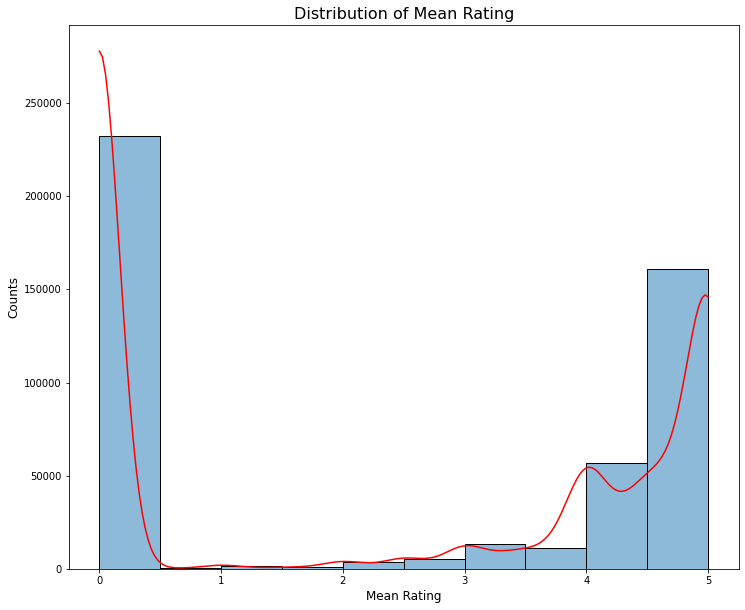

In [ ]:
#Plotting a histogram of mean rating bucketed into 10 sections
df = recipes_df[['MeanRating']]
plt.figure(figsize=(12, 10))
axis = sns.histplot(data=df, x='MeanRating', bins=10, kde=True, line_kws={'color': 'crimson'})
axis.lines[0].set_color('red')
plt.xlabel("Mean Rating", fontsize=12)
plt.ylabel("Counts", fontsize=12)
plt.title("Distribution of Mean Rating", fontsize=16)
plt.show()

The results of the histogram shed light about quite a few factors related to Food.com recipe ratings. 

Firstly, it can be seen that there is a significant portion of reviews that have 0 as the mean rating. This is indicative of there being no reviews for these recipes. Hence, quite a large number of recipes on Food.com are not rated.

Secondly, people seem to favor giving recipes higher ratings (> 4). There are far fewer critical reviews than we originally anticipated. We believed people may be far more critical of food (as people are often picky about their meals), however, that does not seem to be the case.

Lastly, a surprisingly large about of mean ratings have 5 stars (i.e. the highest possible score). This is certainly interesting, but could also be attributed to some reviews having very few reviews and so they are able to maintain that 5 star rating.

## **Correlation Analysis**

### **Correlation between all Relevant Numerical Columns**

We begin by finding correlation between all relevant numerical values, cause this information will help us make better decisions while modelling.

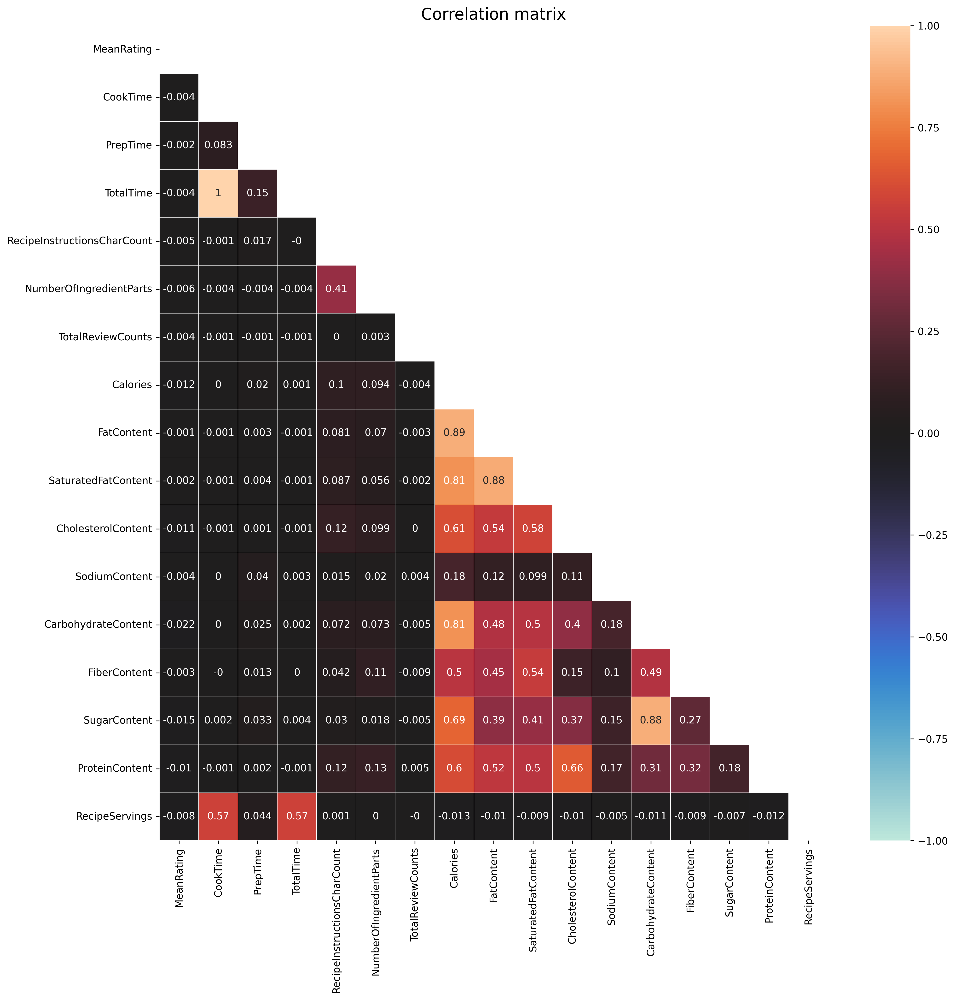

In [ ]:
# Projecting to get required columns and then finding correlation matrix
df = recipes_df[['MeanRating', 'CookTime', 'PrepTime', 'TotalTime', 'RecipeInstructionsCharCount', 'NumberOfIngredientParts', 'TotalReviewCounts', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent', 'RecipeServings']]
df = df[df['MeanRating'] > 0]
corr_matrix = round(df.corr(), 3)

# Creating a heatmap and plotting it
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
plt.figure(figsize=(15, 15), dpi=300)
sns.heatmap(corr_matrix, vmin=-1, vmax=1, linewidth=.2, center=0.0, mask=mask, annot=True)
plt.title("Correlation matrix", fontsize=16)
plt.show()

We assume the interpretation of correlation coefficient r as follows:
- 0.9 <= r < 1: very highly correlated
- 0.7 <= r < 0.9: highly correlated
- 0.5 <= r < 0.7: moderately correlated
- 0.3 <= r < 0.5: lowly correlated

Based on this, it can be seen that there are several noticeable findings.
First, we cover the more obvious results.

1.   `TotalTime` and `CookTime` have a very high positive correlation. This makes sense as `CookTime` + `PrepTime` = `TotalTime`. We need to take this into consideration when we are modelling.

2. `NumberOfIngredientParts` has a low but positive correlation with `RecipeInstructionsCharCount` since the more ingredients involed in a recipe, the more likely the instruction to be long.

3. `CholesterolContent` has moderate positive correlation with `Calories`, `FatContent`, `SaturatedFatContent`. This closely represent the fact that one of the main sources of cholesterol is fat. However, there seems to be some correlation of cholesterol with protein, sugar and carbohydrates, which might be interesting to explore.

4. `CarbohydrateContent` has high and moderate positive correlation with `SugarContent` and `FiberContent` respectively. This also matches with common knowledge that source of fiber and sugar is usually food with high carbohydrate content.

Next, we cover the correlation between calories and nutrients.

`Calories` has correlation with other nutrients as follows:
- Very high correlation: Fat, Saturated Fat
- High correlation: Protein
- Moderate correlation: Cholesterol, Carbohydrate
- Low correlation: Fiber, Sugar
- Very low correlation: Sodium

Based on this, here are some interesting findings:

Firstly, protein content has higher correlation compared to carbohydrate content - 

Considering the calories per gram of the nutrients, fat (9/g), protein (4/g), carbohydrate (4/g), and sugar (4/g), it is intuitive that recipes with high fat content have high calories. However, it was interesting to note that protein content had a much higher correlation compared to carbohydrate content. The [FDA recommends](https://ods.od.nih.gov/HealthInformation/nutrientrecommendations.aspx) adults to consume 275g of carbohydrate and 50g of protein based on a daily 2,000 calory diet. Based on this, it would be reasonable to assume that carbohydrate should have higher proportion of covering daily calories compared to protein.

The discrepancy between our intuition and the recipe data can be explained by looking at the correlations between fat, protein, and carbohydrate contents of the recipes.
- Fat & Protein: high correlation (0.62)
- Fat & Carbohydrate: very low correlation (0.22)
- Sat. Fat & Protein: high correlation (0.62)
- Sat. Fat & Carbohydrate: very low correlation (0.23)

This means that recipes with high protein content are more likely to have high fat content as well, increasing the calorie intake. Going further, it might be possible to assume that most of our protein-focused recipes had frequent cases of fat + protein combination (like fried chicken), whereas carbohydrate-focused recipes were less likely to be a fat + carbohydrate combination (like cheesecake).

Secondly, calories have low correlation with sodium - 

A common misconception is that "food with high sodium content makes us fat." We might think that the reason behind this is because food with high sodium content tend to have higher calories. However, our data show that the correlation is not that significant. In fact, sodium itself does not have any calories. The reason why sodium consumption is related to our weight gain is because it makes our body conserve more water, increasing our body weight temporarily.

Now, we look into other insights gained from this matrix, some of which went against what we expected:

1. We thought that high-rated recipes may have higher content in fat since the connection between our tongue's fat-receptors and the brain make us have "pleasurable" feelings when tasting fat. However, `Mean Rating` has no significant correlation with neither fat content nor other nutrients.

2. We initially thought that high-rated recipes will tend to have longer instructions (have higher `RecipeInstructionsCharCount`), since half-hearted recipes that are short and of low-quality may not appeal to the general public.
However, this was not true as well. `Mean Rating` has no significant correlation with instruction length.

3. Lastly, we thought that there may be some relation between number of ingredients and calories, however that was not the case either.


###**Further Analysis of Correlation in Nutritional Content**

To analyze the distributions and correlation trends of all the nutritional information even further, we decided to plot all the nutritional content in pairplots. Using these, we can potentially identify additional trends in our data.

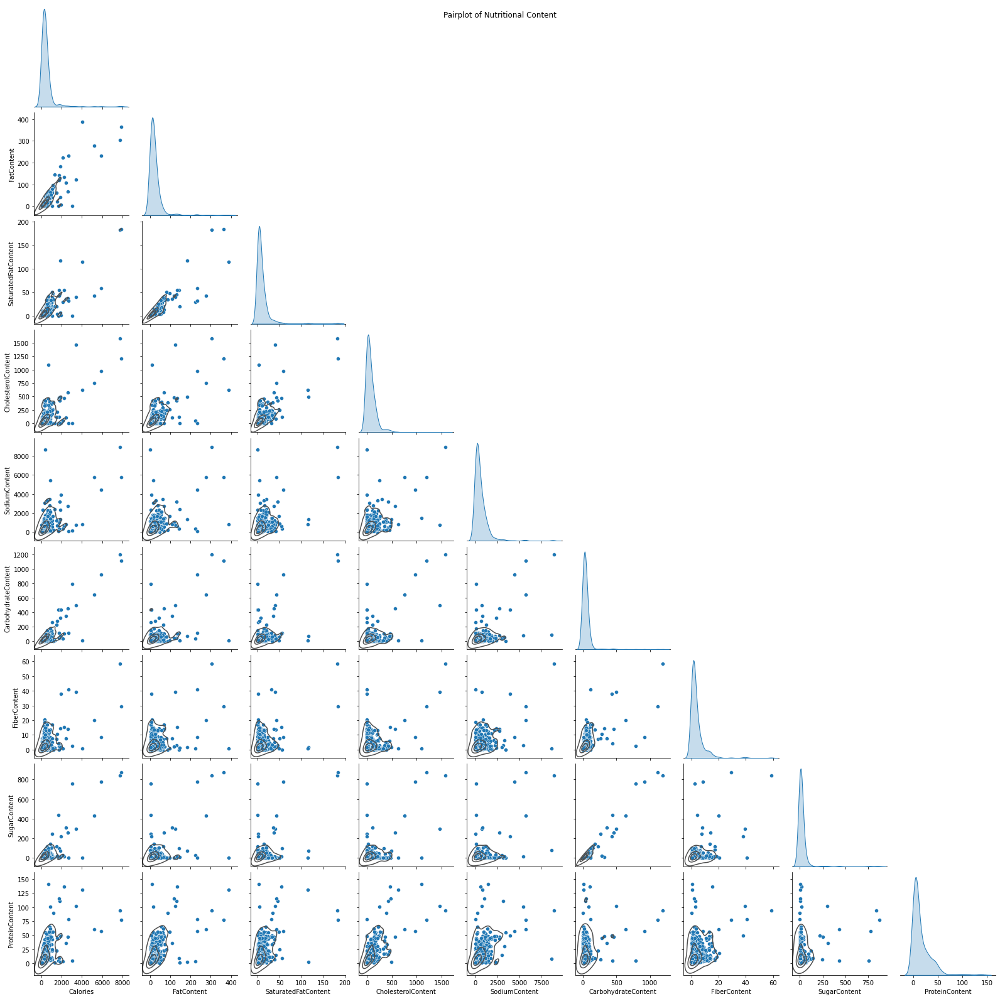

In [ ]:
# Project only the nutritional columns into a new df
df = recipes_df[['Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent']]

# Create and plot this new df using pairplots
pairplot = sns.pairplot(df.sample(500, random_state=42), diag_kind='kde', kind='scatter', corner=True)
pairplot.fig.suptitle('Pairplot of Nutritional Content')
pairplot.map_lower(sns.kdeplot, levels=4, color=".3")
plt.show()

Based on the pairplots above, we can see that some of the highly correlated columns such as `Calories` with `FatContent` and `SaturatedFatContent`have a lot of their distribution to be in the lower end of their distribution which is more dense. However, that correlation isn't as strong it higher values for each of these columns.
The same trend is true for `CholesterolContent` with `Calories`, `FatContent` and `SaturatedFatContent`.

While these plots are very beneficial for additional understanding of correlation, we can see that most of are data is distrubuted at the lower end of their ranges, with some extremely large values which in some cases could be potentially due incorrect inputs from the original writer of the recipe, although this cannot be confirmed.

### **Correlation Analysis on Nutrition Based on Rating**

Given that the above pairplots were not extremely useful, we thought that we might be able to dissect this further. Next we wanted to see if there are any noticeable trends or correlations in the nutritional information when they are split between positive and negatvie reviews.

#### Positive Rating

We begin by plotting pairplots for nutritional content of recipes that have been rated positively, i.e., in this case their rating is above 3 out of 5.

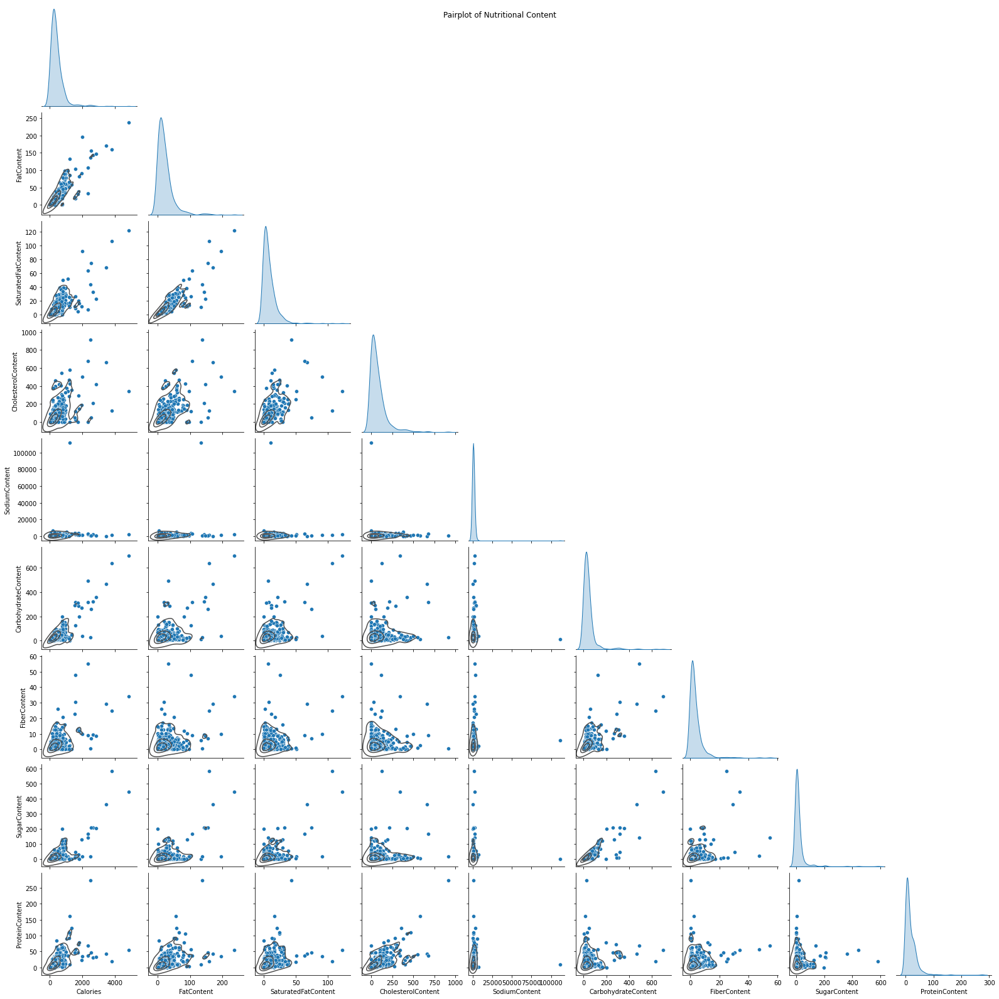

In [ ]:
# Selecting positively rated recipes and projecting correct columns
df = recipes_df[recipes_df['MeanRating'] > 3]
df = df[['Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent']]

# Plotting the pairplot
pairplot = sns.pairplot(df.sample(500, random_state=42), diag_kind='kde', kind='scatter', corner=True)
pairplot.map_lower(sns.kdeplot, levels=4, color=".3")
pairplot.fig.suptitle('Pairplot of Nutritional Content')
plt.show()

Next, we will plot the nutritional content pairplots with recipes that have a negative rating to see if there are any noticeable differences.

#### Negative Rating

We create pairplots for negatively rated recipe nutritional content here. A negative rating is one that is below 3 out of 5.

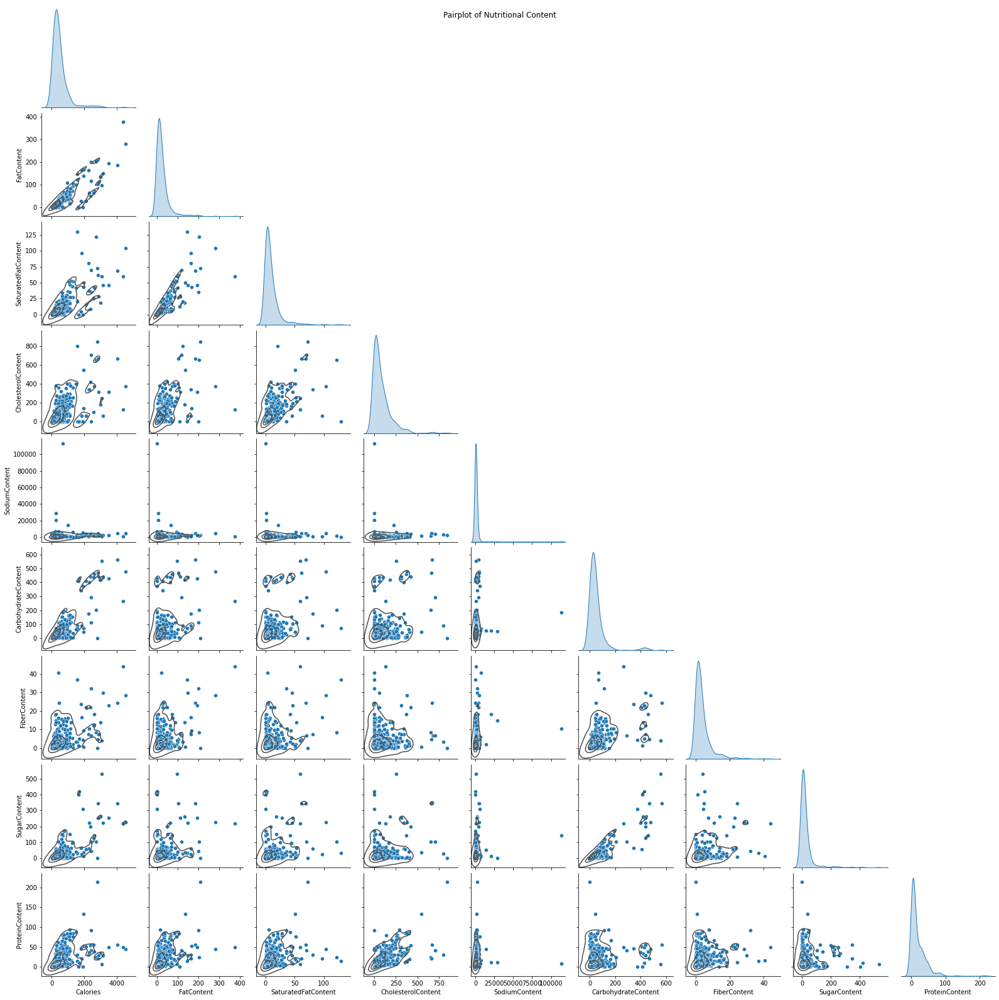

In [ ]:
# Selecting positively rated recipes and projecting correct columns
df = recipes_df[recipes_df['MeanRating'] < 3]
df = df[df['MeanRating'] > 0]
df = df[['Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent']]

# Plotting the pairplot
pairplot = sns.pairplot(df.sample(500, random_state=42), diag_kind='kde', kind='scatter', corner=True)
pairplot.map_lower(sns.kdeplot, levels=4, color=".3")
pairplot.fig.suptitle('Pairplot of Nutritional Content')
plt.show()

At first glance, there is not much difference between the pairpplots of positively reviewed recipe nutrition and the negatively reviewed recipe nutrition. However, one finding we can see is that the distributions of data in the negatively reviewed recipes is slightly more spread out compared to the positively reviewed recipes.

Nonetheless, both the categories of recipes seem to follow the general trends shown by our correlation matrix, so there was not much relevant information extracted from this distinction in this case.

## **Most Frequently Used Ingredients**

One of the columns in our recipes_df is `RecipeIngredientParts`. This has a list of all ingredients for each recipe. We wanted to dissect this information more to understand which ingredients have been most popular on Food.com.

### **Top Ingredients Overall**

In this section, we find the most frequenty used ingredients across all recipes. Since this is presented as a list in recipes_df, we had to extract all individual ingredients in `RecipesIngredientParts` and count each words frequency to get the total number of recipes a specific ingredient is in. This is done below.

In [ ]:
# This code helps in the creation of a dictionary with keys as all ingredients and 
# values as the number of recipes they are featured in
ingredients = recipes_df['RecipeIngredientParts']
inflector = Inflector()
ingredient_list = []

for i in ingredients:
  l = i.strip()
  l = l.split(", ")
  ingredient_list.extend(l)

# creation of a dictionary with an ingredient as key and count of recipes it is in as the value
ingredient_dict = {}
for i in ingredient_list:
  # This is a function that helps make a plural noun into its singular form.
  word = inflector.singularize(i)
  # Edge case correction
  if 'flmy' in word:
    word = word.replace('flmy', 'flour')
  if word in ingredient_dict:
    ingredient_dict[word] += 1
  else:
    ingredient_dict[word] = 1

ingredient_list = []
del ingredient_list
del ingredients

ingredient_dict = {key: val for key, val in sorted(ingredient_dict.items(), key = lambda ele: ele[1], reverse = True)}

Using the dictionary we create above, lets see which ingredients are the most common using a WordCloud!

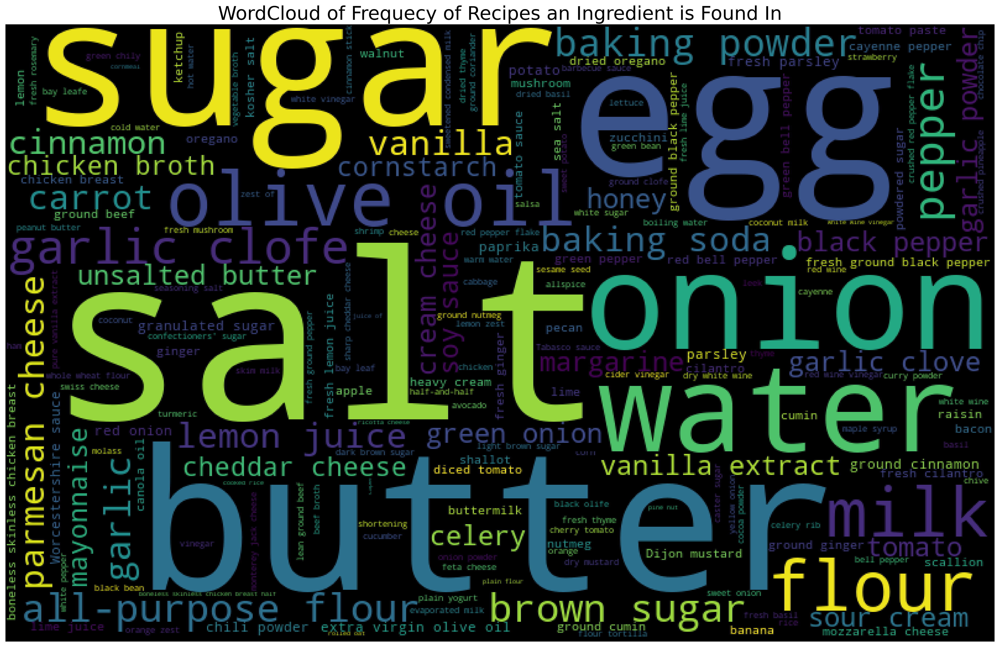

In [ ]:
# Creation of a wordcloud based on ingredient names and their freqencies.
wordcloud = WordCloud(width = 800, height = 500).generate_from_frequencies(ingredient_dict)
plt.figure(figsize=(24,15), dpi=300)
plt.title("WordCloud of Frequecy of Recipes an Ingredient is Found In", fontsize=25)
plt.axis('off')
plt.imshow(wordcloud)

We can see that some of the most common ingredients are salt, butter, egg, and water. That makes sense as these are ingredients commonly used in a lot of ingredients. 

To get a more quantitative visualization of this data, we plot the top 10 ingredients most frequently used ingredients overall and their frequencies.

In [ ]:
#Creating lists of top 10 ingredients and their counts
counter = Counter(ingredient_dict)
top_ingredients = counter.most_common(10)

ing = []
quantity = []

for i in top_ingredients:
  ing.append(i[0])
  quantity.append(i[1])

ing.reverse()
quantity.reverse()

#Plotting the top 10 ingredients into an interactive barchart
fig = px.bar(x=quantity, y=ing, orientation='h', labels={"x": "Number of recipes ", "y": 'Ingredients '}, title="Top 10 ingredients used in Recipes")
fig.update_traces(
    hovertemplate="<br>".join([
        "Ingredient: %{y}",
        "Number of recipes %{y} is in: %{x}",
    ])
)

del counter

fig.show()

As it can be seen from the above, salt is the most common ingredient by a significant margin, followed by butter, eggs and sugar.

A lot of the top 10 ingredients are essentially kitchen/pantry staples. While this is definitely interesting information to know, we somewhat expected most of these to be in the top 10. So we decided to disect this even further in the next section.

### **Top 10 Ingredients by Common Food Types**

Now, we decided to analyze the ingredients_dict created above manually to identify the top 10 ingredients in the following food types:


1.   Vegetables
2.   Fruits
3. Spices
4. Dairy Products
5. Protein (Non-vegetarian)

Using this information, we create multiple additional bar graphs to visual this information.


In [ ]:
df.to_csv("check.csv")

In [ ]:
# We found the rows (using indices) of the top 10 in each category listed.
df = pd.DataFrame.from_dict({'Ingredients': ingredient_dict.keys(), 'NumberOfRecipes': ingredient_dict.values()})
top_vegetables = df.iloc[[4, 9, 19, 26, 32, 39, 60, 61, 68, 71]].sort_values(by='NumberOfRecipes', ascending=True)
top_fruits = df.iloc[[24, 55, 62, 81, 110, 115, 122, 184, 186, 207]].sort_values(by='NumberOfRecipes', ascending=True)
top_spices = df.iloc[[0, 10, 20, 42, 46, 52, 57, 59, 70, 97]].sort_values(by='NumberOfRecipes', ascending=True)
top_dairy_products = df.iloc[[1, 8, 18, 23, 28, 35, 56, 66, 79, 127]].sort_values(by='NumberOfRecipes', ascending=True)
top_protein = df.iloc[[2, 50, 58, 67, 153, 169, 225, 262, 275, 301]].sort_values(by='NumberOfRecipes', ascending=True)
top_protein.iat[6, 0] = 'chicken breast' # reformatted for the plot layout

#Creating overall plot and all subplots for each food type
fig = make_subplots(rows=3, cols=2, start_cell="top-left",
                    subplot_titles=("Top 10 Vegetables", "Top 10 Fruits", "Top 10 Dairy Products", "Top 10 Proteins", "Top 10 Spices"))

fig.add_trace(go.Bar(x=top_vegetables['NumberOfRecipes'],y=top_vegetables['Ingredients'], marker=dict(color="crimson"), orientation='h',
              showlegend=False), row=1, col=1)

fig.add_trace(go.Bar(x=top_fruits['NumberOfRecipes'],y=top_fruits['Ingredients'], marker=dict(color="crimson"), orientation='h',
              showlegend=False),
              row=1, col=2)

fig.add_trace(go.Bar(x=top_dairy_products['NumberOfRecipes'],y=top_dairy_products['Ingredients'], marker=dict(color="crimson"), orientation='h',
              showlegend=False),
              row=2, col=1)

fig.add_trace(go.Bar(x=top_protein['NumberOfRecipes'],y=top_protein['Ingredients'], marker=dict(color="crimson"), orientation='h',
              showlegend=False),
              row=2, col=2)

fig.add_trace(go.Bar(x=top_spices['NumberOfRecipes'],y=top_spices['Ingredients'], marker=dict(color="crimson"), orientation='h',
              showlegend=False),
              row=3, col=1)

#Labelling x-axis for all subplots
fig.update_xaxes(title_text="Number of Recipes", row=1, col=1)
fig.update_xaxes(title_text="Number of Recipes", row=1, col=2)
fig.update_xaxes(title_text="Number of Recipes", row=2, col=1)
fig.update_xaxes(title_text="Number of Recipes", row=2, col=2)
fig.update_xaxes(title_text="Number of Recipes", row=3, col=1)

#Labelling y-axis for all subplots
fig.update_yaxes(title_text="Ingredients", row=1, col=1)
fig.update_yaxes(title_text="Ingredients", row=1, col=2)
fig.update_yaxes(title_text="Ingredients", row=2, col=1)
fig.update_yaxes(title_text="Ingredients", row=2, col=2)
fig.update_yaxes(title_text="Ingredients", row=3, col=1)

#Creating Overall Plot title
fig.update_layout(height=1000, width=1500,
                  title_text="Top Ingredients in Various Common Food Types")

#Formatting hover text
fig.update_traces(
    hovertemplate="<br>".join([
        "Ingredient: %{y}",
        "Number of recipes %{y} is in: %{x}",
    ])
)

fig.show()


These graphs show a few interesting results:


1.   Onion and garlic cloves are the most common vegetables by a significant margin
2.   Tomato is the most commonly used fruit, although it commonly misclassified as a vegetable and is most often used as one. This helps justify its larger usage compared to other fruits.
3. There are relatively less recipes containing non-vegetarian protein products (other than eggs). This was an interesting find, but one that can be justified by the rise in vegetarian and vegan diets, and people caring more for their health. 
4. Salt is the most used ingredient overall and is in significantly more recipes compared to any other spice. The second most used spice is pepper (as expected), which is in approximately 1/4 as many recipes as salt.



## **Nutritional Analysis**

### **Change in Nutrition (Percent of daily limit) over Time**

We begin the analysis of the nutritional information by wanting to understand how healthy these recipes really are on average. We use the [FDA limit for adults](https://ods.od.nih.gov/HealthInformation/nutrientrecommendations.aspx) to find the percent of these nutritional daily limits that are contained in different recipes. Using this percentage of daily limits, now we wanted to see the trend over time in how recipes are being posted. So we plot the yearly trend of the average percentage of daily limits for each nutritional fact.


In [ ]:
# FDA approved daily limits for nutritional information
DL_Calories = 2000
DL_Fat = 78
DL_SatFat = 20
DL_Carb = 275
DL_Sodium = 2300
DL_Fiber = 28
DL_Protein = 50
DL_AddedSugar = 50
DL_Cholestrol = 300

# creating a new dataframe for each nutritional fact as a percentage of daily limits
df = recipes_df[['DatePublished', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent']]
df['Year'] = df['DatePublished'].dt.year
df = df.drop(columns='DatePublished')
df = df.groupby('Year').mean()
df = df.reset_index(drop=False)
df['%ofDL_Calories'] = df['Calories']/DL_Calories * 100
df['%ofDL_Fat'] = df['FatContent']/DL_Fat * 100
df['%ofDL_SatFat'] = df['SaturatedFatContent']/DL_SatFat * 100
df['%ofDL_Cholestrol'] = df['CholesterolContent']/DL_Cholestrol * 100
df['%ofDL_Carb'] = df['CarbohydrateContent']/DL_Carb * 100
df['%ofDL_Sodium'] = df['SodiumContent']/DL_Sodium * 100
df['%ofDL_Fiber'] = df['FiberContent']/DL_Fiber * 100
df['%ofDL_Protein'] = df['ProteinContent']/DL_Protein * 100
df['%ofDL_AddedSugar'] = df['SugarContent']/DL_AddedSugar * 100

df = df.drop(columns=['Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent'])
df = round(df, 2)

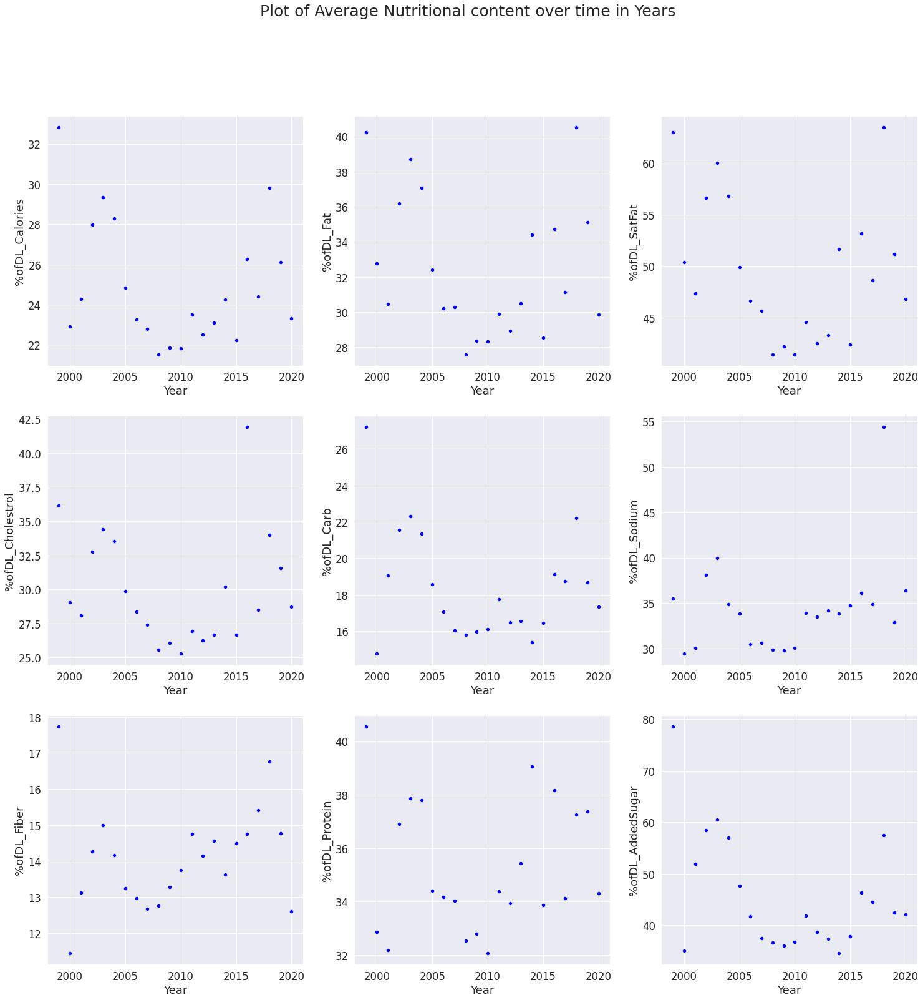

In [ ]:
#Plotting each of the trends for each nutritional fact
sns.set(font_scale=1.5)
fig, axes = plt.subplots(3, 3, figsize=(25, 25))

fig.suptitle('Plot of Average Nutritional content over time in Years', fontsize=25)
sns.scatterplot(data=df, x='Year', y='%ofDL_Calories', ax=axes[0,0], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Fat', ax=axes[0,1], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_SatFat', ax=axes[0,2], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Cholestrol', ax=axes[1,0], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Carb', ax=axes[1,1], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Sodium', ax=axes[1,2], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Fiber', ax=axes[2,0], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_Protein', ax=axes[2,1], color='blue')
sns.scatterplot(data=df, x='Year', y='%ofDL_AddedSugar', ax=axes[2,2], color='blue')
plt.show()

Our plot of average nutritional content can be interpreted as follows:
1. Generally for all the nutrients there is a U-shaped trend with the nutritional content, decreasing around 2010's and increasing after.
Since all the nutrients share a rather common trend, we can assume that there was not a trend for a specific nutrient, but rather, more low nutritional content recipes were uploaded during that period.
2. In contrast to the other nutrients, fiber does have a slow but rising trend as years go by. An interesting fact to support this is that the FDA changed the [recommended daily nutrient values in 2016](https://www.fda.gov/food/food-labeling-nutrition/changes-nutrition-facts-label), to encourage increased fiber consumption. Our plot shows that indeed the rising trend started around 2016, reflecting the change the FDA made.

### Count of Recipes that Exceed Meal Limits over Time

Next, according to [globalnews](https://globalnews.ca/news/3615212/this-is-what-your-breakfast-lunch-and-dinner-calories-actually-look-like/#:~:text=Although%20every%20person's%20daily%20caloric,each%20for%20lunch%20and%20dinner.), on average a person consumes approximately 500-700 calories for lunch and dinner. Since the data we have is per serving, it would be useful to understand what percnt of meals go beyond this limit in a year. Since 700 is 35% of 2000, we use this percentage to evenly distribute the daily values from the FDA guidelines to see how many recipes have nutritional content that exceeds these lunch/dinner requirements.

In [ ]:
# Amount of FDA approved daily limits for nutritional information in a single meal
Meal_Calories = 2000*0.35
Meal_Fat = 78*0.35
Meal_SatFat = 20*0.35
Meal_Carb = 275*0.35
Meal_Sodium = 2300*0.35
Meal_Fiber = 28*0.35
Meal_Protein = 50*0.35
Meal_AddedSugar = 50*0.35
Meal_Cholestrol = 300*0.35

# creating a new dataframe for count within each nutritional fact
df = recipes_df[['DatePublished', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent']]
df['Year'] = df['DatePublished'].dt.year
recipe_meal_count_df = df.groupby('Year').count().reset_index(drop=False)[['Year', 'DatePublished']]
recipe_meal_count_df = recipe_meal_count_df.rename(columns= {'DatePublished': 'TotalCount'})

calories_above_df = df[df['Calories'] > Meal_Calories][['Year', 'Calories']]
calories_above_df = calories_above_df.groupby('Year').count().reset_index(drop=False)
calories_above_df['Calories'] = calories_above_df['Calories']/recipe_meal_count_df['TotalCount'] * 100

fat_above_df = df[df['FatContent'] > Meal_Fat][['Year', 'FatContent']]
fat_above_df = fat_above_df.groupby('Year').count().reset_index(drop=False)
fat_above_df['FatContent'] = fat_above_df['FatContent']/recipe_meal_count_df['TotalCount'] * 100

satfat_above_df = df[df['SaturatedFatContent'] > Meal_SatFat][['Year', 'SaturatedFatContent']]
satfat_above_df = satfat_above_df.groupby('Year').count().reset_index(drop=False)
satfat_above_df['SaturatedFatContent'] = satfat_above_df['SaturatedFatContent']/recipe_meal_count_df['TotalCount'] * 100

carb_above_df = df[df['CarbohydrateContent'] > Meal_SatFat][['Year', 'CarbohydrateContent']]
carb_above_df = carb_above_df.groupby('Year').count().reset_index(drop=False)
carb_above_df['CarbohydrateContent'] = carb_above_df['CarbohydrateContent']/recipe_meal_count_df['TotalCount'] * 100

sodium_above_df = df[df['SodiumContent'] > Meal_Sodium][['Year', 'SodiumContent']]
sodium_above_df = sodium_above_df.groupby('Year').count().reset_index(drop=False)
sodium_above_df['SodiumContent'] = sodium_above_df['SodiumContent']/recipe_meal_count_df['TotalCount'] * 100

chol_above_df = df[df['CholesterolContent'] > Meal_Cholestrol][['Year', 'CholesterolContent']]
chol_above_df = chol_above_df.groupby('Year').count().reset_index(drop=False)
chol_above_df['CholesterolContent'] = chol_above_df['CholesterolContent']/recipe_meal_count_df['TotalCount'] * 100

fiber_above_df = df[df['FiberContent'] > Meal_Fiber][['Year', 'FiberContent']]
fiber_above_df = fiber_above_df.groupby('Year').count().reset_index(drop=False)
fiber_above_df['FiberContent'] = fiber_above_df['FiberContent']/recipe_meal_count_df['TotalCount'] * 100

protein_above_df = df[df['ProteinContent'] > Meal_Protein][['Year', 'ProteinContent']]
protein_above_df = protein_above_df.groupby('Year').count().reset_index(drop=False)
protein_above_df['ProteinContent'] = protein_above_df['ProteinContent']/recipe_meal_count_df['TotalCount'] * 100

sugar_above_df = df[df['SugarContent'] > Meal_AddedSugar][['Year', 'SugarContent']]
sugar_above_df = sugar_above_df.groupby('Year').count().reset_index(drop=False)
sugar_above_df['SugarContent'] = sugar_above_df['SugarContent']/recipe_meal_count_df['TotalCount'] * 100



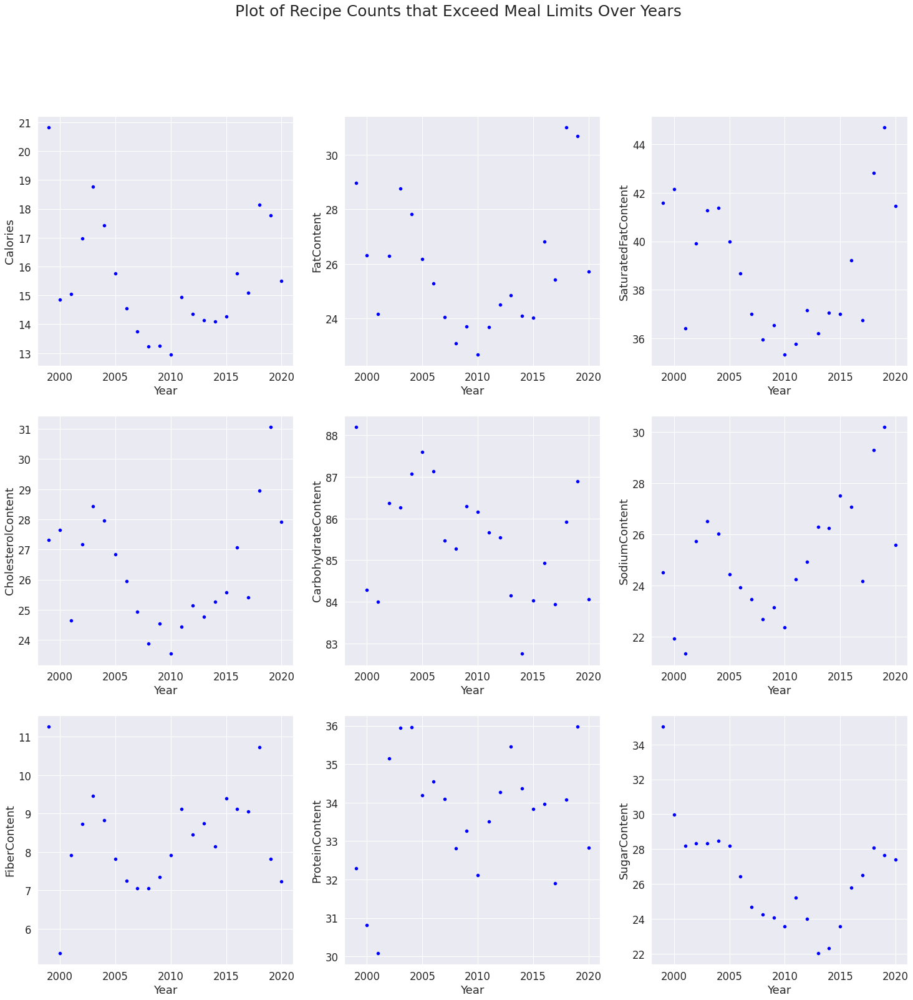

In [ ]:
#Plotting each of the trends for each nutritional fact
sns.set(font_scale=1.5)
fig, axes = plt.subplots(3, 3, figsize=(25, 25))

fig.suptitle('Plot of Recipe Counts that Exceed Meal Limits Over Years', fontsize=25)
sns.scatterplot(data=calories_above_df, x='Year', y='Calories', ax=axes[0,0], color='blue')
sns.scatterplot(data=fat_above_df, x='Year', y='FatContent', ax=axes[0,1], color='blue')
sns.scatterplot(data=satfat_above_df, x='Year', y='SaturatedFatContent', ax=axes[0,2], color='blue')
sns.scatterplot(data=chol_above_df, x='Year', y='CholesterolContent', ax=axes[1,0], color='blue')
sns.scatterplot(data=carb_above_df, x='Year', y='CarbohydrateContent', ax=axes[1,1], color='blue')
sns.scatterplot(data=sodium_above_df, x='Year', y='SodiumContent', ax=axes[1,2], color='blue')
sns.scatterplot(data=fiber_above_df, x='Year', y='FiberContent', ax=axes[2,0], color='blue')
sns.scatterplot(data=protein_above_df, x='Year', y='ProteinContent', ax=axes[2,1], color='blue')
sns.scatterplot(data=sugar_above_df, x='Year', y='SugarContent', ax=axes[2,2], color='blue')

plt.show()

Interestingly, our plot of recipe counts that exceed meal limits seems to have a general trend of U-shape that is quite similar to the trend of our first plot of average nutritional content. This means that with increasing averages of the percentages of daily limit for each nutritional fact, there are more recipes that exceed the meal limit, in each year.

## **Sentiment Analysis of Reviews**

### **Top Words in Reviews**

The reviews_df contains the original reviews received by individual recipes. We wanted to understand to analyse the reviews in more detail. So we first begin by counting the top words found over all the reviews. This is interesting to know to understand how people express their viewpoints on recipe websites such as Food.com.

We create a wordcloud to represent this information.

In [ ]:
# Obtaining commonly used words, i.e. stopwords to remove from the analysis
s_words = set(stopwords.words('english'))

# A function that helps tokenize the reviews
def tokenize_content(content):
  words = nltk.word_tokenize(content)
  words = [x.lower() for x in words]
  words = [x for x in words if x not in s_words and x.isalpha()]
  return words

df = reviews_df.copy()

# Tokenizing the reviews
df["tokenized"] = reviews_df["Review"].apply(lambda x: tokenize_content(x))

# creating individual word list
review_tokens = df['tokenized'].tolist()
word_tokens = [x for sublist in review_tokens for x in sublist]

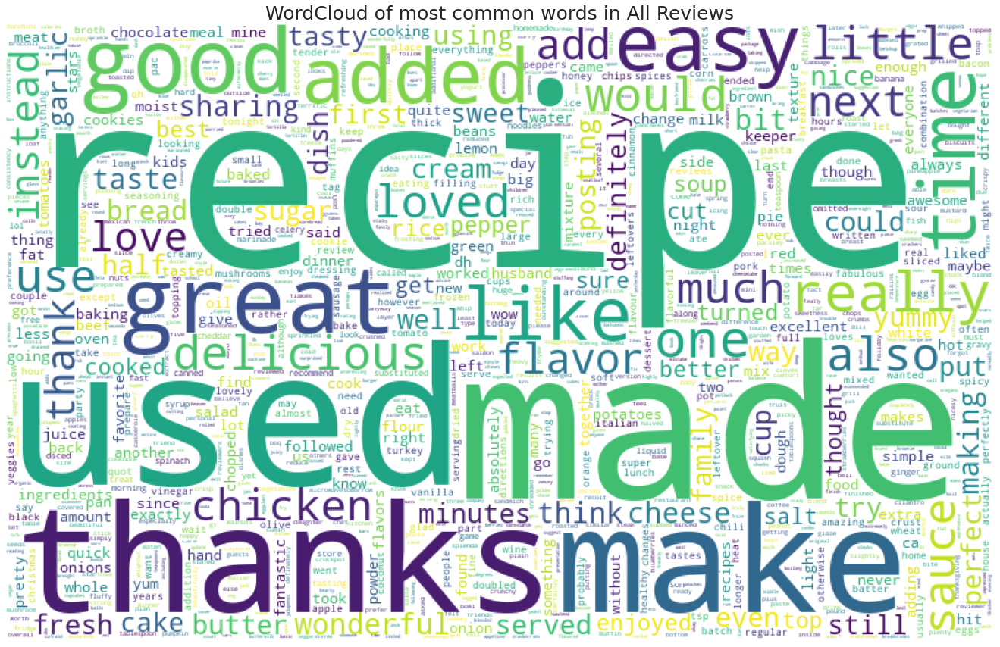

In [ ]:
# creating a wordcloud based on the word tokens created
cloud = WordCloud(width = 800, height = 500, max_words=len(word_tokens), background_color='white').fit_words(Counter(word_tokens))
plt.figure(figsize=(24, 15))
plt.title("WordCloud of most common words in All Reviews", fontsize=25)
plt.imshow(cloud)
plt.axis("off")
plt.show()

Based on the wordcloud, it can be seen that the most commonly used words in reviews are recipe, used, made, thanks and make. Whilw this is certainly interesting, it would be helpful to see how the wordclouds of positive and negative reviews differ from one another. We explore that next.

In [ ]:
# Deleting variables no longer needed to save memory
del review_tokens
del word_tokens

### **Top Words in Positive and Negative Reviews Respectively**

We start by using the `SentimentIntensityAnalyzer` to extract the compound score of the different reviews. This gives us a raw sentiment rating for each review associated with a recipe.

In [ ]:
#Creating sentiment scores for all reviews
sia = SentimentIntensityAnalyzer()

# This function helps retrieve the compound polarity score for sentiment analysis
def retrieve_sentiment(content):
  score = sia.polarity_scores(content)
  return score["compound"]

# Creating new column for sentiment
df["sentiment"] = df["Review"].apply(lambda x: retrieve_sentiment(x))
df = df.sort_values(by="sentiment", ascending=False)

Next, since we want to compare this to the Mean Rating down the line, we scale this value to be within the range of 0.5 to 5.

In [ ]:
# Scaling Sentiment ratings
scaler = MinMaxScaler(feature_range=(0.5,5))
check = scaler.fit_transform(df[['sentiment']])
df['sentiment_scaled'] = check

Now that we have the scaled Sentiment ratings calculated, we divide the reviews based on whether they were positive (i.e. a sentiment rating greater than 3) or if they were negative (i.e. a sentiment rating less than 3)

Next, we create wordclouds based on the positive and negative reviews respectively to see if there are any differences in commonly used words in these different reviews. Below is the positive review wordcloud.

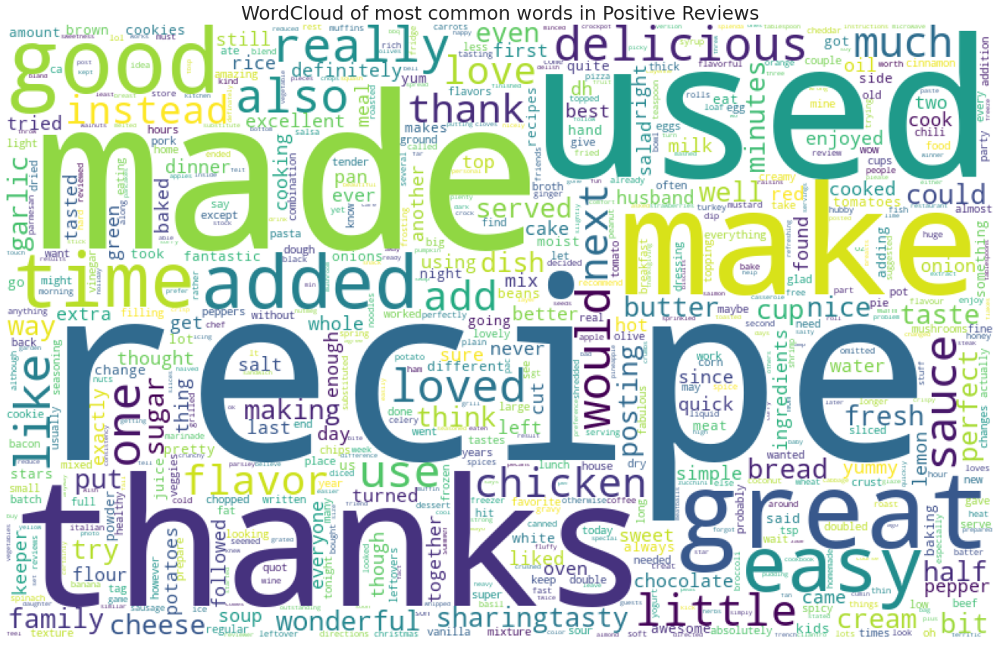

In [ ]:
# Positive reviews are ones with sentiment_scaled > 3
positive_reviews_analysed_df = df[df['sentiment_scaled'] > 3]
positive_review_tokens = positive_reviews_analysed_df['tokenized'].tolist()
positive_word_tokens = [x for sublist in positive_review_tokens for x in sublist]

# Creating wordcloud for positive reviews
cloud_pos = WordCloud(width = 800, height = 500, max_words=len(positive_word_tokens), background_color='white').fit_words(Counter(positive_word_tokens))
plt.figure(figsize=(24, 15))
plt.title("WordCloud of most common words in Positive Reviews", fontsize=25)
plt.imshow(cloud_pos)
plt.axis("off")
plt.show()

In [ ]:
del positive_review_tokens
del positive_word_tokens

Next, we have the negative reviews wordcloud.

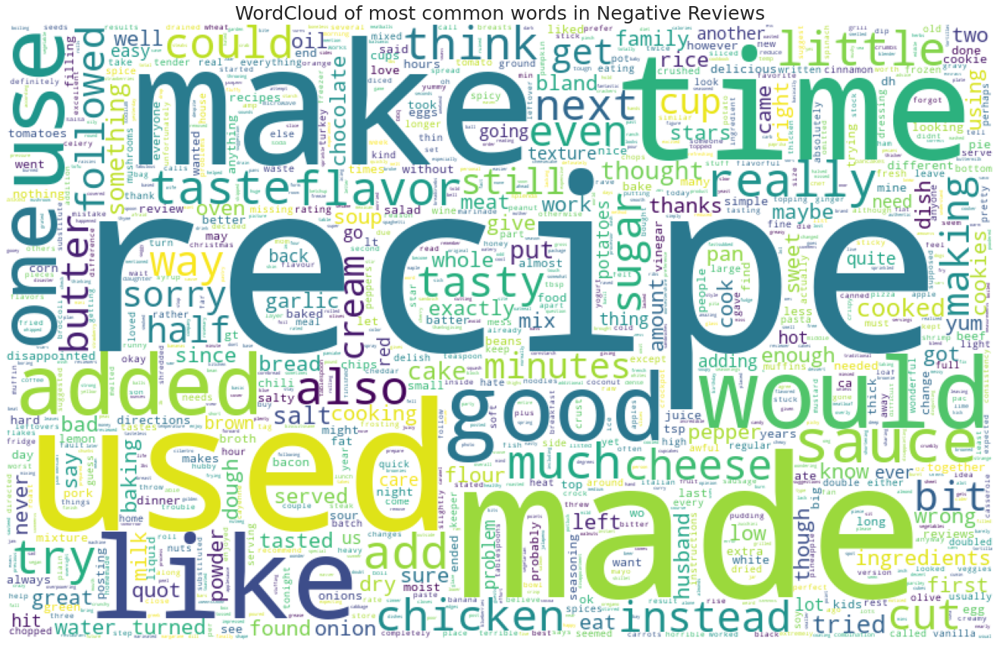

In [ ]:
# Negative reviews are ones with sentiment_scaled < 3
negative_reviews_analysed_df = df[df['sentiment_scaled'] < 3]
negative_review_tokens = negative_reviews_analysed_df['tokenized'].tolist()
negative_word_tokens = [x for sublist in negative_review_tokens for x in sublist]

#Creating wordcloud for negative reviews
cloud_neg = WordCloud(width = 800, height = 500, max_words=len(negative_word_tokens), background_color='white').fit_words(Counter(negative_word_tokens))
plt.figure(figsize=(24, 15))
plt.title("WordCloud of most common words in Negative Reviews", fontsize=25)
plt.imshow(cloud_neg)
plt.axis("off")
plt.show()

Rather unsurprisingly, it can be seen that the rather popular words used are quite similar between both positive and negative reviews. The words like 'recipe', 'used', 'made' and 'make' are the most popular in both types of reviews. 

However, there are certain words and nuances that definitely can be seen. For example some additionally popular words in the positive reviews that are not as popular in the negative reviews are 'great', 'loved' and 'delicious'. Similarly, some popular words in the negative reviews that are not as popular in the popular reviews are 'would', 'sauce', 'little' and 'instead'. 

Surprisingly there are some words that more often than not have a positive connotation that are very popular in the negatvie reviews - 'like', 'good' and even 'tasty'. This is interesting and it might be possible that on websites like Food.com, people use these seemingly positive sounding words in a negative context.

### **Correlation of Sentiment Rating with Mean Rating**

In this section, we use the sentiment calculated in the previous section and analyze its correlation with the MeanRating for a given recipe. We want to see if there is actually a correlation between the rating and the review and to what extent that correlation is present. 

To do so, we merge the recipes_df with the newly created dataframe for sentiments are find the average for each recipe. Then we find the correlation between these two columns and create a pairplot to analyze the relationship further.

In [ ]:
# Merging Sentiment Ratings with Mean Ratings in a new df
rating_sentiment_df = pd.merge(recipes_df[['RecipeId', 'MeanRating']], df[['RecipeId', 'sentiment_scaled']], left_on='RecipeId', right_on='RecipeId', how='left')
rating_sentiment_df = rating_sentiment_df[rating_sentiment_df['MeanRating'] > 0]
rating_sentiment_df = rating_sentiment_df.groupby('RecipeId').mean().reset_index(drop=False)
rating_sentiment_df = rating_sentiment_df.rename(columns={'sentiment_scaled': 'SentimentRating'})

In [ ]:
#Finding and printing the correlation coefficient between MeanRating and SentimentRating
corr = rating_sentiment_df[['MeanRating', 'SentimentRating']].corr()
print('Correlation coefficient between MeanRating and SentimentRating = ' + str(round(corr.iat[0,1], 2)))

Correlation coefficient between MeanRating and SentimentRating = 0.39


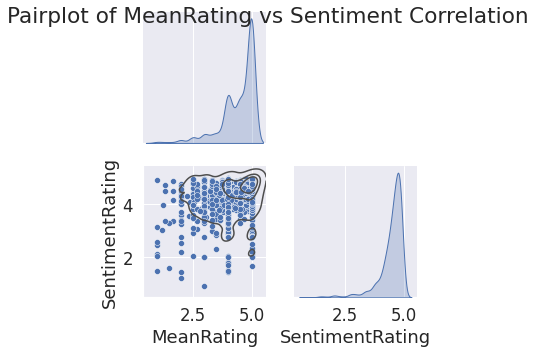

In [ ]:
# Plotting a pairplot of the Mean Rating and Sentiment Rating
pairplot = sns.pairplot(rating_sentiment_df[['MeanRating', 'SentimentRating']].sample(2000, random_state=42), diag_kind='kde', kind='scatter', corner=True)
pairplot.fig.suptitle('Pairplot of MeanRating vs Sentiment Correlation')
pairplot.map_lower(sns.kdeplot, levels=4, color=".3")
plt.show()


This is an interesting result. We initially thought that the `MeanRating` (i.e. the rating given by the reviewer) would be relatively highly correlated with `SentimentRating` (the sentiment extracted from the review itself). However, we see that the correlation coefficient is only 0.4 which means that it is slightly correlated, but not to the degree we expected.

The pairplot above showcases an interesting finding about our data additonally. Both of our `MeanRating` and `SentimentRating` have majority of their values in the higher rating range. That is something that has remained consistent even in the sentiments found on analyzing the reviews.

## **Analyzing Food.com Publishing and Review Trends**

### **Counts of Recipes published and Reviews given per year**

This section aims to analyze the time series data provided to us, specifically in terms of `DatePublished` for recipes and `DateModified` for reviews. 

While we don't have website traffic information, to analyze how popular Food.com has been over the years, we can determine the number of recipes published year over year and the number of people reviewing recipes year over year. This would help us get a good idea of how active people are in terms of their use of this website over time.


In [ ]:
# Creating a dataframe for counts of recipes published
df = recipes_df.copy()[['DatePublished', 'RecipeId']]
df['Year'] = df['DatePublished'].dt.year
df = df.drop(columns=['DatePublished'])
df = df.groupby('Year').count().reset_index(drop=False)

#Creating a dataframe for counts of reviews given/modified
rev_over_time_df = reviews_df.copy()[['DateModified', 'ReviewId']]
rev_over_time_df['Year'] = rev_over_time_df['DateModified'].dt.year
rev_over_time_df = rev_over_time_df.drop(columns=['DateModified'])
rev_over_time_df = rev_over_time_df.groupby('Year').count().reset_index(drop=False)

# Merging boht created dataframes and dropping nulls
df = pd.merge(df, rev_over_time_df, left_on='Year', right_on='Year', how='left')
df = df.dropna()

# Renaming columns for clarity in plot
df = df.rename(columns={'RecipeId': 'NumberOfPublishedRecipes', 'ReviewId': 'NumberOfReviews'})

#Plotting the counts of recipes published and reviews given in a year on the same plot
# with dual axes
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=df['Year'], y=df['NumberOfPublishedRecipes'], name="Number of Recipes Published"), secondary_y=False)
fig.add_trace(go.Scatter(x=df['Year'], y=df['NumberOfReviews'], name="Number of Reviews Given"), secondary_y=True)
fig.update_layout(title_text="Number of recipes published and reviews given every year")
fig.update_xaxes(title_text="Years")
fig.update_yaxes(title_text="Counts of Published Recipes", secondary_y=False)
fig.update_yaxes(title_text="Counts of Reviews given", secondary_y=True)
fig.show()

Interestingly, the year over year counts of recipes published and reviews given follow a very similar trend. It can be seen that the period where there was the most activity on Food.com was during the period of 2006 to 2009. The peak recipes published was during 2007 and the peak reviews given was during 2008.

We also see a significant drop in the activity of people interacting with Food.com after that peak. This could be due to the competition from various other websites in recent years. Additionally, these days people post recipes, videos and photos about food on Youtube and Instagram. These have most likely taken a large share of the user base of recipe websites.


### **Counts of Recipes published and Reviews given per month**

Based on the results from our per year analysis above, we became curious about whether there were specific times of the year that people were more actively engaging with the website. To understand this further, we determine the number of recipes published in a given month (over all years) and the number of people reviewing recipes in a given month (over all years). 

In [ ]:
# Creating a dataframe for counts of recipes published
df = recipes_df.copy()[['DatePublished', 'RecipeId']]
df['Month'] = df['DatePublished'].dt.month
df = df.drop(columns=['DatePublished'])
df = df.groupby('Month').count().reset_index(drop=False)

#Creating a dataframe for counts of reviews given/modified
rev_over_time_df = reviews_df.copy()[['DateModified', 'ReviewId']]
rev_over_time_df['Month'] = rev_over_time_df['DateModified'].dt.month
rev_over_time_df = rev_over_time_df.drop(columns=['DateModified'])
rev_over_time_df = rev_over_time_df.groupby('Month').count().reset_index(drop=False)

# Merging boht created dataframes and dropping nulls
df = pd.merge(df, rev_over_time_df, left_on='Month', right_on='Month', how='left')
df = df.dropna()

# Renaming columns for clarity in plot
df = df.rename(columns={'RecipeId': 'NumberOfPublishedRecipes', 'ReviewId': 'NumberOfReviews'})

#Plotting the counts of recipes published and reviews given in a year on the same plot
# with dual axes
fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=df['Month'], y=df['NumberOfPublishedRecipes'], name="Number of Recipes Published"), secondary_y=False)
fig.add_trace(go.Scatter(x=df['Month'], y=df['NumberOfReviews'], name="Number of Reviews Given"), secondary_y=True)
fig.update_layout(title_text="Number of recipes published and reviews given every year")
fig.update_xaxes(title_text="Months")
fig.update_yaxes(title_text="Counts of Published Recipes", secondary_y=False)
fig.update_yaxes(title_text="Counts of Reviews given", secondary_y=True)
fig.show()

We can see based on the results of the graph there are various periods of spikes in the number of recipes published and reviews given by month. The largest number of recipes published and reviews given are during the month of January. The next highest number of recipes published is during May. The next highest number of reviews given is during December.

According to these [statistics](https://www.similarweb.com/website/food.com/#traffic), Food.com’s majority web traffic is from the USA. So, given this is true, we can try to analyze these publishing and review patterns based on US seasons and festivals. It might be possible that people publish more recipes in the beginning of summer (May) as there are more people willing to cook (students for example) and with the warm weather, people are more likely to have potlucks and picnics.

There is a spike in recipes published around October and November as well. This is probably a precursor to Thanksgiving and Christmas related foods. The largest peak in January can be attributed to the start of the new year and people posting new ideas for the advent of the new year. The spike in review in January can be attributed to the same.

There is also a spike in reviews in January due to people reviewing foods they potentially cooked for Thanksgiving or Christmas.


### **Change in Average Recipe Instructions Length over Time**

We were very interested in the trend of recipe lengths over time. Have people been writing even more detailed recipes, or have they been in favor of brevity to make things less complicated? How receptive have users been to different recipe lengths? We wanted to examine this trend over time, so we plot the change in the average recipe lengths over time (month and year).

In [ ]:
# Creation of dataframe for average instructions length over time (month and year)
df = recipes_df.copy()[['DatePublished', 'RecipeInstructionsCharCount']]
df['MonthByYear'] = df['DatePublished'].dt.to_period('M')
df = df.groupby('MonthByYear').mean().reset_index(drop=False)

# Plotting trend over time
fig = go.Figure(data=go.Scatter(x=df['MonthByYear'].astype(str), y = df['RecipeInstructionsCharCount']))
fig.update_layout(title_text="Change in Average Recipe Length Over Time")
fig.update_xaxes(title_text="Month and Year")
fig.update_yaxes(title_text="Average Recipe Instructions length (characters)")

fig.show()

It can be seen from the graph above that the graph has many ups and downs but the overall trend throughout the years shows that recipe lengths have been increasing over time. This is fascinating as this means people are more receptive to detailed recipe instructions. Additionally, it could mean recipes have been becoming more complicated over time as well. These are certainly fascinating trends that we were able to uncover.

# **Regression Models**

Here we add `Sentiment Rating` as a feature to recipes_df for use in our modeling.

In [ ]:
# Adding Sentiment Rating as a feature to recipes_df
recipes_df = pd.merge(recipes_df, rating_sentiment_df[['RecipeId', 'SentimentRating']], left_on='RecipeId', right_on='RecipeId', how='left')
recipes_df['SentimentRating'] = recipes_df['SentimentRating'].apply(lambda x: round(replace_nan_with_zero(x),2))

## **Predicting FiberContent**

In this section, we explore various methods to predict the fiber content of a dish based on its recipe information. Recipe websites like food.com have a vibrant community of amateur and professional cooks who come up with a wide variety of creative recipes. Even though more and more cooks have started to care about the nutrition offered by the food they cook and consume themselves, it can be very difficult and time consuming for them to precisely calculate the nutrient composition of their dishes. It can be simple to understand the nutritional composition of individual raw ingredients but understanding how they all come together in a dish is a complex task.

We want to specifically focus on predicting fiber content (and cholesterol content in the later sections) because we feel that these are two nutrients that can be especially difficult for people to gauge compared to other nutrients that are more obvious (such as carbohydrates, proteins and fats). Despite it being crucial to incorporate enough fiber into the diet on a regular basis for healthy bodily function, only 5% of men and 8% of women are meeting the [daily requirement](https://nutrition.org/most-americans-are-not-getting-enough-fiber-in-our-diets/) in the United States. We hope that our models can encourage people to increase their fiber intake by making it easier for them to track it.

We evaluate our model based on two metrics - coefficient of determination (R^2) and the root mean squared error (RMSE). The R^2 value helps evaluate how good the fit of the model is and how well the variance of the label (fiber) is explained by our model. The RMSE value is helpful to have a more interpretable value to understand how well our model is performing. It helps determine by how much on average our model is incorrectly predicting (by showing the deviation in the units of the label itself).


For simplicity, we start by including only all numeric columns in our dataset. We split our entire dataset into a training set (80%) and a test set (20%) and separate the inputs from the labels. This split is consistent across all of our models.


In [ ]:
# Selecting columns for regression and projecting to new df
columns_for_rating_linear = ['CookTime', 'PrepTime', 'NumberOfIngredientParts', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 
                               'CarbohydrateContent', 'SodiumContent', 'SugarContent', 'ProteinContent', 'SentimentRating', 'MeanRating', 'FiberContent']

recipes_model_df = recipes_df[columns_for_rating_linear]

# Seperating features and y value 
features = recipes_model_df.drop(columns=['FiberContent'])
fiber = recipes_model_df['FiberContent']

# Creating train-test split
x_train, x_test, y_train, y_test = train_test_split(features, fiber, random_state = 42, test_size = 0.2)

It is essential to scale the data to make it easier for our models to learn a relationship. Not doing this would make our predictions more unstable and it might take our models longer to reach convergence due to large spreads in certain columns. This is why we standardize all our numeric columns below. 

In [ ]:
# Scaling features using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

### **Rule-Based Baseline Model**

To establish a benchmark for what a good model’s performance should look like, we predict fiber content for a recipe using a naive model that predicts the mean fiber content every time.  


In [ ]:
# Using DummyRegressor for the rule-based model. Fitting and predicting using this model
regression = DummyRegressor(strategy="mean")
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for mean rule based baseline model: ' + str(round(score, 6)))
print('Root mean squared error (RMSE) for mean rule based baseline model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 6)))

Coefficient of determination (R^2) for mean rule based baseline model: -2e-06
Root mean squared error (RMSE) for mean rule based baseline model: 11.470354


We can see here that the test set R^2 for this baseline model is very low, close to 0. This makes sense as it is not trying to learn anything about the real trends present in the data so the fit between the model and the data is very bad. The RMSE is 11.47 which means that this model’s predictions for the fiber content deviate from the actual values by around 11g which is very significant as on average, dishes in our dataset have around 3.8g to begin with (as seen in the EDA section).

### **Linear Regression for Predicting FiberContent**

#### **Baseline Linear Regression**

Next, we try to understand how well a simple linear regression model with no regularization can perform on the same dataset.

In [ ]:
# Fitting Linear Regression and evaluating performance
regression = LinearRegression()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for linear regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression model: 0.525
Root mean squared error (RMSE) for linear regression model: 7.903


We can see that the R^2 score on the test set is much higher compared to that of the baseline model at 0.525. The test RMSE suggests that the model’s predictions deviate from the actual fiber content by 7.903g on average. This is still quite significant given the average fiber content each dish has. To try to improve on this performance, in the next section we will also incorporate richer, more descriptive text features into our training and test set.

#### **Additional Feature Extraction**

For our models to be able to leverage text features such as recipe ingredients and recipe instructions for their learning, we need to somehow convert them into numbers. For this, we make use of [fasttext](https://fasttext.cc/) - an open source library developed by Facebook research to efficiently transform text into a representation that can be used by ML models for learning. 

In the following sections we convert each of the text columns into multiple numeric embedding columns by first combining all the contents of the entire column into a text file and training fasttext on it. Finally, we use this trained model to convert the string in each row to 10 different numeric columns.


We start with `RecipeIngredientParts`, this column contains a list of all the ingredients the recipe uses.

In [ ]:
# Cleaning the data
clean = recipes_df['RecipeIngredientParts'].apply(lambda x: x.replace(",", "").replace("\n", " ").replace(".","").lower())

#Converting to a csv file locally to use as an input to fasttext
clean.to_csv('ingredients.txt', header=None, index=None, sep='\n')

# Training fasttext
ft = fasttext.train_unsupervised('ingredients.txt', dim=10)

# Creating vector for the feature
recipes_df['IngredientsVector'] = clean.apply(lambda x: ft.get_sentence_vector(str(x)))

# Exploding vector into different columns
recipes_df[['IngVec0', 'IngVec1','IngVec2', 'IngVec3', 'IngVec4', 'IngVec5', 'IngVec6', 'IngVec7', 'IngVec8', 'IngVec9']] = pd.DataFrame(recipes_df['IngredientsVector'].tolist(), index= recipes_df.index)

# Dropping combined vector column
recipes_df = recipes_df.drop(columns=['IngredientsVector'])

Now we apply the same method on the `Description` column. It contains a short description of the recipe (just a couple sentences long) put down by the author which is the very first thing any reader would see on the page. 

In [ ]:
# Cleaning the data
clean = recipes_df['Description'].apply(lambda x: x.replace(",", "").replace("\n", " ").replace(".","").lower())

#Converting to a csv file locally to use as an input to fasttext
clean.to_csv('description.txt', header=None, index=None, sep='\n')

# Training fasttext
ft = fasttext.train_unsupervised('description.txt', dim=10)

# Creating vector for the feature
recipes_df['DescriptionVector'] = clean.apply(lambda x: ft.get_sentence_vector(str(x)))

# Exploding vector into different columns
recipes_df[['DescVec0', 'DescVec1','DescVec2', 'DescVec3', 'DescVec4', 'DescVec5', 'DescVec6', 'DescVec7', 'DescVec8', 'DescVec9']] = pd.DataFrame(recipes_df['DescriptionVector'].tolist(), index= recipes_df.index)

# Dropping combined vector column
recipes_df = recipes_df.drop(columns=['DescriptionVector'])

The `RecipeCategory` column contains a few words that can be used to understand what high-level category the dish may belong to

In [ ]:
# Cleaning the data
clean = recipes_df['RecipeCategory'].apply(lambda x: x.replace(",", "").replace("\n", " ").replace(".","").lower())

#Converting to a csv file locally to use as an input to fasttext
clean.to_csv('category.txt', header=None, index=None, sep='\n')

# Training fasttext
ft = fasttext.train_unsupervised('category.txt', dim=10)

# Creating vector for the feature
recipes_df['CategoryVector'] = clean.apply(lambda x: ft.get_sentence_vector(str(x)))

# Exploding vector into different columns
recipes_df[['CatVec0', 'CatVec1','CatVec2', 'CatVec3', 'CatVec4', 'CatVec5', 'CatVec6', 'CatVec7', 'CatVec8', 'CatVec9']] = pd.DataFrame(recipes_df['CategoryVector'].tolist(), index= recipes_df.index)

# Dropping combined vector column
recipes_df = recipes_df.drop(columns=['CategoryVector'])

The `Keywords` column contains a list of hashtag-like words that describe what kind of recipe it might be.


In [ ]:
# Cleaning the data
clean = recipes_df['Keywords'].apply(lambda x: x.replace(",", "").replace("\n", " ").replace(".","").lower())

#Converting to a csv file locally to use as an input to fasttext
clean.to_csv('keywords.txt', header=None, index=None, sep='\n')

# Training fasttext
ft = fasttext.train_unsupervised('keywords.txt', dim=5)

# Creating vector for the feature
recipes_df['KeywordsVector'] = clean.apply(lambda x: ft.get_sentence_vector(str(x)))

# Exploding vector into different columns
recipes_df[['KeyVec0', 'KeyVec1','KeyVec2', 'KeyVec3', 'KeyVec4']] = pd.DataFrame(recipes_df['KeywordsVector'].tolist(), index= recipes_df.index)

# Dropping combined vector column
recipes_df = recipes_df.drop(columns=['KeywordsVector'])

The `RecipeInstructions` column contains the recipe itself consisting of the step by step instructions that people would have to follow to create the dish.


In [ ]:
# Cleaning the data
clean = recipes_df['RecipeInstructions'].apply(lambda x: x.replace(",", "").replace("\n", " ").replace(".","").lower())

#Converting to a csv file locally to use as an input to fasttext
clean.to_csv('instructions.txt', header=None, index=None, sep='\n')

# Training fasttext
ft = fasttext.train_unsupervised('instructions.txt', dim=10)

# Creating vector for the feature
recipes_df['InstructionsVector'] = clean.apply(lambda x: ft.get_sentence_vector(str(x)))

# Exploding vector into different columns
recipes_df[['InsVec0', 'InsVec1','InsVec2', 'InsVec3', 'InsVec4', 'InsVec5', 'InsVec6', 'InsVec7', 'InsVec8', 'InsVec9']] = pd.DataFrame(recipes_df['InstructionsVector'].tolist(), index= recipes_df.index)

# Dropping combined vector column
recipes_df = recipes_df.drop(columns=['InstructionsVector'])

Here we just delete two variables that are not needed anymore to save memory.

In [ ]:
# Deleting variables to save memory
del clean
del ft

Saving the new dataset including all newly added fasttext features as a csv file for backup purposes. Fasttext is also non-deterministic to some extent, so this file can be reloaded to maintain deterministic results down the line. It is commented out for now.

In [ ]:
#recipes_df.to_csv('/content/drive/My Drive/recipes_with_text_features.csv', index=False)
#recipes_df = read_csv('/content/drive/My Drive/recipes_with_text_features.csv')

#### **Linear Regression with Additional Text-based Features**

Now let’s investigate whether incorporating these text embeddings into our model helps with improving its performance. In this block, we create a new training and test set with the same split (80-20) that includes these new features.


In [ ]:
# Selecting columns for regression and projecting to new df
columns_for_rating_linear = [ 'CookTime', 'PrepTime', 'NumberOfIngredientParts', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 
                               'CarbohydrateContent', 'SodiumContent', 'SugarContent', 'ProteinContent', 'SentimentRating', 'MeanRating', 'IngVec0', 'IngVec1',
                             'IngVec2', 'IngVec3', 'IngVec4', 'IngVec5', 'IngVec6', 'IngVec7', 'IngVec8', 'IngVec9',
                             'DescVec0', 'DescVec1','DescVec2', 'DescVec3', 'DescVec4', 'DescVec5', 'DescVec6', 'DescVec7', 
                             'DescVec8', 'DescVec9', 'CatVec0', 'CatVec1','CatVec2', 'CatVec3', 'CatVec4', 'CatVec5', 'CatVec6', 'CatVec7', 'CatVec8', 'CatVec9', 
                             'KeyVec0', 'KeyVec1','KeyVec2', 'KeyVec3', 'KeyVec4', 'InsVec0', 'InsVec1','InsVec2', 'InsVec3', 'InsVec4', 'InsVec5', 
                             'InsVec6', 'InsVec7', 'InsVec8', 'InsVec9', 'FiberContent']

recipes_model_df = recipes_df[columns_for_rating_linear]

# Seperating features and y value
features = recipes_model_df.drop(columns=['FiberContent'])
fiber = recipes_model_df['FiberContent']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, fiber, random_state = 42, test_size = 0.2)

We scale the data as before to give our model data that will be easier for it to deal with and for useability with our regularization methods.

In [ ]:
# Scaling features using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In this block we train the same linear regression model used before on our new set of features. 

In [ ]:
# Fitting and evaluating model
regression = LinearRegression()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for linear regression model (with additional features): ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression model (with additional features): ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression model (with additional features): 0.551
Root mean squared error (RMSE) for linear regression model (with additional features): 7.685


We can see that both the test R^2 score and test RMSE improved slightly. The 0.551 R^2 score is an increase from the previous 0.525. The 7.685 RMSE is a decrease from the previous 7.903. This indicates that the additional features helped our model achieve a better fit and lower error. However, this isn’t a huge change so we will next be looking into improving the model further by finding ways to prevent overfitting.

#### **Linear Regression with PCA**

We now use Principal Component Analysis to understand which features can explain the most variance in the labels (fiber content) so we can avoid overcomplicating the model with unnecessary features.

In [ ]:
# PCA to fit to training data and finding optimal number of components
pca = PCA()
pca.fit(x_train)
explained_variance_ratios = pca.explained_variance_ratio_
cum_evr = []
sum = 0
for r in explained_variance_ratios:
  sum += r
  cum_evr.append(sum)
cum_evr = np.array(cum_evr)

Here we visualize the result of the analysis.


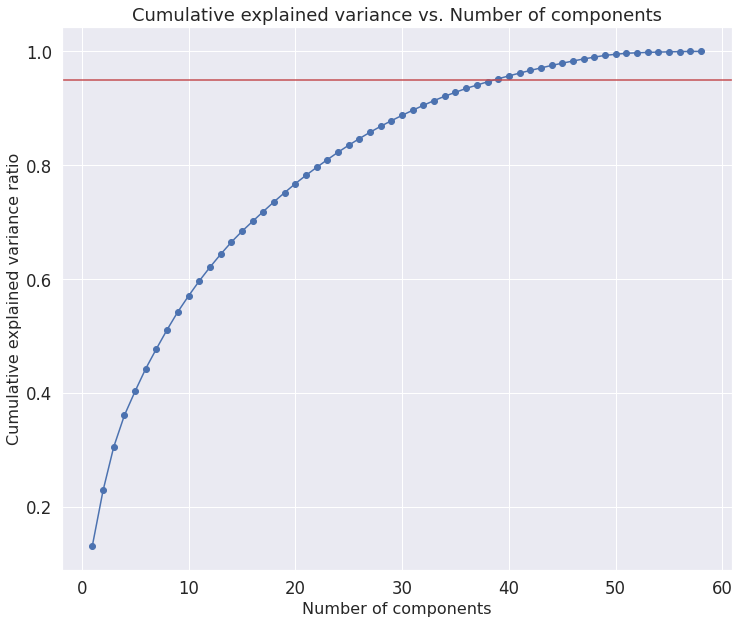

In [ ]:
# Plotting Cumulative explained variance vs. Number of components
number = range(1, len(explained_variance_ratios)+1)
plt.figure(figsize=(12, 10))
plt.scatter(number, cum_evr)
plt.plot(number, cum_evr)
plt.axhline(y = 0.95, color = 'r', linestyle = '-')
plt.xlabel("Number of components", fontsize=16)
plt.ylabel("Cumulative explained variance ratio", fontsize=16)
plt.title("Cumulative explained variance vs. Number of components", fontsize=18)
plt.show()

The plot suggests that 95% of the variance in the fiber content can be explained by just 39 new compressed features (the principal components). Hence, if we use just these 39 components instead of all the original 58 we would reduce the number of features used by over 32% while still retaining 95% of the variance in the training set.


 Let’s now see whether training our model on this simplified, reduced feature set helps us still achieve a good performance.

In [ ]:
# Determine number of PCA components to explain 95% variance
num_comp = 0
while cum_evr[num_comp] < 0.95:
  num_comp += 1
num_comp += 1

# Using PCA to reduce dimensionality
pca = PCA(n_components= num_comp)
pca.fit(x_train)
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

# Running Linear Regression with PCA transformed data
regression = LinearRegression()
regression = regression.fit(x_train_pca, y_train)
prediction = regression.predict(x_test_pca)
score = regression.score(x_test_pca, y_test)

# Printing results
print('Coefficient of determination (R^2) for linear regression with PCA: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression with PCA: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression with PCA: 0.154
Root mean squared error (RMSE) for linear regression with PCA: 10.55


Unfortunately, using only the PCA features results in a large drop in the performance of the linear regression model. The test R^2 score dropped from 0.551 with the linear regression model using text features to just 0.154 indicating a 72% decrease in the fit between the model and the data. The RMSE score increased from 7.685 to 10.55, showing a 37% increase in the error of the model which makes it just slightly better than the error achieved by the naive baseline model.

Why might using PCA components have caused such a dramatic decrease in the performance? It is possible that the patterns that the PCA learned from the training set may not have been very applicable to the test set and for predicting fiber specifically. The noise in the dataset may also have skewed its results. Hence, it is not a good idea to use PCA components here because they do not have high predicting power for fiber.


#### **Linear Regression with L1 Regularization (Lasso)**

Using L1 regularization is another technique that can be used to prevent overfitting. L1 regularization (Lasso) sets the coefficient of less important features to 0, thereby not using them at all, encouraging sparsity and reducing additional noise in our model. In this section we explore the effect of adding a L1 penalty on the performance of our original linear regression model and start with no tuning of the regularization coefficient. 


In [ ]:
# Fitting and evaluating model
regression = Lasso()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for Lasso regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for Lasso regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for Lasso regression model: 0.184
Root mean squared error (RMSE) for Lasso regression model: 10.363


We can see here that the performance of the lasso model without any tuning is quite poor. The test R^2 score as well as the RMSE is similar to that achieved by the ineffective model above which used PCA components as inputs. However, there may still be hope for this model as the penalty term has not been tuned yet and could make a huge difference to the performance. Let’s investigate this next.

The code below trains models with 100 different alpha values each between 0.1 and 10. 

The alpha value that is the best one is determined through cross validation with 10 folds. Through this method, each model (using a different alpha value) is trained on 10 different subsets of the data (training set) and tested on the remaining data each time (validation set). The best alpha value is the one that led to the model with the highest cross validation score (the average score across all the folds). 

After getting the model using this optimal alpha value, we test its performance on the test set. 


In [ ]:
# Creating array of alpha values
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating model
regression = LassoCV(cv=10, alphas=alphas, max_iter = 3700)
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized Lasso regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized Lasso regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized Lasso regression model: 0.488
Root mean squared error (RMSE) for optimized Lasso regression model: 8.211


After tuning the lasso regression model, we were able to obtain a much better performance compared to the untuned model. However these results are worse than what we could achieve with no regularization in the first place. The R^2 score and RMSE are both noticeably worse. This means that using L1 regularization was not useful for our model. It could be because most of the features may be necessary for a good prediction in the case of fiber content prediction (this aligns with our PCA findings above) and so the model was unable to make much of a difference by encouraging sparsity.

Next, we will try L2 regularization to see if it can help improve our model performance through reduction of overfitting.


#### **Linear Regression with L2 Regularization (Ridge)**

Linear regression with L2 regularization or Ridge regression can reduce overfitting by reducing weights corresponding to less useful features to values near 0 instead of exactly zero (as in the case with lasso regression). 

Just as we did with lasso regression, here we first want to see how a simple untuned ridge regression model performs on our dataset


In [ ]:
# Fitting and evaluating model
regression = Ridge()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for Ridge regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for Ridge regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for Ridge regression model: 0.551
Root mean squared error (RMSE) for Ridge regression model: 7.689


Here, the results are very similar (slightly worse) compared to what we achieved with the un-regularized linear regression model using this dataset. The R^2 score is exactly the same as that of the un-regularized model and the RMSE is slightly higher. To see if this model would benefit from tuning, we will try that next.

We use the same cross validation method as the one used in the Lasso regression section to find the optimal regularization coefficient value. 


In [ ]:
# Creating array of alpha values
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating model
regression = RidgeCV(cv=10, alphas = alphas)
regression= regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized Ridge regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized Ridge regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized Ridge regression model: 0.551
Root mean squared error (RMSE) for optimized Ridge regression model: 7.689


Even with tuning, the performance of the ridge regression model was not improved. We can see that ridge regression was also unable to better than simple linear regression. We believe this could again be because most of the features may have been necessary to make a good prediction so increasing the regularization parameter beyond 0 would only make the performance worse than that of the simple linear regression model.

Finally, we want to investigate whether some combination of L1 and L2 regularization can lead to a better performance by helping the model converge to a lower minimum. We do this by using an ElasticNet regression model.


#### **Linear Regression with Both L1 and L2 Regularization (ElasticNet)**

The ElasticNet regularization method uses a linear combination of L1 and L2 regularization to reduce overfitting. We first train and test the model without any tuning to find optimal hyperparameters. 


In [ ]:
# Fitting and evaluating model
regression = ElasticNet(random_state=0)
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for ElasticNet regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for ElasticNet regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for ElasticNet regression model: 0.171
Root mean squared error (RMSE) for ElasticNet regression model: 10.445


The performance of the model is quite poor and similar to that of the naive baseline as well as the model utilizing PCA components as inputs. Next, we will try to tune the hyperparameters of this model to see if it is possible to make it more effective.

In the code below, we try 9 different proportions of the L1 penalty to be used in the ElasticNet model. We make use of cross validation as in the previous parts to find the best L1 ratio as well as the best regularization coefficient (alpha) value.


In [ ]:
# Creating array of alpha values
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating model
regression = ElasticNetCV(random_state=0, cv=10, alphas=alphas, l1_ratio=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], max_iter=2500)
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized ElasticNet regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized ElasticNet regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized ElasticNet regression model: 0.425
Root mean squared error (RMSE) for optimized ElasticNet regression model: 8.698


We can see here that the performance of the tuned ElasticNet is worse than that of both the lasso and ridge regression models. The reason for this could be that the combined regularization is too restrictive and leads to high bias in the model.


**So in the end, did we find regularization to be helpful for improving the prediction of fiber using linear regression?**

No. From the results, it seems to be the case that overfitting may not have been a problem for the original simple linear regression model in the first place. In fact, the poor performance may have been due to underfitting since the linear regression model is unable to capture and leverage any non-linear relationships that may exist between the features and fiber content for effective prediction.

Motivated by these results, in the following section we will investigate the effectiveness of neural network models in predicting the fiber content of recipes. Neural network models are able to learn complex non-linear relationships between inputs and labels, which is why they might be a good fit for this regression task.


### **Neural Network for Predicting Fiber content**

Feedforward neural networks are the simplest form of neural networks and were the first type to be developed. In these models, computational units known as neurons (inspired by brains) are each assigned weights, connected in layers and used to calculate label predictions for inputs (forward step). Based on the loss in each iteration, weights are updated for each neuron to make better and better predictions over the course of the training (backpropagation). We believe these would be a good choice for our regression problem because they have been used in the past for achieving high performance in solving similar problems.


#### **Setup the GPU and random state**

We will be using a GPU to speed up the computations involved in training and testing the neural networks. The following code will tell the notebook to use a GPU for computation whenever it is available to use.

We also fixed a random state so that we are able to obtain the same results every time for reproducibility.


In [ ]:
# Setting manual seed for random state and setting the GPU
torch.manual_seed(0)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
print(device)

cuda:0


#### **Defining Model training and evaluation functions**

Before diving into any model building, training and testing, we want to set up
1. Our dataset (in a format that can be used by our neural network framework PyTorch)
2. Important helper functions that will make it much easier for us to train and evaluate our neural networks in a methodical manner. These functions will also be used in subsequent sections where we build neural networks for classification.


To use our training and test set with PyTorch, we need to make sure that they are represented as tensors. The class below takes in numpy arrays and converts them to torch tensors. It also makes indexing smoother by returning a sample at a given index with its input and label as a tuple.  


In [ ]:
# Creating of custom Dataset Class
class NNDataset(torch.utils.data.Dataset):

  def __init__(self, X, y, scale_data=True):
    if not torch.is_tensor(X) and not torch.is_tensor(y):

      self.X = torch.from_numpy(X)
      self.y = torch.from_numpy(y)

  def __len__(self):
      return len(self.X)

  def __getitem__(self, i):
      #Returning tuple of features and y value/ label
      return self.X[i], self.y[i]

Here we make use of the class we defined above to represent our training and test data in a format that PyTorch can work with. We also split the training set further into a validation set so we can explore the effectiveness of our models with different hyperparameters on unseen data. Once we discover and settle on the optimal hyperparameters by evaluation with the validation set, then we can understand the final performance using the test set. 

In [ ]:
# Split training into train and validation
x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state=42)

# Load the dataset
train_dataset = NNDataset(x_train, y_train.to_numpy())
validation_dataset = NNDataset(x_val, y_val.to_numpy())
test_dataset = NNDataset(x_test, y_test.to_numpy())


This function below (train_nn) will be used to train all the neural networks we will be building and experimenting with throughout this project. Being conscious of this, we made sure to design it in a way that would make it flexible enough to use easily for not just regression but also binary and multi-class classification.

First, we will explain what each of the inputs and outputs to the function represent. By reading the comments, you will be able to understand the process the function follows to train the model.

**Inputs:**
1. model → this is the PyTorch model object that will be used to calculate predictions and store all the parameters of the model
2. criterion → this is the loss to be used as the objective function that the model will try to minimize
3. num_epochs → this is the number of epochs we want to train the model for. In each epoch, the model calculates predictions for the entire training set and updates weights based on the loss once.
4. train_batch_size → this value determines how many training set samples will be grouped and fed into the model for calculating predictions and finding losses at one time. 
5. val_batch_size → this value determines how many validation samples will be grouped and fed into the model for calculating predictions and finding losses at one time
6. learning_rate → this value determines the extent to which we want to update weights based on the calculated loss gradient. The greater the learning rate, the greater the change made to the weights.
7. classification → this is a string used to tell the function what type of problem the neural network is trying to solve. This will allow it to use the correct code for statistics and loss calculations. The string should take up one of 3 values: “” (represents regression), “binary” (represents binary classification) or “multi” (represents multi-class classification).
8. print_info → this is a boolean which, if true, prints information about the loss (and accuracy if it is a classification problem) at the end of every epoch. If it is false, this printing is suppressed.

**Outputs**
1. train_losses_list → is a list of the training set losses over each epoch.
2. validation_losses_list → is a list of the validation set losses over each epoch.
3. train_accuracy_list → if it is a classification problem, this is a list of the training accuracies over each epoch. Otherwise it is an empty list.
4. validation_accuracy_list → if it is a classification problem, this is a list of the validation accuracies over each epoch. Otherwise it is an empty list.
5. Output sent to stdout (not returned from function) → at every epoch the epoch number, training loss, validation loss (and training accuracy and validation accuracy if the problem is classification) are printed


In [ ]:
def train_nn(model, criterion, num_epochs, train_batch_size, val_batch_size, learning_rate, classification, print_info=False):
  # ================================================================================================================================
  # Loading training and validation data
  trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=0)
  validationloader = torch.utils.data.DataLoader(validation_dataset, batch_size=val_batch_size, shuffle=True, num_workers=0)

  # ================================================================================================================================
  # Defining variables to keep track of statistics over epochs
  train_losses_list = []
  validation_losses_list = []

  # will only be used if it is classification
  train_accuracy_list = []
  validation_accuracy_list = []

  # ================================================================================================================================
  # Begin training
  optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
  for epoch in range(num_epochs):
    # -----------------------------------------------------------------------------------------------------------------------------
    # training set calculations
    model.train()
    running_loss = 0.0
    correct, total = 0, 0

    for inputs, labels in trainloader:      
        inputs, labels = inputs.float().to(device), labels.float().to(device)
        outputs = model(inputs)
        optimizer.zero_grad()

        loss = 0
        if classification == "multi":
          loss = criterion(outputs, labels.to(torch.int64))
        else:
          loss = criterion(outputs.view(outputs.shape[0],), labels)
        loss.backward()

        optimizer.step()
        running_loss += loss.item()

        # calculate accuracy too if we are training a classification model
        if classification == "binary":
          outputs = outputs.squeeze()
          y_pred = torch.round(torch.sigmoid(outputs))
          total += labels.size(0)
          correct += (y_pred == labels).sum().item()
        elif classification == "multi":
          _, predicted = torch.max(outputs, 1)
          total += labels.size(0)
          correct += (predicted == labels).sum().item()

    if classification != "":        
      train_accuracy_list.append(correct/total)

    train_losses_list.append(running_loss / len(trainloader))  # get the avg loss for each epoch
    
    # print statistics
    if print_info:
      print("The training loss for Epoch {} is: {}".format(epoch, running_loss/len(trainloader)))
      if classification:
        print("The training accuracy for Epoch {} is: {}".format(epoch, correct/total))

    # -----------------------------------------------------------------------------------------------------------------------------
    # validation set calculations
    model.eval()
    running_loss = 0.0
    correct, total = 0, 0

    for inputs, labels in validationloader:
        inputs, labels = inputs.float().to(device), labels.float().to(device)
        outputs = model(inputs)

        loss = 0
        if classification == "multi":
          loss = criterion(outputs, labels.to(torch.int64))
        else:
          loss = criterion(outputs.view(outputs.shape[0],), labels)

        running_loss += loss.item()

        # calculate accuracy too if we are training a classification model
        if classification == "binary":
          outputs = outputs.squeeze()
          y_pred = torch.round(torch.sigmoid(outputs))
          total += labels.size(0)
          correct += (y_pred == labels).sum().item()
        elif classification == "multi":
          _, predicted = torch.max(outputs, 1)
          total += labels.size(0)
          correct += (predicted == labels).sum().item()

    if classification != "":
      validation_accuracy_list.append(correct/total)

    validation_losses_list.append(running_loss / len(validationloader))  # get the avg loss for each epoch
    
    # print statistics
    if print_info:
      print("The validation loss for Epoch {} is: {}".format(epoch, running_loss/len(validationloader)))
      if classification:
        print("The validation accuracy for Epoch {} is: {}".format(epoch, correct/total))

  # ================================================================================================================================
  # Return statistics for plotting
  return train_losses_list, validation_losses_list, train_accuracy_list, validation_accuracy_list

The function below will help us evaluate the performance of the trained model provided as an input on the test set. 

**Inputs**
1. model → this is the PyTorch model object that will be used to calculate predictions for the test set
2. criterion → this is the loss function we want to calculate to evaluate the performance on the test set
3. classification → this is a string used to tell the function what type of problem the neural network is trying to solve. This will allow it to use the correct code for statistics and loss calculations. The string should take up one of 3 values: “” (represents regression), “binary” (represents binary classification) or “multi” (represents multi-class classification).

**Outputs**

All output is sent to stdout (not returned from the function)
1. If regression → prints the R^2 score and root mean square error for the test set
2. If binary classification → prints the binary cross entropy loss and accuracy for the test set
3. If multi-class classification → prints the cross entropy loss and accuracy for the test set


In [ ]:
# Function used to evaluate performance of our trained NN
def get_test_performance(model, criterion, classification):
    testloader = torch.utils.data.DataLoader(test_dataset, batch_size=len(y_test), shuffle=False, num_workers=0)
    with torch.no_grad():
        for inputs, labels in testloader:
            inputs, labels = inputs.float().to(device), labels.float().to(device)
            outputs = model(inputs)

            if classification == "multi":
              loss = criterion(outputs, labels.to(torch.int64))
              print(f"The test Cross Entropy loss is {loss}")
            elif classification == "binary":
              loss = criterion(outputs.view(outputs.shape[0],), labels)
              print(f"The test Binary Cross Entropy loss is {loss}")
            else:
              loss = criterion(outputs.view(outputs.shape[0],), labels)
              r2 = r2_score(labels.detach().cpu().numpy(), outputs.view(outputs.shape[0],).detach().cpu().numpy())
              print(f"The R2 score is {r2}")
              print(f"The test RMSE loss is {math.sqrt(loss)}")

            if classification == "binary":
              logits = outputs.squeeze()
              y_pred = torch.round(torch.sigmoid(logits))
              total = labels.size(0)
              correct = (y_pred == labels).sum().item()
              print(f"The test accuracy is {correct/total}")
            elif classification == "multi":
              _, predicted = torch.max(outputs, 1)
              total = labels.size(0)
              correct = (predicted == labels).sum().item()
              print(f"The test accuracy is {correct/total}")


For the function below (make_plot), given a list of training and validation losses / accuracies over each epoch, it makes a plot with labels, titles and legends automatically.

**Inputs:**
1. training → a list of training losses or accuracies over each epoch
2. validation → a list of validation losses or accuracies over each epoch
3. loss → a boolean value telling the function whether the lists passed in contain losses or not. If true then the lists have losses, if false then the lists have accuracies. This helps it label the axes and plot correctly.
4. model_name → a string value with the name of the model that the plot is for

**Outputs:**

A plot showing training and validation losses / accuracies over each epoch.


In [ ]:
def make_plot(training, validation, loss, model_name):
    # TODO: add titles, legends and stuff
    title = f"{model_name}: Training and validation "
    xlabel = "Epoch number"
    ylabel = "Loss"

    if loss:
      title += "loss over epochs"
    else:
      title += "accuracy over epochs"
      ylabel = "Accuracy"

    plt.plot(training, label="Training")
    plt.plot(validation, label="Validation")
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()


#### **Model 1 - Simple Neural Network with 1 hidden layer**



After setting up a good foundation we can now start to build, train and test neural network models to predict fiber content.

We want to keep our first model very simple to set up a benchmark that we can later try to improve upon.

To make sure that the neural network has the capability to learn a nonlinear function of the inputs, we need to ensure that it has at least one hidden layer with an activation function (ReLU). If we don’t do this then our neural network will not be any better than the linear regression model we explored in the previous section.

To pick the number of neurons, we did some research on what has worked well for people in the past. We noticed that a lot of neural networks have a diamond-like shape where the size of the hidden layers increases and then decreases (here are a few examples [link 1](https://medium.com/@sachith.prasanna90/simple-neural-network-for-classification-problem-with-pytorch-9ace5f98cdc9), [link 2](https://www.datacamp.com/tutorial/pytorch-tutorial-building-a-simple-neural-network-from-scratch)). Another commonly mentioned heuristic we read about mentioned that it is a good idea to have the number of neurons in a hidden layer be less than twice the size of the inputs coming into it ([source](https://medium.com/geekculture/introduction-to-neural-network-2f8b8221fbd3)). Finally, we also took inspiration from this project attempting regression: [link](https://github.com/christianversloot/machine-learning-articles/blob/main/how-to-create-a-neural-network-for-regression-with-pytorch.md).

Below we define the model architecture based on our findings as well as its forward function which tells it to sequentially pass the input through all the defined layers.


In [ ]:
# Defining model architecture
class FiberNN1(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(58, 100),
      nn.ReLU(),
      nn.Linear(100, 1)
    )

  def forward(self, x):
    '''
      Forward pass
    '''
    return self.layers(x)

Now that we have set up the model architecture, we just need to pick some hyperparameters and send all of this information to our training function defined earlier.

For this initial model, we are choosing our hyperparameters arbitrarily based on what we have seen used commonly in models others have developed. A systematic search for optimal hyperparameters will be coming very soon. The criterion we are using is mean squared error loss since it is used very often for regression problems. By finding the square root of this we can easily obtain the RMSE score that we have been using for our previous models. This consistency will allow us to do a fair comparison with all the linear regression models.


In [ ]:
# Train and test this model
fiberNN = FiberNN1().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 5
criterion = nn.MSELoss()

# Calling train_nn function defined before
train_losses, val_losses, _, _ = train_nn(fiberNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "", True)

The training loss for Epoch 0 is: 38.19277872011664
The validation loss for Epoch 0 is: 56.934237892093535
The training loss for Epoch 1 is: 31.63255842282033
The validation loss for Epoch 1 is: 52.447239951968584
The training loss for Epoch 2 is: 28.94115950546844
The validation loss for Epoch 2 is: 49.35125012494488
The training loss for Epoch 3 is: 25.643433821655574
The validation loss for Epoch 3 is: 45.670217988027574
The training loss for Epoch 4 is: 23.95851643008135
The validation loss for Epoch 4 is: 43.594392332670324


At the end of 5 epochs, the validation RMSE loss achieved by our neural network model is around 6.6 (sqrt(43.59)). This is promising because the loss is lower than that achieved by the linear regression model using the same inputs. Now let’s see how this model fares on unseen data in the test set.

We use the test performance calculating function we defined earlier here


In [ ]:
# Evaluating performance using this function defined before
get_test_performance(fiberNN, criterion, "")

The R2 score is 0.3066246022784669
The test RMSE loss is 9.55126013306069


We can see here that the test R^2 score and RMSE loss is significantly worse than what was achieved by the linear model. What our model learned did not generalize well enough to the test set.

 Let’s make use of the plot function we defined earlier to see how the loss is changing over each epoch. Does it stagnate quickly or is it still going down?


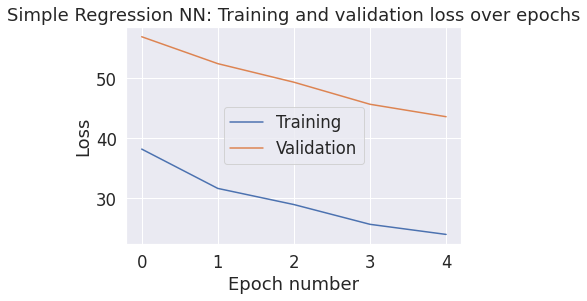

In [ ]:
make_plot(train_losses, val_losses, True, "Simple Regression NN")

The good news is that the validation loss is still going down at 5 epochs, this means that we might not have trained the model for long enough for it to predict in the optimal manner - this can be easily changed in the hyperparameter tuning section.

But before hyperparameter tuning, we want to now look into how we can alter the model architecture itself to learn relationships more effectively for prediction. This is because the architecture will play a much bigger role than hyperparameters and we want to try to optimize that first before tweaking smaller factors that can potentially push its performance forward a little more.


#### **Model 2 - Deeper Neural Network (3 hidden layers)**

To improve our model architecture beyond the simple baseline we tried, we dived into researching online once again.

We found that deeper neural networks are often able to improve performance by allowing models to learn more complex functions, especially in the case where the number of features is quite high (as it is in our case). The strategy of making neural networks deeper has consistently shown greater benefits than focusing on making them wider. Based on this, we decide to add 2 more hidden layers and stick to the same heuristic mentioned above where the number of neurons in any hidden layer is always less than twice the size of the inputs coming into it.

The code below defines a new class with the revamped architecture designed using our rationale.


In [ ]:
# Defining complex model architecture
class FiberNN2(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(58, 100),
      nn.ReLU(),
      nn.Linear(100, 180),
      nn.ReLU(),
      nn.Linear(180, 100),
      nn.ReLU(),
      nn.Linear(100, 1),
    )

  def forward(self, x):
    '''
      Forward pass
    '''
    return self.layers(x)

We chose the same arbitrary hyperparameters as the ones we used for the baseline neural network to be able to have a fair comparison and because we will be focusing on methodically tuning right after this.


In [ ]:
# Train and test this model
fiberNN = FiberNN2().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 5
criterion = nn.MSELoss()

# Calling train_nn function defined before
train_losses, val_losses, _, _ = train_nn(fiberNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "", True)

The training loss for Epoch 0 is: 25.098612532618116
The validation loss for Epoch 0 is: 33.589605460376085
The training loss for Epoch 1 is: 19.721162617587158
The validation loss for Epoch 1 is: 29.422650703782892
The training loss for Epoch 2 is: 18.328362070403063
The validation loss for Epoch 2 is: 25.213448466981657
The training loss for Epoch 3 is: 17.345224577532246
The validation loss for Epoch 3 is: 24.1041703908359
The training loss for Epoch 4 is: 16.56913838259469
The validation loss for Epoch 4 is: 24.755751293158706


We can see here that the validation RMSE loss achieved is much lower with this model compared to the baseline with the same hyperparameters (4.97 compared to 6.6). Next, we are curious to know if it has an improved performance on the test set as well.

We make use of the get_test_performance to evaluate the performance of this new architecture on the test set.


In [ ]:
get_test_performance(fiberNN, criterion, "")

The R2 score is 0.47072694462748366
The test RMSE loss is 8.344806961377612


The performance obtained with the more complex architecture is better than what we got with the simpler architecture as we were hoping. However, we can see that the R^2 score is still lower and the RMSE loss is still higher than what we got with the linear model. Let’s try to visualize the losses over time and see if any overfitting is occurring that could be hindering the model’s prediction. We suspect this might be a problem because increasing the number of layers increased the prediction power but at the same time also increased its complexity and tendency to overfit.

Let’s make use of the make_plot function for this again

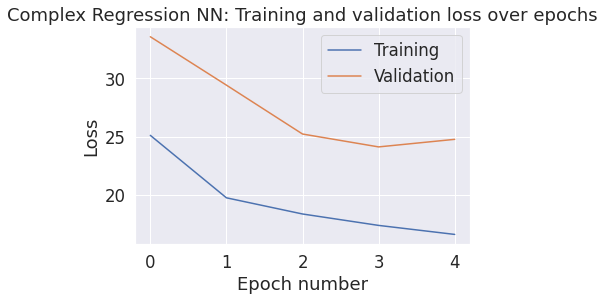

In [ ]:
make_plot(train_losses, val_losses, True, "Complex Regression NN")

We can see that the validation loss has started to climb up slightly at 5 epochs and overfitting may have started to occur. This is something that could potentially be avoided with hyperparameter tuning in the next section, we will be taking this up and experimenting with a variety of different combinations.


#### **Tuning the model**

To make it easier to do hyperparameter tuning again at some point, we now define a function that takes in all the different hyperparameters to be tried as well as the model that they should be tried with. We know there are a lot of other hyperparameters that we could try to tune such as the weight initialization method, the optimizer, the activation function or the criterion. However, given our time constraints, we decide to focus on a select few that we suspect will make a big difference to the performance of our model. 

**Inputs:**
1. model_class → the model class for which we want to do hyperparameter tuning
2. learning_rates  → a list of learning rates that we want to consider in our hyperparameter tuning
3. num_epochs  → a list of number of epochs that we want to consider in our hyperparameter tuning
4. batch_sizes  → a list of batch sizes that we want to consider in our hyperparameter tuning

So ultimately, the function will end up trying len(learning_rates) * len(num_epochs) * len(batch_sizes) different hyperparameter configurations.

**Outputs:**

All output is sent to stdout (not returned from the function)
1. Prints each hyperparameter combination tried along with its final validation loss
2. Prints the best hyperparameter combination found (the combination with the highest validation loss in the last epoch)
3. Displays a plot of its training and validation losses over time
4. Prints the test performance obtained by it


To decide which hyperparameters we want to try, we looked up what some of the commonly considered ones are and also thought about our model’s current behavior.

Learning rate choice → Seeing how our model has started to overfit a little, we don’t want to increase our learning rate too much beyond 1e^-4 and want to stick to just 1e^-4 and 1e^-3. 

Number of epochs → We are curious to see how it will do with more training time so we want to try a longer number of epochs. If we notice overfitting, we can easily reduce the number of epochs to the lowest point we see in the plot.

Batch sizes → We aren’t sure how this will play into our model’s performance so we are just picking some increasing powers of 2 for this. We read that this trick helps the GPU keep operations more efficient (faster) because of how everything is stored in memory ([source](https://datascience.stackexchange.com/questions/20179/what-is-the-advantage-of-keeping-batch-size-a-power-of-2)).

In [ ]:
# These are the different hyperparameters we want to try
model_class = FiberNN2
learning_rates = [1e-3, 1e-4]
num_epochs = [10, 20, 30]
batch_sizes = [32, 64, 128, 256]


# Function created to tune hyperparameters and determine the best set
def search_hyperparameters(model_class, learning_rates, num_epochs, batch_sizes):
    best_combo = [1e-2, 5, 32]
    best_combo_training_losses = []
    best_combo_validation_losses = []
    best_model = None
    min_val_loss = 1e8

    for learning_rate in learning_rates:
        for epochs in num_epochs:
            for batch_size in batch_sizes:
                model = model_class().to(device)
                train_losses, val_losses, _, _ = train_nn(model, criterion, epochs, batch_size, batch_size, learning_rate, "", False)
                print(f"Learning rate: {learning_rate}, Number of epochs: {epochs}, Batch Size: {batch_size}, Final Validation Loss: {val_losses[-1]}")
                if val_losses[-1] < min_val_loss:
                    min_val_loss = val_losses[-1]
                    best_combo = [learning_rate, epochs, batch_size]
                    best_combo_training_losses = train_losses
                    best_combo_validation_losses = val_losses
                    best_model = model

    # Display information about the best combination found 
    print("\nBEST HYPERPARAMETER COMBINATION FOUND")
    print(f"Learning rate: {best_combo[0]}, Number of epochs: {best_combo[1]}, Batch Size: {best_combo[2]}, Final Validation Loss: {min_val_loss}")
    make_plot(best_combo_training_losses, best_combo_validation_losses, True, "Tuned Complex Regression NN")
    get_test_performance(best_model, criterion, "")


Learning rate: 0.001, Number of epochs: 10, Batch Size: 32, Final Validation Loss: 21.675743226139904
Learning rate: 0.001, Number of epochs: 10, Batch Size: 64, Final Validation Loss: 29.534851273850123
Learning rate: 0.001, Number of epochs: 10, Batch Size: 128, Final Validation Loss: 20.05977355707222
Learning rate: 0.001, Number of epochs: 10, Batch Size: 256, Final Validation Loss: 26.478144210420158
Learning rate: 0.001, Number of epochs: 20, Batch Size: 32, Final Validation Loss: 18.81847799654062
Learning rate: 0.001, Number of epochs: 20, Batch Size: 64, Final Validation Loss: 24.55926676205002
Learning rate: 0.001, Number of epochs: 20, Batch Size: 128, Final Validation Loss: 21.712196716759507
Learning rate: 0.001, Number of epochs: 20, Batch Size: 256, Final Validation Loss: 24.512239289911168
Learning rate: 0.001, Number of epochs: 30, Batch Size: 32, Final Validation Loss: 24.388910267815067
Learning rate: 0.001, Number of epochs: 30, Batch Size: 64, Final Validation Loss

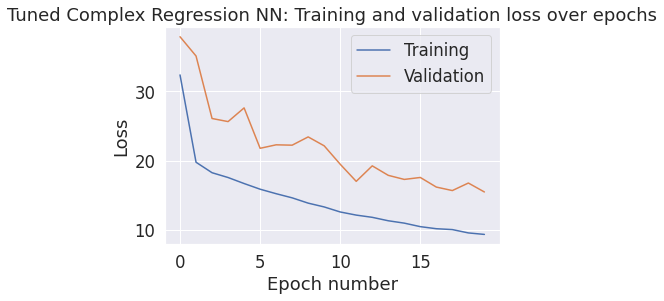

The R2 score is 0.7915526070485026
The test RMSE loss is 5.236904887983563


In [ ]:
search_hyperparameters(model_class, learning_rates, num_epochs, batch_sizes)

We can see that the best combination of hyperparameters helped our model achieve the best R^2 and RMSE score for this problem compared to any other model we have tried so far by a significant amount. The R^2 score is 0.79 which indicates a good fit with the data. The RMSE loss of around 5.24 indicates that the model prediction will deviate from the actual fiber content by around 5.24g. While this is not great considering many foods will have fiber content around 3.7g to begin with and the standard deviation in fiber content is around 8.3g, it is good progress in the right direction and shows promise for improvement.

In the plot, we can see that the validation loss is still decreasing and the model has not stagnated / converged yet. 

In the future, with more time we would try to boost the performance of the current neural network by:
1. Making it deeper by adding more layers (and potentially tackling any overfitting with dropout layers).
2. Training for a longer number of epochs until the model converges.
3. Trying a much wider range of hyperparameters and different hyperparameters that we did not even consider tuning in our current exploration.


## **Predicting CholesterolContent**

In this section, we are exploring whether we can determine the cholesterol content of different recipes based on other features in our dataset. While there are certain obvious correlations that are clear from our knowledge about food (fat being a strong indication of cholesterol), our correlation matrix in our EDA revealed certain not-so obvious correlations especially with protein, carbohydrates and sugar. After doing further [research](https://pubmed.ncbi.nlm.nih.gov/3097105/#:~:text=Different%20dietary%20proteins%20exert%20different,vegetable%20proteins%2C%20such%20as%20soy.), we found that the relation between protein and cholesterol can be attributed to animal meats which seem to be a major contributor in increasing blood cholesterol levels (in comparison to plant-based protein). On the other hand, while there are some [studies](https://www.nkch.org/blog/take-the-drivers-seat-reduce-your-cholesterol#:~:text=In%20addition%20to%20the%20fats,time%20to%20make%20more%20cholesterol.) about processed carbohydrates potentially leading to the liver increasing production of cholesterol, the direct food related correlation is not very clearly defined. All these correlations that we found were not as strong as we had anticipated and we wanted to see if there was a more robust way to  predict overall cholesterol based on different numeric as well as text-based information we have access to by training various models.

We evaluate our model based on two metrics - coefficient of determination (R^2) and the root mean squared error (RMSE). The R^2 value helps evaluate how good the fit of the model is and how well the variance of the label (cholesterol) is explained by our model. The RMSE value is helpful to have a more interpretable value to understand how well our model is performing. It helps determine by how much on average our model is incorrectly predicting (by showing the deviation in the units of the label itself).


We start by selecting the specific numeric features we believe may be relevant to determining cholesterol content and create the training (80%) and test (20%) datasets for our model.


In [ ]:
# Selecting specific columns and projecting them into a new df
columns_for_rating_linear = ['CookTime', 'PrepTime', 'NumberOfIngredientParts', 'Calories', 'FatContent', 'SaturatedFatContent', 'FiberContent', 
                               'CarbohydrateContent', 'SodiumContent', 'SugarContent', 'ProteinContent', 'SentimentRating', 'MeanRating', 'CholesterolContent']


recipes_model_df = recipes_df[columns_for_rating_linear]

# Creating feature set and y value set
features = recipes_model_df.drop(columns=['CholesterolContent'])
cholesterol = recipes_model_df['CholesterolContent']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, cholesterol, random_state = 42, test_size = 0.2)

We scale our features here using a standard scaler as this is an important step for regularized linear regression and neural networks.

In [ ]:
# Scaling using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

### **Rule-Based Baseline Model**

We first begin by implementing a rule-based baseline model to establish a benchmark. In this case, the rule is the mean of the labels. This means the model will predict the mean (irrespective of the feature set) as the prediction. This is an interesting baseline to consider as we will be able to see by how much (milligrams of cholesterol) we would be off if we just predict the mean for every single recipe.

In [ ]:
# Fitting and evaluating the model
regression = DummyRegressor(strategy="mean")
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for mean rule based baseline model: ' + str(round(score, 6)))
print('Root mean squared error (RMSE) for mean rule based baseline model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 6)))

Coefficient of determination (R^2) for mean rule based baseline model: -3.2e-05
Root mean squared error (RMSE) for mean rule based baseline model: 160.993954


As we can see the R^2 value is very near zero, which once again makes sense as we are only predicting the mean for the whole dataset and not ‘fitting’ to the data.

The RMSE is 160, which means on average the prediction is off by 160mg of cholesterol. This is quite high given that on average cholesterol levels of a recipe in our dataset is around 85mg. Now let’s try to do better.


### **Linear Regression for Predicting CholesterolContent**

#### **Baseline Linear Regression**

We begin by pursuing a naive linear regression with just the numerical features. There is no hyperparameter tuning or regularization performed here. This model will help us determine if cholesterol can be modeled using certain linear relations between it and the features. We expect this to perform better than the rule-based model as there are indeed relevant features in our dataset that are good predictors of cholesterol.


In [ ]:
# Fitting and evaluating the model
regression = LinearRegression()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for linear regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression model: 0.625
Root mean squared error (RMSE) for linear regression model: 98.557


As expected, we see an improved performance of this model in comparison to the rule-based model. The coefficient of determination is 0.625, which is still not great, but it is significant as it shows that 62.5% of the variance of cholesterol can be explained using our numerical features.  Additionally, the RMSE also dropped significantly to 98.6. 

However, there is still room for improvement in our model. This is because at the moment we have all relevant numerical columns present as features. However, we know there are certain strong correlations amongst our features which could be hampering performance. But before we consider that, let's see if we can add more relevant features.


#### **Linear Regression with Additional Text-Based Features**

In this section, we add the relevant text-based feature vectors that we calculated to see if linear regression with the addition of these additional features can lead to an improvement in our models performance. This is specifically important as we want this model to help people determine their food’s cholesterol levels based on the instructions and ingredients they end up using.

Once again we start by selecting the relevant columns and creating the scaled training (80%) and test (20%) datasets. 


In [ ]:
# Selecting specific columns and projecting them into a new df
columns_for_rating_linear = [ 'CookTime', 'PrepTime', 'NumberOfIngredientParts', 'Calories', 'FatContent', 'SaturatedFatContent', 'FiberContent', 
                               'CarbohydrateContent', 'SodiumContent', 'SugarContent', 'ProteinContent', 'SentimentRating', 'MeanRating','IngVec0', 'IngVec1',
                             'IngVec2', 'IngVec3', 'IngVec4', 'IngVec5', 'IngVec6', 'IngVec7', 'IngVec8', 'IngVec9',
                             'DescVec0', 'DescVec1','DescVec2', 'DescVec3', 'DescVec4', 'DescVec5', 'DescVec6', 'DescVec7', 
                             'DescVec8', 'DescVec9', 'CatVec0', 'CatVec1','CatVec2', 'CatVec3', 'CatVec4', 'CatVec5', 'CatVec6', 'CatVec7', 'CatVec8', 'CatVec9', 
                             'KeyVec0', 'KeyVec1','KeyVec2', 'KeyVec3', 'KeyVec4', 'InsVec0', 'InsVec1','InsVec2', 'InsVec3', 'InsVec4', 'InsVec5', 
                             'InsVec6', 'InsVec7', 'InsVec8', 'InsVec9', 'CholesterolContent']

recipes_model_df = recipes_df[columns_for_rating_linear]

# Creating feature set and y value set
features = recipes_model_df.drop(columns=['CholesterolContent'])
cholesterol = recipes_model_df['CholesterolContent']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, cholesterol, random_state = 42, test_size = 0.2)

In [ ]:
# Scaling using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
# Fitting and evaluating the model
regression = LinearRegression()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for linear regression model (with additional features): ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression model (with additional features): ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression model (with additional features): 0.639
Root mean squared error (RMSE) for linear regression model (with additional features): 96.691


Interestingly, we don’t see a drastic improvement in our models performance after adding these additional features. However, nonetheless, there is a minor improvement in our model’s R^2 value which is now 0.639 (about a 2.2% increase from before), which means that 63.9% of the variance of cholesterol can be explained using all of our features. Our RMSE also decreased by 1.9% to 96.7. This is still quite high given that the mean cholesterol in our recipes dataset is 85mg, however, given the large standard deviation of over 300mg, this error is not unreasonable. 

We still can try to optimize this model even further, which we proceed to do in the next sections by trying to optimize the model by performing PCA and regularizing using L1, L2 and ElasticNet regularization.


#### **Linear Regression with PCA**

In this section we address the fact that there is multicollinearity within our feature set (features might be dependent on each other and thus redundant). This could negatively impact the model. So we use PCA to reduce the dimensionality of our dataset while retaining most of the predicting power of our data.

We begin by calculating the cumulative variance ratios over all the principal components created and plotting it. We aim to use the number of components that can retain 95% of the variance in our features. We plot the results on the graph below.


In [ ]:
# PCA done to calculate cumulative variance which can then be plotted to find the 
# best number of PCs
pca = PCA()
pca.fit(x_train)
explained_variance_ratios = pca.explained_variance_ratio_
cum_evr = []
sum = 0
for r in explained_variance_ratios:
  sum += r
  cum_evr.append(sum)
cum_evr = np.array(cum_evr)

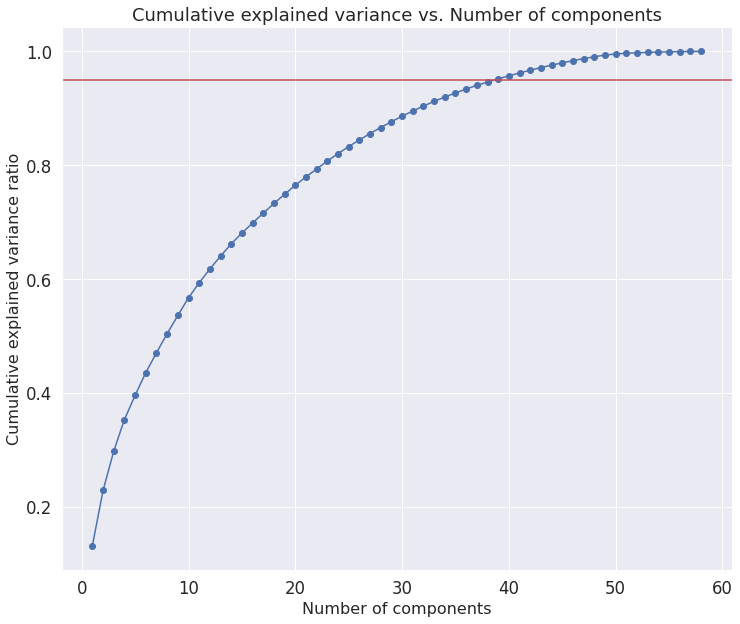

In [ ]:
# Plotting Cumulative explained variance vs. Number of components
number = range(1, len(explained_variance_ratios)+1)
plt.figure(figsize=(12, 10))
plt.scatter(number, cum_evr)
plt.plot(number, cum_evr)
plt.axhline(y = 0.95, color = 'r', linestyle = '-')
plt.xlabel("Number of components", fontsize=16)
plt.ylabel("Cumulative explained variance ratio", fontsize=16)
plt.title("Cumulative explained variance vs. Number of components", fontsize=18)
plt.show()

It can be seen from the graph, that for 95% of explained variance, we only need 39 principal components. This reduces our original feature set from 58 features down to 39 PCs only. Using this information, now we run PCA on our features and see if our linear regression model improves.

In [ ]:
# Determine number of PCA components to explain 95% variance
num_comp = 0
while cum_evr[num_comp] < 0.95:
  num_comp += 1
num_comp += 1

# Using PCA to reduce dimensionality
pca = PCA(n_components= num_comp)
pca.fit(x_train)
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

# Running Linear Regression with PCA transformed data
regression = LinearRegression()
regression = regression.fit(x_train_pca, y_train)
prediction = regression.predict(x_test_pca)
score = regression.score(x_test_pca, y_test)

# Printing results
print('Coefficient of determination (R^2) for linear regression with PCA: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for linear regression with PCA: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for linear regression with PCA: 0.62
Root mean squared error (RMSE) for linear regression with PCA: 99.2


It can be seen from the results that linear regression with PCA performs slightly worse than the linear regression with all the features maintained. The R^2 value is 0.62 and the RMSE is 99.2. This is still quite interesting as we were able to retain most of the predicting power with a reduced feature set. The lower R^2 and higher RMSE can be potentially explained by the following:
1. The 39 components are retaining only 95% of the variance, so some of the useful information is lost.
2. The multicollinearity within our feature set that was removed using PCA may not be very detrimental in the context of this regression problem.


#### **Linear Regression with L1 Regularization (Lasso)**

Using L1 regularization is another technique that can be used to prevent overfitting. L1 regularization (Lasso) sets the coefficient of less important features to 0, thereby not using them at all, encouraging sparsity and reducing additional noise in our model. In this section we explore the effect of adding a L1 penalty on the performance of our original linear regression model and start with no tuning of the regularization coefficient. 

In [ ]:
# Fitting and evaluating the model
regression = Lasso()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for Lasso regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for Lasso regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for Lasso regression model: 0.633
Root mean squared error (RMSE) for Lasso regression model: 97.557


We can see here that the performance of the lasso model without any tuning is better than linear regression with PCA, but performs slightly worse than without any regularization. The test R^2 score (0.633) is only 0.006 less than that of the linear regression without regularization, and the RMSE is only 0.866 greater. We may still be able to improve this further by tuning the hyperparameters. Let’s investigate this next.

The code below trains models with 100 different alpha values each between 0.1 and 10. 

The alpha value that is the best one is determined through cross validation with 10 folds. Through this method, each model (using a different alpha value) is trained on 10 different subsets of the data (training set) and tested on the remaining data each time (validation set). The best alpha value is the one that led to the model with the highest cross validation score (the average score across all the folds). 

After getting the model using this optimal alpha value, we test its performance on the test set. 



In [ ]:
# Creating array of alphas
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating the model
regression = LassoCV(cv=10, alphas=alphas, max_iter = 3700)
regression= regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized Lasso regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized Lasso regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized Lasso regression model: 0.633
Root mean squared error (RMSE) for optimized Lasso regression model: 97.557


After tuning the lasso regression model, we obtained the exact same performance as that without hyperparameter tuning. 

In general, the results are worse than what we could achieve with no regularization in the first place. The R^2 score and RMSE are both slightly worse. This means that using L1 regularization was not useful for our model. It could be because most of the features may be necessary for a good prediction in the case of fiber content prediction and so the model was unable to make much of a difference by encouraging sparsity.

Next, we will try L2 regularization to see if it can help improve our model performance through reduction of overfitting.


#### **Linear Regression with L2 Regularization (Ridge)**

Linear regression with L2 regularization or Ridge regression can reduce overfitting by reducing weights corresponding to less useful features to values near 0 instead of exactly zero (as in the case with lasso regression). 

Just as we did with lasso regression, here we first want to see how a simple untuned ridge regression model performs on our dataset.

In [ ]:
# Fitting and evaluating the model
regression = Ridge()
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for Ridge regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for Ridge regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for Ridge regression model: 0.639
Root mean squared error (RMSE) for Ridge regression model: 96.693


 Here, the results are the same as what we achieved with the un-regularized linear regression model using this dataset. The R^2 score is exactly the same as that of the un-regularized model and the RMSE is very nominally higher (by 0.002). To see if this model would benefit from tuning, we will try that next.

We use the same cross validation method as the one used in the Lasso regression section to find the optimal regularization coefficient value. 

In [ ]:
# Creating array of alphas
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating the model
regression = RidgeCV(cv=10, alphas = alphas)
regression= regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized Ridge regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized Ridge regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized Ridge regression model: 0.639
Root mean squared error (RMSE) for optimized Ridge regression model: 96.693


Even with tuning, the performance of the ridge regression model was not improved. We got the same performance as the un-tuned Ridge regression. We believe this overall result could again be because most of the features may have been necessary to make a good prediction so increasing the regularization parameter beyond 0 would only make the performance worse than that of the simple linear regression model.

Finally, we want to investigate whether some combination of L1 and L2 regularization can lead to a better performance by helping the model converge to a lower minimum. We do this by using an ElasticNet regression model.


#### **Linear Regression with Both L1 and L2 Regularization (ElasticNet)**

The ElasticNet regularization method uses a linear combination of L1 and L2 regularization to reduce overfitting. We first train and test the model without any tuning to find optimal hyperparameters. 


In [ ]:
# Fitting and evaluating the model
regression = ElasticNet(random_state=0)
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for ElasticNet regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for ElasticNet regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for ElasticNet regression model: 0.58
Root mean squared error (RMSE) for ElasticNet regression model: 104.387


The performance of the model is quite poor with an R^2 of 0.58 and an RMSE of 104.387. Next, we will try to tune the hyperparameters of this model to see if it is possible to make it more effective.

In the code below, we try 9 different proportions of the L1 penalty to be used in the ElasticNet model. We make use of cross validation as in the previous parts to find the best L1 ratio as well as the best regularization coefficient (alpha) value.


In [ ]:
# Creating array of alphas
alphas = np.linspace(0.01, 1, 100)

# Fitting and evaluating the model
regression = ElasticNetCV(random_state=0, cv=10, alphas=alphas, l1_ratio=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9], max_iter=2500)
regression = regression.fit(x_train, y_train)
prediction = regression.predict(x_test)
score = regression.score(x_test, y_test)

print('Coefficient of determination (R^2) for optimized ElasticNet regression model: ' + str(round(score, 3)))
print('Root mean squared error (RMSE) for optimized ElasticNet regression model: ' + str(round(mean_squared_error(y_test, prediction, squared=False), 3)))

Coefficient of determination (R^2) for optimized ElasticNet regression model: 0.619
Root mean squared error (RMSE) for optimized ElasticNet regression model: 99.387


We can see here that the performance of the tuned ElasticNet is worse than that of both the lasso and ridge regression models individually. The R^2 is 0.619 and the RMSE is 99.387. The reason for this could be that the combined regularization is too restrictive and leads to high bias in the model.


**So in the end, did we find regularization to be helpful for improving the prediction of fiber using linear regression?**

No. From the results, it seems to be the case that overfitting may not have been a problem for the original simple linear regression model in the first place. In fact, the poor performance may have been due to underfitting since the linear regression model is unable to capture and leverage any non-linear relationships that may exist between the features and fiber content for effective prediction.

In fact, these results are quite similar to our efforts to model fiber. The difference however was that PCA did not drastically reduce the coefficient of determination. In this case we can potentially use the results of our PCA to reduce our computation time while still preserving performance to a large extent. Motivated by these results, in the following section we will investigate the effectiveness of neural network models in predicting the cholesterol content of recipes. Neural network models are able to learn complex non-linear relationships between inputs and labels, which is why they might be a good fit for this regression task.


### **Neural Network for Predicting Cholesterol content**

Given the strong indication of underfitting in the previous section that is very similar to what we found while predicting fiber content, we want to explore the effectiveness of a neural network model for this highly similar regression problem as well. We will be able to reuse the functions we defined there to make our work easier this time.

First, we start by creating a PyTorch dataset from the PCA component features using the NNDataset class we made earlier.


In [ ]:
# Split into training and validation
x_train_pca, x_val, y_train, y_val = train_test_split(x_train_pca, y_train, test_size=0.2, random_state=42)

# Load datasets
train_dataset = NNDataset(x_train_pca, y_train.to_numpy())
validation_dataset = NNDataset(x_val, y_val.to_numpy())
test_dataset = NNDataset(x_test_pca, y_test.to_numpy())

#### **Model 1 - simple neural network with 1 hidden layer**

Now we can define the model architecture. We start with a simple baseline that only has 1 hidden layer and for it we use the same strategy as the one we employed for our fiber content predicting neural network where the number of neurons in the hidden layer is less than twice the number of inputs fed into it.


In [ ]:
# Defining model architecture
class CholesterolNN1(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp, 75),
      nn.ReLU(),
      nn.Linear(75, 1)
    )

  def forward(self, x):
    '''
      Forward pass
    '''
    return self.layers(x)

To train this simple baseline neural network, we again make use of the same arbitrary hyperparameters (as tuning will come later) and the same loss function (mean squared error, as it is commonly used for regression and we want to be able to do a fair comparison with other models). 

In [ ]:
# Train and test this model
cholesterolNN = CholesterolNN1().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 5
criterion = nn.MSELoss()

# Calling train_nn and evaluating the model on the test dataset
train_losses, val_losses, _, _ = train_nn(cholesterolNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "", True)
get_test_performance(cholesterolNN, criterion, "")

The training loss for Epoch 0 is: 137353.78585653886
The validation loss for Epoch 0 is: 28938.43437348166
The training loss for Epoch 1 is: 130057.01986365588
The validation loss for Epoch 1 is: 24551.778167573782
The training loss for Epoch 2 is: 125375.90532734456
The validation loss for Epoch 2 is: 22692.054697806594
The training loss for Epoch 3 is: 123201.47193871292
The validation loss for Epoch 3 is: 22206.858039064107
The training loss for Epoch 4 is: 121667.27578064657
The validation loss for Epoch 4 is: 21757.349528229413
The R2 score is 0.2183159518203739
The test RMSE loss is 142.33713280447938


The results show that our current model is much less effective than the linear regression model using the same PCA inputs. The final validation loss after the training has finished is around 147 (square root of 21757) and the test RMSE is very similar to this at 142.3. Compared to this, the linear regression model with PCA had a much lower RMSE of 99.2. Its R^2 score was also significantly higher at 0.62 compared to our current model’s 0.22.

Next, we plot the training and validation loss.

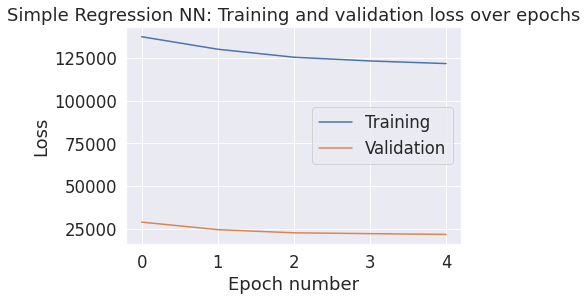

In [ ]:
make_plot(train_losses, val_losses, True, "Simple Regression NN")

The plot indicates that the validation barely dropped over the course of the epochs and the model might be too slow in converging. The training loss also fell by a very small amount over the course of epochs and is in fact higher than the validation loss throughout. Both of these  facts hint that underfitting is the culprit here.

To attempt to make this model a better predictor, we will next redesign its architecture just as we did for fiber prediction. Making the neural network deeper will help us tackle underfitting by allowing our model to learn more complex functions.


#### **Model 2 - Deeper Neural Network (3 hidden layers)**

Given the underfitting of our baseline model as well as what we found in our fiber prediction models and online about the effectiveness of deep neural networks for increasing performance, we will be updating the baseline neural network in the previous section by adding hidden layers to it (making the total 3 hidden layers).

We also set the number of neurons in each hidden layer to be less than twice the number of input neurons based on the same heuristic we have been using so far.


In [ ]:
# Defining model architecture
class CholesterolNN2(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp, 75),
      nn.ReLU(),
      nn.Linear(75, 140),
      nn.ReLU(),
      nn.Linear(140, 75),
      nn.ReLU(),
      nn.Linear(75, 1),
    )

  def forward(self, x):
    '''
      Forward pass
    '''
    return self.layers(x)

We use the same arbitrary hyperparameters for now to train the model and understand its performance preliminarily.

In [ ]:
# Train and test this model
cholesterolNN = CholesterolNN2().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 5
criterion = nn.MSELoss()

train_losses, val_losses, _, _ = train_nn(cholesterolNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "", True)

The training loss for Epoch 0 is: 117540.99173840445
The validation loss for Epoch 0 is: 19756.387058012962
The training loss for Epoch 1 is: 80540.50203062268
The validation loss for Epoch 1 is: 15865.849885415795
The training loss for Epoch 2 is: 64316.259096117734
The validation loss for Epoch 2 is: 13416.082438486215
The training loss for Epoch 3 is: 52656.97358606969
The validation loss for Epoch 3 is: 12404.426607826395
The training loss for Epoch 4 is: 53564.54517177656
The validation loss for Epoch 4 is: 11403.79252415866


The final validation loss after all the epochs have finished is 105.78 (sqrt(11403)). This is much better than the loss of the baseline neural network. However, let’s try to see if the model can match this improvement with the test set as well.

In [ ]:
get_test_performance(cholesterolNN, criterion, "")

The R2 score is 0.6402432490859502
The test RMSE loss is 96.56217637486222


Both the test RMSE loss (96.56) and R^2 score (0.64) for the current model are slightly better than those of the baseline as well as the linear model using PCA (whose RMSE is 99.2 and R^2 is 0.62). This is a great sign but we believe we can push the results to be even better. To diagnose the problem that might be holding back the performance, we can next try to plot the training and test losses for this model over each epoch.

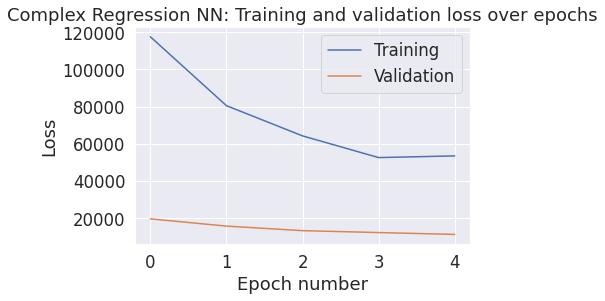

In [ ]:
make_plot(train_losses, val_losses, True, "Complex Regression NN")

Here we can see that even though the training loss has started to decrease more normally over each epoch with this more complex model, the validation loss is not decreasing as much as we would expect it to. We believe that with hyperparameter tuning, we may be able to tackle this problem of sub-optimal convergence so that will be our next step for this exploration.


### Tuning the model

For tuning this model, we make use of the same function we defined in the fiber prediction section (search_hyperparameters). We also use the same hyperparameter combinations for experimentation.


Learning rate: 0.001, Number of epochs: 10, Batch Size: 32, Final Validation Loss: 11465.279891389599
Learning rate: 0.001, Number of epochs: 10, Batch Size: 64, Final Validation Loss: 11117.544394579516
Learning rate: 0.001, Number of epochs: 10, Batch Size: 128, Final Validation Loss: 8426.818401003591
Learning rate: 0.001, Number of epochs: 10, Batch Size: 256, Final Validation Loss: 8371.358094064813
Learning rate: 0.001, Number of epochs: 20, Batch Size: 32, Final Validation Loss: 7871.266451513551
Learning rate: 0.001, Number of epochs: 20, Batch Size: 64, Final Validation Loss: 22820.721159832876
Learning rate: 0.001, Number of epochs: 20, Batch Size: 128, Final Validation Loss: 10387.722591092206
Learning rate: 0.001, Number of epochs: 20, Batch Size: 256, Final Validation Loss: 8538.790530556127
Learning rate: 0.001, Number of epochs: 30, Batch Size: 32, Final Validation Loss: 20859.948723128444
Learning rate: 0.001, Number of epochs: 30, Batch Size: 64, Final Validation Loss:

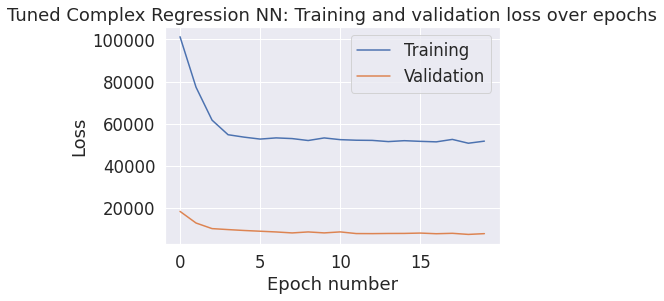

The R2 score is 0.7148814061155815
The test RMSE loss is 85.96374599213321


In [ ]:
# These are the different hyperparameters we want to try
model_class = CholesterolNN2
learning_rates = [1e-3, 1e-4]
num_epochs = [10, 20, 30]
batch_sizes = [32, 64, 128, 256]

# Calling the function defined earlier to find the optimal hyperparameters of the NN
search_hyperparameters(model_class, learning_rates, num_epochs, batch_sizes)

The the R^2 score and the test RMSE score achieved (0.71 and 85.96 respectively) by the most optimal hyperparameter combination (1e-4 learning rate, 20 epochs and 32 batch size) is a significant improvement on the linear regression model using PCA components (14% increase in R^2 and 13% in RMSE). This means that the model and data fit is quite good and on average, the deviation between the predicted and actual cholesterol values is around 85.96g.

In the plot we can see that the training as well as validation loss decreased much more and appears to have converged better after tuning. 

Even though the performance of this neural network is better than that of the linear model, since the mean and standard deviation for cholesterol are 85mg and 308mg respectively, the error of our model is still quite high. Think about it like this - a scenario where it would predict 0g for a meal that has 85g of cholesterol might not be uncommon. Comparing this to the fiber content neural network though, we can see that the predictions of this model might end up being more useful given the much wider spread of values that the cholesterol content has.

We believe neural networks demonstrate high potential for being able to predict cholesterol content more effectively and we would follow steps similar to the ones detailed in the fiber content section to improve this neural network further if we had access to more compute resources as well as time.


# **Classification Models**

## **Binary Classification of Quick Vs Time-Consuming Recipes**

As students ourselves, we often need to plan our meals in advance and keep track of our time. Given the amount of school work and other responsibilities we have, it would be helpful for us to be able to determine whether a recipe will be a quick cook (within 30 minutes) or if it will take longer so we can plan accordingly. We aim to tackle this problem by attempting to model the classification problem of whether a recipe is going to take greater than 30 minutes or not, i.e. a binary classification.

To evaluate the performance of this binary classification problem, we use accuracy as the metric. Accuracy is calculated as the number of correct / total.


### **Creation of Label and Modelling Datasets**

We first begin by creating the column for the labels called `GreaterThan30Min`. This buckets the `TotalTime` based on the number of minutes accordingly.

In [ ]:
# Function which is used to bucket the TotalTime and create the new label
def bucket_time(x):
    if x <= 30:
        return 0
    else:
        return 1

# Creating new label column in dataframe
recipes_df['GreaterThan30Min'] = recipes_df['TotalTime'].apply(lambda x: bucket_time(x))

Next we select the relevant numerical features for this classification problem. We remove both `CookTime` and `PrepTime` as those work trivially solve this problem. We want to use other features to determine the time.

We create the scaled training (80%) and test (20%) datasets based on our selected features and the created label.


In [ ]:
# Selecting and projecting chosen columns into a new df
columns = ['RecipeInstructionsCharCount', 'NumberOfIngredientParts', 'Has_Image',
                               'TotalReviewCounts', 'Calories', 'FatContent', 'SaturatedFatContent', 'SodiumContent',
                               'CholesterolContent','CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent', 
                               'RecipeServings', 'RecipeServings_Na', 'MeanRating', 'SentimentRating', 'GreaterThan30Min']

recipes_model_df = recipes_df[columns]

# Creating feature set and label set
features = recipes_model_df.drop(columns=['GreaterThan30Min'])
time = recipes_model_df['GreaterThan30Min']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, time, random_state = 42, test_size = 0.2)

In [ ]:
# Scalinf data using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

### **Rule-Based Baseline Model**

We first begin by implementing a rule-based baseline model to establish a benchmark. In this case, the rule is the most frequent label. This means the model will predict the label of the majority class irrespective of any features. This is an interesting baseline to consider as we will be able not only see what percent of the data is in a specific class, but also establish a baseline against which our model should definitely do better.


In [ ]:
# Fitting and evaluating the model
classifier = DummyClassifier(strategy='most_frequent', random_state=42)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for "most_frequent" rule-based baseline model: ' + str(round(score, 3)))

Accuracy for "most_frequent" rule-based baseline model: 0.589


It can be seen that the accuracy of the rule-based model is 58.9%. This means that 58.9% of our data is one of the two classes (this relatively evenly split). Now let’s see if we can improve on this rule-based baseline.


### **Baseline Logistic Regression**

We begin by performing logistic regression without any hyperparameter tuning with just the numerical features. The results from this naive logistic regression will allow us to understand if the data is linearly separable to a certain degree and thereby be accurately classified using logistic regression. `max_iter` is set so that the model converges.



In [ ]:
# Fitting and evaluating the model
classifier = LogisticRegression(max_iter = 1000)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for logistic regression baseline model: ' + str(round(score, 3)))

Accuracy for logistic regression baseline model: 0.694


The accuracy achieved by our naive logistic regression with just numerical features is significantly higher than the rule-based model. We have an accuracy of 69.4%. While this is still suboptimal for our classification problem at hand, it shows substantial improvement. Next, lets see if we can use additional text-based features to improve the model further.


### **Logistic Regression with Relevant Text-Based Features**

Now, we add relevant text-based feature vectors to our model. Specifically, we add vectors for ingredients, categories and keywords. We do not add instruction vectors as they may contain timing information which could make the problem trivial.

Similar to before, we create scaled training and test datasets after selecting the specific features we want for our model. 

In [ ]:
# Selecting and projecting chosen columns into a new df
columns = ['RecipeInstructionsCharCount', 'NumberOfIngredientParts', 'Has_Image',
                               'TotalReviewCounts', 'Calories', 'FatContent', 'SaturatedFatContent', 'SodiumContent',
                               'CholesterolContent','CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent', 
                               'RecipeServings', 'RecipeServings_Na', 'MeanRating', 'SentimentRating', 'IngVec0', 'IngVec1',
                             'IngVec2', 'IngVec3', 'IngVec4', 'IngVec5', 'IngVec6', 'IngVec7', 'IngVec8', 'IngVec9',
                              'CatVec0', 'CatVec1','CatVec2', 'CatVec3', 'CatVec4', 'CatVec5', 'CatVec6', 'CatVec7', 'CatVec8', 'CatVec9', 
                             'KeyVec0', 'KeyVec1','KeyVec2', 'KeyVec3', 'KeyVec4', 'GreaterThan30Min']

recipes_model_df = recipes_df[columns]

# Creating feature set and label set
features = recipes_model_df.drop(columns=['GreaterThan30Min'])
time = recipes_model_df['GreaterThan30Min']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, time, random_state = 42, test_size = 0.2)

# Scaling using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
# Fitting and evaluating the model
classifier = LogisticRegression(max_iter = 1000)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for logistic regression model with additional features: ' + str(round(score, 3)))

Accuracy for logistic regression model with additional features: 0.771


Interestingly, we see a significant boost in the accuracy score with the addition of these text-based features. The accuracy we received is 77.1% (7.7 percentage points higher than before). This confirms that the relevant text-based features do indeed play an important role in the classification of recipes based on their time.


### **PCA to reduce dimensionality**

In this section we implement PCA to reduce the dimensionality of the data. Currently we have 42 features that we are using to classify each recipe. However, we are cognisant of the fact that down the line we will need to tune hyperparameters for each individual type of model we implement. Therefore, it may be useful to reduce the dimensions of our features while maintaining most of the variance to reduce the amount of computation that needs to go into hyperparameter tuning and training. This should help speed up our modeling efforts.

Therefore we implement PCA below and calculate the cumulative explained variance to determine the number of principal components that will account for 95% of the variance in our data. The plot of explained cumulative variance over the number of PCs can be seen below.


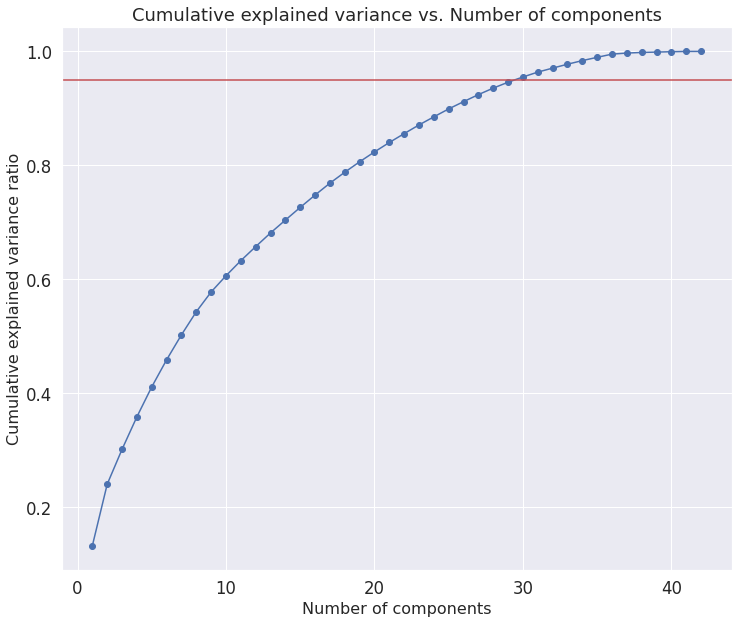

In [ ]:
# Applying PCA to training data and calculating cumulative explained variance
pca = PCA()
pca.fit(x_train)

explained_variance_ratios = pca.explained_variance_ratio_
cum_evr = []
sum = 0
for r in explained_variance_ratios:
  sum += r
  cum_evr.append(sum)
cum_evr = np.array(cum_evr)

#Plotting cumulative explained variance to determine optimal number of PCs
number = range(1, len(explained_variance_ratios)+1)
plt.figure(figsize=(12, 10))
plt.scatter(number, cum_evr)
plt.plot(number, cum_evr)
plt.axhline(y = 0.95, color = 'r', linestyle = '-')
plt.xlabel("Number of components", fontsize=16)
plt.ylabel("Cumulative explained variance ratio", fontsize=16)
plt.title("Cumulative explained variance vs. Number of components", fontsize=18)
plt.show()

Based on the graph, it is clear that we need 30 principal components to retain 95% of the explained variance in our data. Next, we run logistic regression on the PCA transformed training and test data to see the results and differences compared to the original data.


In [ ]:
# Determine number of PCA components to explain 95% variance
num_comp = 0
while cum_evr[num_comp] < 0.95:
  num_comp += 1
num_comp += 1

# Using PCA to reduce dimensionality
pca = PCA(n_components= num_comp)
pca.fit(x_train)
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

# Running Linear Regression with PCA transformed data
classifier = LogisticRegression(max_iter = 1000)
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for logistic regression with PCA: ' + str(round(score, 3)))

Accuracy for logistic regression with PCA: 0.768


It can be seen that the Accuracy is now 76.8%, which is only a 0.4% drop from the results of logistic regression with all features. However, this drop in accuracy comes with a reduction of the number of features from 42 to 30. This is quite significant and could reduce the amount of computation required further down due to hyperparameter tuning. Additional 76.8% accuracy is quite significant. Given 100 recipes, it will only incorrectly classify about 23 recipes. Therefore, we decide to perform all further computations with the PCA transformed training and test datasets.


### **Logistic Regression with Hyperparameter tuning**

Now, we try to tune the hyperparameters for logistic regression to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we use `GridSearchCV`, a class within scikit learn. This particular class takes in a dictionary of hyperparameters and their ranges we want to check, the model we want to test on and the number of folds for cross validation. Then it tries all possible combinations of the hyperparameters and determines the best combination. We vary the `solver` and the regularization strength `C` to find the best combination. The range of `C` values we chose is 0.1, 1 and 10. We try the solvers `lbfgs` and `liblinear` as these make the most sense according to documentation on scikit learn. Given more time and compute, we would look into a larger range of hyperparameters.


In [ ]:
# Model to use
log = LogisticRegression(max_iter = 2000)

# Defining grid of paramters to optimize for and their values
grid = {'solver': ['lbfgs', 'liblinear'], 'penalty': ['l2'], 'C': [10, 1.0, 0.1]}
log_reg_GSCV = GridSearchCV(log, grid, cv=5, scoring='accuracy')

# Fitting and determining best hyperparameters
log_reg_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(log_reg_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(log_reg_GSCV.best_score_))


Best hyperparameter value (cross val with accuracy): {'C': 0.1, 'penalty': 'l2', 'solver': 'liblinear'}
Best score (cross val with accuracy): 0.7685733781365468


In [ ]:
# Fitting and evaluating model with chosen hyperparameters
classifier = LogisticRegression(solver = log_reg_GSCV.best_params_['solver'], C = log_reg_GSCV.best_params_['C'], penalty='l2')
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for optimized logistic regression: ' + str(round(score, 3)))

Accuracy for optimized logistic regression: 0.768


Interestingly, post hyperparameter tuning the accuracy remains unchanged. This means that the default logistics regression hyperparameters used by scikit learn (which is solver: `lbfgs` and `C`: 1) perform similarly to the tuned hyperparameters chosen (which is solver: `liblinear` and `C`: 0.1)

So, the best accuracy we receive from logistic regression (after dimensionality reduction) is 76.8%. This is good, but let's see if we can do better. Now let's try to explore certain types of models that don’t rely on the data being linearly separable.


### **Naive Decision Tree**

We begin by exploring whether we can get a better accuracy by using Decision Trees as the classification model. Our rationale is that the data may not be completely linearly separable. In this case, a decision tree may perform better than the logistic regression. To test this, we implement a decision tree with all the default hyperparameters and see how it fares in comparison to our logistic regression.

In [ ]:
# Fitting and evaluating model
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for naive Decision Tree classification model: ' + str(round(score, 3)))

Accuracy for naive Decision Tree classification model: 0.713


It can be seen that our naive decision tree has an accuracy of 71.3%, which is also quite significant. However, this is 5.5 percentage points lower than the hyperparameter tuned logistic regression. For a fair comparison, let's tune the hyperparameters for the decision tree as well.


### **Decision Tree with Hyperparameter Tuning**

Similar to logistic regression, we try to tune the hyperparameters for the decision tree to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we once again use `GridSearchCV`. We vary the `max_depth` parameter (`None`, 3, 5, 10) to find the most optimal value. Max_depth is one of the most important parameters to tune as it prevents overfitting, which is a common problem faced when implementing decision trees. Given more time and compute, we would look into a larger range of hyperparameters to tune.


In [ ]:
# Model to use
classifier = DecisionTreeClassifier(random_state=0)

# Defining grid of paramters to optimize for and their values
grid = {'max_depth': [None, 3, 5, 8, 10]}
dt_GSCV = GridSearchCV(classifier, grid, cv=5, scoring='accuracy')

# Fitting and determining best hyperparameters
dt_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(dt_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(dt_GSCV.best_score_))

Best hyperparameter value (cross val with accuracy): {'max_depth': 10}
Best score (cross val with accuracy): 0.7611731232217116


In [ ]:
# Fitting and evaluating model with chosen hyperparameters
classifier = DecisionTreeClassifier(random_state=0, max_depth= dt_GSCV.best_params_['max_depth'])
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for optimized Decision Tree classification model: ' + str(round(score, 3)))

Accuracy for optimized Decision Tree classification model: 0.764


It can be seen that the optimal `max_depth` found by the gridsearch is 10, which is different from the default value of `None`. With this value, the test accuracy increases by 5.1 percentage points compared to the naive decision tree and becomes 76.4%. This is only 0.4 percentage points less than the optimized logistic regression. 

We immediately realized that given the potential of decision trees and its limitations of overfitting, we can try to use the ensemble method of random forests to improve performance in comparison to an individual decision tree.


### **Naive Random Forest**

After trying an individual decision tree, now we explore whether we can get an even better accuracy by using Random Forest as the classification model. Our rationale is that given the promising performance of our decision tree, the data may not be completely linearly separable. A random forest uses multiple decision trees to prevent overfitting and improve the generalizability of the model (at the expense of explainability). We first implement a naive random forest with the default hyperparameters and compare it to both the previous models.

In [ ]:
# Fitting and evaluating model
classifier = RandomForestClassifier(random_state=0)
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for naive Random Forest classification model: ' + str(round(score, 3)))

Accuracy for naive Random Forest classification model: 0.801


It can be seen that our naive random forest has a test accuracy of 80.1%, which is better than both our previously optimized logistic regression and decision tree models. Now, let’s try to tune the hyperparameters and see if we can improve on this accuracy even further.


### **Random Forest with Hyperparameter Tuning**

Similar to the two models before, we try to tune the hyperparameters for the random forest to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we once again use `GridSearchCV`. We vary the `n_estimators` (100 and 200) which is the number of decision trees created by the model and the `max_depth` parameter (`None`, 3, 5, 10) to find the most optimal value. Max_depth is one of the most important parameters to tune as it prevents overfitting. Given more time and compute, we would look into a larger range of hyperparameters to tune.


In [ ]:
# Model to use
classifier = RandomForestClassifier(random_state=0)

# Defining grid of paramters to optimize for and their values
grid = {'n_estimators': [100, 200], 'max_depth': [None, 3, 5, 10]}
rand_forest_GSCV = GridSearchCV(classifier, grid, cv=5, scoring='accuracy')

# Fitting and determining the best hyperparameters
rand_forest_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(rand_forest_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(rand_forest_GSCV.best_score_))

Best hyperparameter value (cross val with accuracy): {'max_depth': None, 'n_estimators': 200}
Best score (cross val with accuracy): 0.8012050519485536


In [ ]:
# Fitting and evaluating model with chosen hyperparameters
classifier = RandomForestClassifier(random_state=0, n_estimators=rand_forest_GSCV.best_params_['n_estimators'], max_depth= rand_forest_GSCV.best_params_['max_depth'])
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for optimized Random Forest classification model: ' + str(round(score, 3)))

Accuracy for optimized Random Forest classification model: 0.803


It can be seen that the optimal `max_depth` found by the gridsearch is `None` and the `n_estimators` is 200.  The `n_estimators` value we got is different from the default value of 100. With these values, the test accuracy increases to 80.3%, which is only 0.2 percentage point increase compared to the naive random forest model, however, an increase is still an increase.

Based on all these results so far, it is clear that our Random Forest model has received the highest test accuracy. This means that there is some non-linearity in our data which is captured by our Random Forest. 

To see if we can capture all the relationships between our feature set and label, we finally try to use a FeedForward Neural Network next.


### **Neural Network**

#### Model 1 - Simple with 1 hidden layer

Neural networks can not only be used for regression but classification too. To convert the output of the final layer from a continuous value to a 0 or 1 label, we can leverage the sigmoid function and train with Binary Cross Entropy Loss as our model’s objective function. 

Neural networks have been able to achieve high accuracy in classification tasks because of their ability to learn complex decision boundaries separating different classes compared to many linear models that are unable to capture such non-linearity.

For this classification task we start by creating the PyTorch training, validation and test datasets containing all the cooking time related components found through PCA and their corresponding labels.


In [ ]:
# Split to training and validation sets
x_train_pca, x_val, y_train, y_val = train_test_split(x_train_pca, y_train, test_size=0.2, random_state=42)

# Load the dataset
train_dataset = NNDataset(x_train_pca, y_train.to_numpy())
validation_dataset = NNDataset(x_val, y_val.to_numpy())
test_dataset = NNDataset(x_test_pca, y_test.to_numpy())

As always, we start with a simple baseline model that only has 1 hidden layer. For the architecture we took inspiration from [this PyTorch tutorial](https://www.learnpytorch.io/02_pytorch_classification/#1-make-classification-data-and-get-it-ready) that uses a neural network to classify positive and negative points that make up two concentric circles. We also stuck to our strategy of letting the number of hidden layer neurons be less than twice the number of inputs. Lastly, we made sure to use ReLU after each linear layer to allow the model to learn non-linearity.

In [ ]:
# Define model architecture
class CookTimeNN1(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp,55),
      nn.ReLU(),
      nn.Linear(55,1)
    )

  def forward(self, x):
    return self.layers(x)

We will be running this neural network with hyperparameters that we arbitrarily chose to allow us the opportunity of methodically tweaking them later.

Right now, our main focus is to build the best possible architecture. As mentioned above, we use Binary Cross Entropy Loss with logits as the objective / loss function for the model training. You can also see in our training function that we make use of the sigmoid function to get our predictions in the right format after getting the logits.


In [ ]:
# Train and test this model
cookTimeNN = CookTimeNN1().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 10
criterion = nn.BCEWithLogitsLoss()

# Calling function to train the model as defined previously
train_losses, val_losses, train_accuracy, validation_accuracy = train_nn(cookTimeNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "binary", True)

The training loss for Epoch 0 is: 0.47729606937183533
The training accuracy for Epoch 0 is: 0.7688579042910664
The validation loss for Epoch 0 is: 0.44946776491879825
The validation accuracy for Epoch 0 is: 0.7822666821160507
The training loss for Epoch 1 is: 0.44373505221551285
The training accuracy for Epoch 1 is: 0.7863253640261094
The validation loss for Epoch 1 is: 0.43897946741695854
The validation accuracy for Epoch 1 is: 0.7885494315914153
The training loss for Epoch 2 is: 0.43619449257574416
The training accuracy for Epoch 2 is: 0.791288478621915
The validation loss for Epoch 2 is: 0.4338760572981206
The validation accuracy for Epoch 2 is: 0.7917809277355066
The training loss for Epoch 3 is: 0.4320523477699435
The training accuracy for Epoch 3 is: 0.7938923435428012
The validation loss for Epoch 3 is: 0.4309468928178315
The validation accuracy for Epoch 3 is: 0.7940339628957296
The training loss for Epoch 4 is: 0.429066641009523
The training accuracy for Epoch 4 is: 0.79611319

The final validation accuracy achieved at the end of the epochs for this baseline neural network is 79.9% which is significantly greater than the naive rule-based baseline (accuracy 58%) but a little lower than what we achieved with the tuned random forest classifier. Now let’s check to see how our model performs on unseen data in the test set.

Here, we make use of the same function we defined above to determine our model’s performance on the test set. We make sure to pass along to the function that the model is trying to solve a binary classification problem so it can correctly calculate the metrics. 

In [ ]:
# Evaluate the test performance
get_test_performance(cookTimeNN, criterion, "binary")

The test Binary Cross Entropy loss is 0.4220792353153229
The test accuracy is 0.8003028055864541


The baseline neural network’s test set accuracy while predicting cook time is only marginally higher (80%) than the final validation accuracy achieved by it (79.9%) and the test accuracy achieved by the random forest classifier using PCA (80.3%). Let’s try to understand trends in losses and accuracies over each epoch during training to see whether any overfitting or underfitting might be occurring that can be tackled to boost performance.

Since this is a classification problem, we call make_plot with the two loss lists as well as the two accuracy lists.

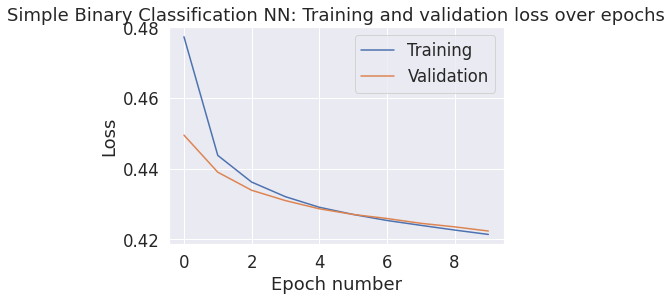

In [ ]:
make_plot(train_losses, val_losses, True, "Simple Binary Classification NN")

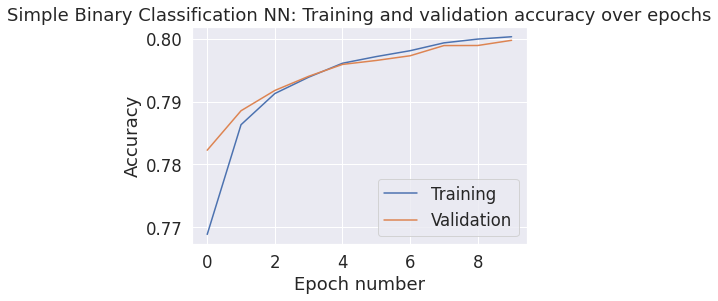

In [ ]:
make_plot(train_accuracy, validation_accuracy, False, "Simple Binary Classification NN")

Based on the plots we can see that the training and validation losses have continued to decrease (without any stagnation) in the first 10 epochs.

There is a similar, inverse trend visible in the accuracies plot as the training and validation accuracies are both still increasing. This means that the model has not converged yet and we could likely run it for more epochs to get an even better performance.

However, before experimenting with different hyperparameters such as the number of epochs the training goes on until, we want to follow our strategy of first improving our model architecture itself.


#### Model 2 - Complex model with 3 hidden layers

In line with our previous strategy, we again make our neural network deeper by increasing the number of hidden layers to 3. The number of hidden neurons is always a little less than twice the number of inputs.


In [ ]:
# Define model architecture
class CookTimeNN2(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp,55),
      nn.ReLU(),
      nn.Linear(55,100),
      nn.ReLU(),
      nn.Linear(100,55),
      nn.ReLU(),
      nn.Linear(55,1)
    )

  def forward(self, x):
    return self.layers(x)

We use the same hyperparameters as before here

In [ ]:
# Train and test this model
cookTimeNN = CookTimeNN2().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 10
criterion = nn.BCEWithLogitsLoss()

# Calling function to train the model as defined previously
train_losses, val_losses, train_accuracy, validation_accuracy = train_nn(cookTimeNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "binary", True)

The training loss for Epoch 0 is: 0.4601237101816063
The training accuracy for Epoch 0 is: 0.776025774722233
The validation loss for Epoch 0 is: 0.4366005660085348
The validation accuracy for Epoch 0 is: 0.7894763946287642
The training loss for Epoch 1 is: 0.43185586341101406
The training accuracy for Epoch 1 is: 0.7935382951604805
The validation loss for Epoch 1 is: 0.4259988063581202
The validation accuracy for Epoch 1 is: 0.7964672408687704
The training loss for Epoch 2 is: 0.42234299324690744
The training accuracy for Epoch 2 is: 0.7995184942000437
The validation loss for Epoch 2 is: 0.41828133000745216
The validation accuracy for Epoch 2 is: 0.802247885365571
The training loss for Epoch 3 is: 0.41522430258694687
The training accuracy for Epoch 3 is: 0.8037091395980586
The validation loss for Epoch 3 is: 0.4132954112731252
The validation accuracy for Epoch 3 is: 0.805749745728889
The training loss for Epoch 4 is: 0.4098139196941217
The training accuracy for Epoch 4 is: 0.8078418498

We can see that at the end of the training the final validation accuracy (81.59%) is higher than that of the baseline neural network model as well as the random forest classifier.

In [ ]:
get_test_performance(cookTimeNN, criterion, "binary")

The test Binary Cross Entropy loss is 0.3948248028755188
The test accuracy is 0.8163391422568286


The test set accuracy is also comparable (81.63%). This indicates that adding an additional hidden layer has helped our model achieve a better accuracy and improved its predicting power. 

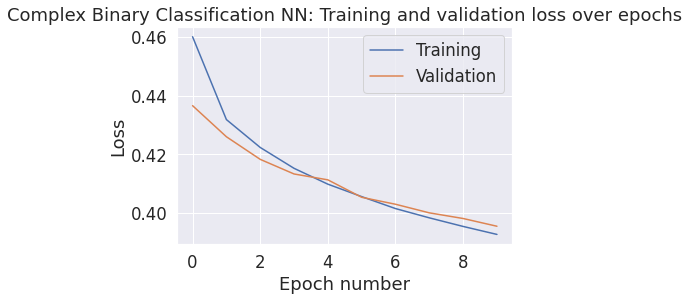

In [ ]:
make_plot(train_losses, val_losses, True, "Complex Binary Classification NN")

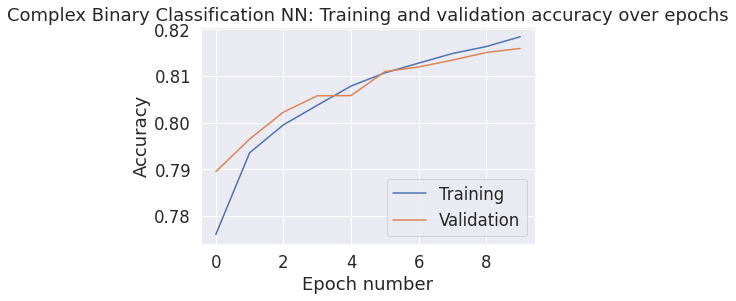

In [ ]:
make_plot(train_accuracy, validation_accuracy, False, "Complex Binary Classification NN")

The accuracy and loss plots for the deeper neural network are very similar to the ones we got for the shallower neural network. We can see that the model performance has not plateaued yet and not yet reached convergence where it could have a higher accuracy and lower loss. Looking into tweaking hyperparameters to get around this issue is now going to be our next focus.

#### Tuning the model

In this section, we define a function to help us with trying different combinations of hyperparameters with our model very easily. It is very similar to what we  wrote for the regression sections but has been adapted to include statistics specific to classification. 

**Inputs:**
1. model_class → the model class for which we want to do hyperparameter tuning
2. learning_rates  → a list of learning rates that we want to consider in our hyperparameter tuning
3. num_epochs  → a list of number of epochs that we want to consider in our hyperparameter tuning
4. batch_sizes  → a list of batch sizes that we want to consider in our hyperparameter tuning
5. Classification type → a string that can be either “binary” (representing binary classification) or “multi” (representing multi-class classification). It will help the model calculate the correct statistics.

So ultimately, the function will end up trying len(learning_rates) * len(num_epochs) * len(batch_sizes) different hyperparameter configurations.

**Outputs:**

All output is sent to stdout (not returned from the function)
1. Prints each hyperparameter combination tried along with its final validation loss and final accuracy
2. Prints the best hyperparameter combination found (the combination with the highest validation accuracy in the last epoch)
3. Displays a plot of its training and validation losses over time
4. Displays a plot of its training and validation accuracies over time
5. Prints the test performance obtained by it (the loss and accuracy).


To decide which hyperparameter values we were interested in trying, we thought about the behavior of our untuned models and also researched what commonly used values tend to be. Since both our untuned models were not converging after 10 epochs we thought it would be interesting to see the effect of larger learning rates and a greater number of epochs on the convergence of the model. We tried different batch sizes that were powers of 2. We ended up including fewer ones compared to how many we included for our regression neural networks to keep our compute time within feasible limits.

In [ ]:
# These are the different hyperparameters we want to try
model_class = CookTimeNN2
learning_rates = [1e-2, 1e-3, 1e-4]
num_epochs = [10, 20, 30, 40]
batch_sizes = [32, 128, 512]
classification_type = "binary"

# Defining the function that will return the best possible hyperparameter combination and its test accuracy
def search_hyperparameters_classification(model_class, learning_rates, num_epochs, batch_sizes, classification_type):
    best_combo = [1e-2, 5, 32]
    best_combo_training_losses = []
    best_combo_validation_losses = []
    best_combo_training_acc = []
    best_combo_validation_acc = []
    best_model = None
    max_val_acc = -1

    for learning_rate in learning_rates:
        for epochs in num_epochs:
            for batch_size in batch_sizes:
                model = model_class().to(device)
                train_losses, val_losses, train_accuracy, val_accuracy = train_nn(model, criterion, epochs, batch_size, batch_size, learning_rate, classification_type, False)
                print(f"Learning rate: {learning_rate}, Number of epochs: {epochs}, Batch Size: {batch_size}, Final Validation Loss: {val_losses[-1]}, Final Validation Accuracy: {val_accuracy[-1]}")
                if val_accuracy[-1] > max_val_acc:
                    max_val_acc = val_accuracy[-1]
                    best_combo = [learning_rate, epochs, batch_size]
                    best_combo_training_losses = train_losses
                    best_combo_validation_losses = val_losses
                    best_combo_training_acc = train_accuracy
                    best_combo_validation_acc = val_accuracy
                    best_model = model

    title = "Binary" if classification_type == "binary" else "Multi-class"

    # Display information about the best combination found 
    print("\nBEST HYPERPARAMETER COMBINATION FOUND")
    print(f"The accuracy achieved is {max_val_acc}")
    print(f"Learning rate: {best_combo[0]}, Number of epochs: {best_combo[1]}, Batch Size: {best_combo[2]}, Final Validation Loss: {best_combo_validation_losses[-1]}")
    make_plot(best_combo_training_losses, best_combo_validation_losses, True, f"Tuned Complex {title} Classification NN")
    make_plot(best_combo_training_acc, best_combo_validation_acc, False, f"Tuned Complex {title} Classification NN")
    get_test_performance(best_model, criterion, classification_type)

Learning rate: 0.01, Number of epochs: 10, Batch Size: 32, Final Validation Loss: 0.3765270624254543, Final Validation Accuracy: 0.8244048768555354
Learning rate: 0.01, Number of epochs: 10, Batch Size: 128, Final Validation Loss: 0.37207640955436366, Final Validation Accuracy: 0.8292843072882469
Learning rate: 0.01, Number of epochs: 10, Batch Size: 512, Final Validation Loss: 0.36007419150126607, Final Validation Accuracy: 0.8338418755552123
Learning rate: 0.01, Number of epochs: 20, Batch Size: 32, Final Validation Loss: 0.3778866888553248, Final Validation Accuracy: 0.8240830146897893
Learning rate: 0.01, Number of epochs: 20, Batch Size: 128, Final Validation Loss: 0.36338418808073736, Final Validation Accuracy: 0.8312026057960938
Learning rate: 0.01, Number of epochs: 20, Batch Size: 512, Final Validation Loss: 0.3453836495939054, Final Validation Accuracy: 0.8413348267737824
Learning rate: 0.01, Number of epochs: 30, Batch Size: 32, Final Validation Loss: 0.37748072077896094, Fi

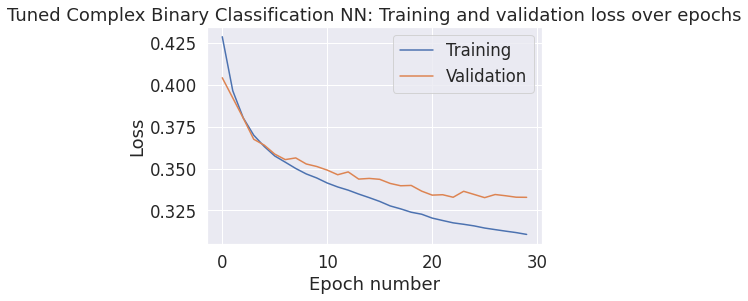

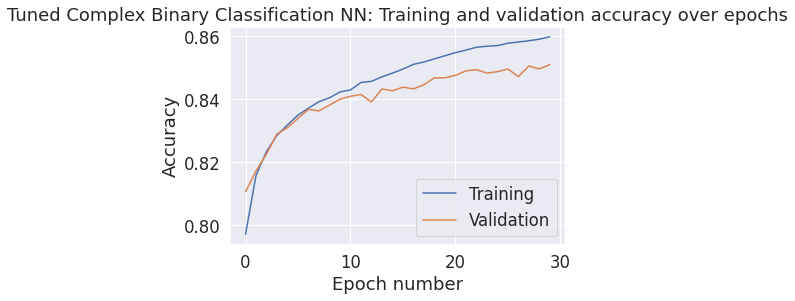

The test Binary Cross Entropy loss is 0.3339442014694214
The test accuracy is 0.850080336175998


In [ ]:
search_hyperparameters_classification(model_class, learning_rates, num_epochs, batch_sizes, classification_type)

The highest accuracy (85%) was achieved with a learning rate of 1e-3, 30 epochs and a batch size of 32. This is quite a lot higher than the 80% accuracy achieved by the random classifier model which was trained on the same inputs.

As we had suspected, a higher learning rate and/or increased number of epochs would be useful in helping our model converge to a better minimum. We can see in the plots that compared to the previous models, the validation accuracies and losses have started to plateau and reach their best possible values.

To increase this model’s effectiveness even further, beyond using strategies already described in previous sections, we would also want to try exploring the effect of adding text embeddings of longer length for each of the text features.


## **Multiclass Classification of Recipes into Categories**

Recipes have so many different subjective categories! Websites like Food.com find it very difficult to regulate the categories of food being published. In fact, Food.com has a staggering 312 different unique categories. This is not feasible for any individual who wants to narrow down their search and find recipes from higher leveled buckets. 

Additionally, it might be extremely useful to model a way to classify a given recipe into a higher level category. This would make it easier for websites to categorize recipes and would completely automate the process for recipe publishers so they don't have to specify a category (rather unregulated as there are 312 different categories), thereby streamlining the process. It would also make useability improvements as users of the website can find recipes in an easier manner.

We try to tackle this problem by:
1. Creating higher level categories for all the recipes
2. Attempting to model the multi-class classification problem of which category a given recipe would belong to


### **Category Creation**

We begin by creating higher level categories. Our approach to do so is to begin with the original `RecipeCategory` column. We previously vectorized this column to form 10 columns with vectorized text information for the category. We use these 10 columns to find higher level categories (thereby trying to group similar categories together).

We begin by selecting just these 10 columns of category vectors and scaling them. After doing so, next we use k-Means Clustering to determine the clusters of recipes. To determine the optimum number of clusters to create, we plot the distortion obtained for kMeans clustering in the range of 2 to 20 clusters. We decided not to go beyond 20 as that would render performing this high-level clustering a mute point as there would be too many categories. The plot of distortion vs number of clusters can be seen below.

In [ ]:
# Projecting the category vectors into a new df and scaling the features
df = recipes_df[['CatVec0', 'CatVec1','CatVec2', 'CatVec3', 'CatVec4', 'CatVec5', 'CatVec6','CatVec7', 'CatVec8', 'CatVec9']]
scaler = StandardScaler()
df = scaler.fit_transform(df)

# Calculating distortion for k values between 2 to 20
distortion = []
for i in range(2, 21):
    kmeans = KMeans(n_clusters = i, random_state = 1)
    kmeans = kmeans.fit(df)
    distortion.append(kmeans.inertia_)


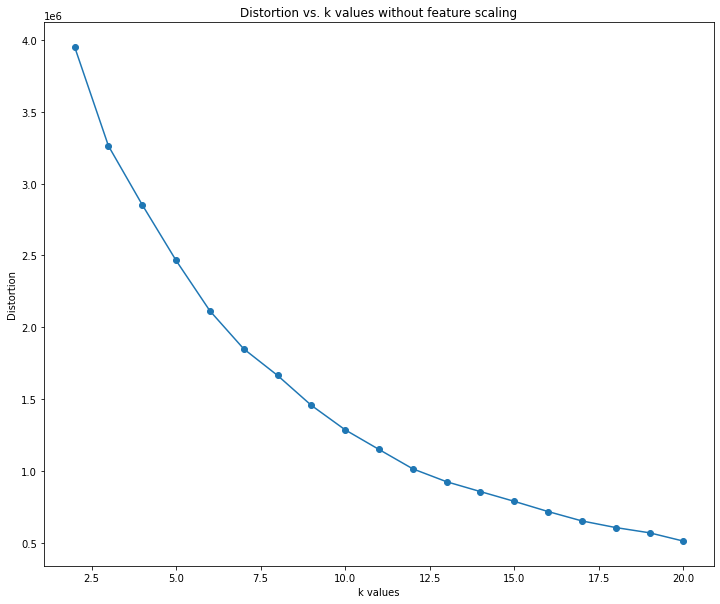

In [ ]:
# Plotting distortion vs k values to determine best k value
k_range = np.array(range(2,21))
plt.figure(figsize=(12,10))
plt.scatter(k_range, distortion)
plt.plot(k_range, distortion)
plt.title("Distortion vs. k values without feature scaling")
plt.xlabel("k values")
plt.ylabel("Distortion")
plt.show()

Now, we need to determine the optimal number of clusters based on the graph. We do so using the ‘elbow’ method, thereby trying to identify the point at which the distortion reduces relatively linearly. 

Based on the plot it can be seen that this linear decrease in distortion begins to happen about k values of around 10 to 12. We decide to proceed with a k value of 11. We perform kMeans Clustering with k = 11 and then try to visualize the clusters on a 3D plot. To do so we perform PCA to obtain the first 3 principal components and use them as the axes. We plot the recipes with different clusters as different colors on the 3D plot. The resultant plot can be seen below.


In [ ]:
# Performing kMeans clustering with k = 11
kmeans = KMeans(n_clusters = 11, random_state= 1)
kmeans = kmeans.fit(df)

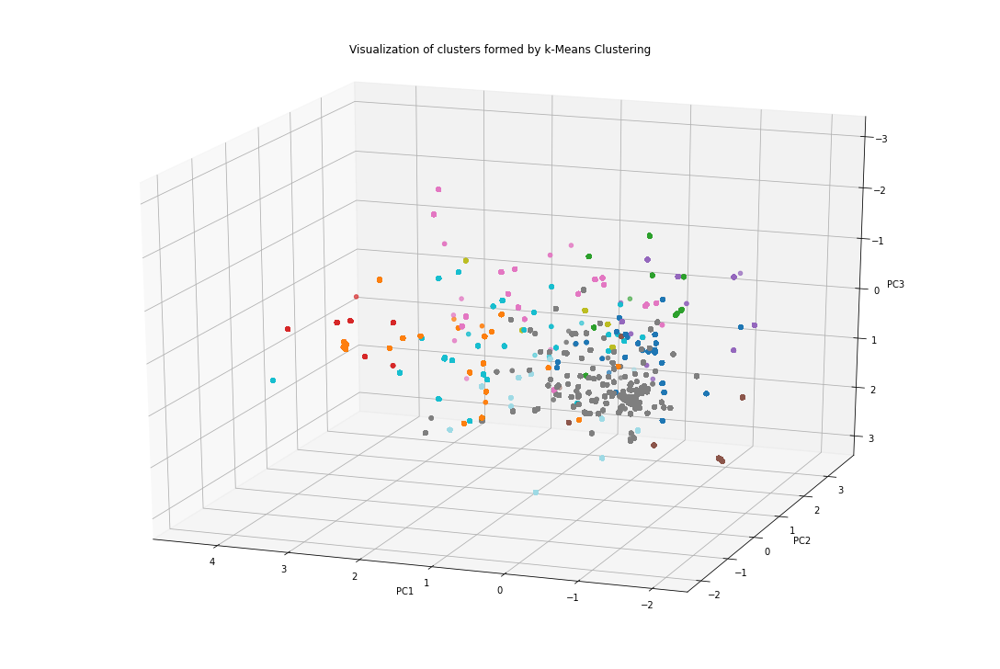

In [ ]:
# 3D visualization of the clusters created
pca = PCA(n_components=3)
pca_df = pca.fit_transform(df)

fig = plt.figure(figsize=(15,10), constrained_layout=True)
ax = fig.add_subplot(111, projection='3d')

xs = pca_df[:, 0]
ys = pca_df[:, 1]
zs = pca_df[:, 2]
ax.scatter(xs, ys, zs, c=kmeans.labels_.tolist(), cmap='tab20')

ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')
ax.view_init(-160, 70)

plt.title("Visualization of clusters formed by k-Means Clustering")
plt.show()



The visualization does indeed show some interesting clusters being formed. There is a densely packed region followed by it becoming radially less dense, with different clusters in these different areas.

Let’s not stop here. Let’s try to analyze how kMeans actually performed in accordance with the fasttext vectors created. Below, we create wordcloud of the words present in `RecipeCategory` for all the 11 categories created. Using these wordclouds we can try to find similarities and differences between the clusters.


In [ ]:
#Analyze the different clusters to come up with names by tokenizing
category = recipes_df[['RecipeId', 'RecipeCategory']]
category['cluster'] = kmeans.labels_.tolist()
category["tokenized"] = category["RecipeCategory"].apply(lambda x: tokenize_content(x))

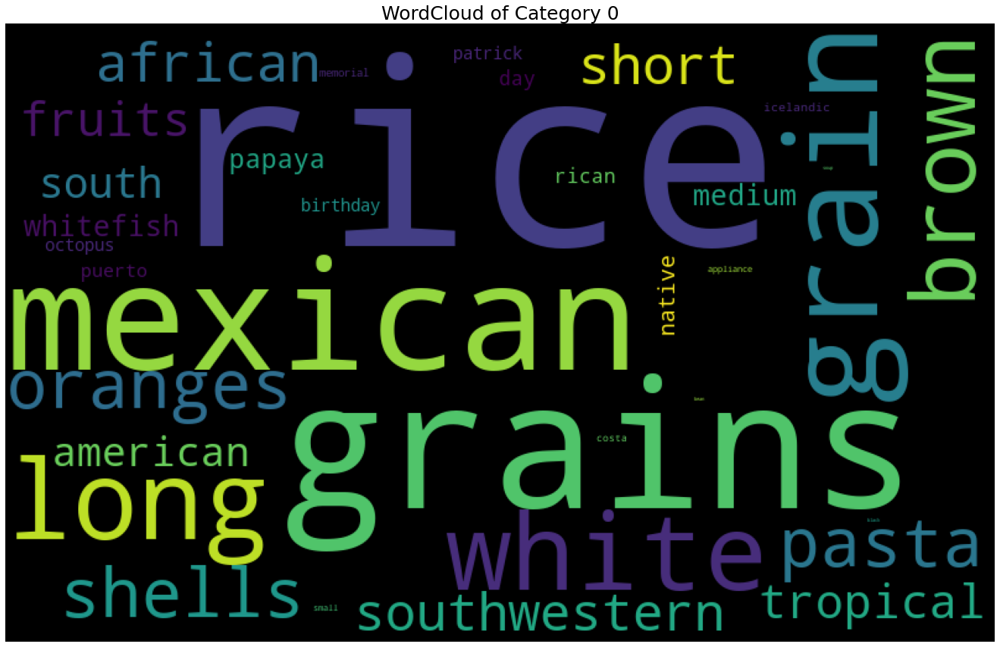

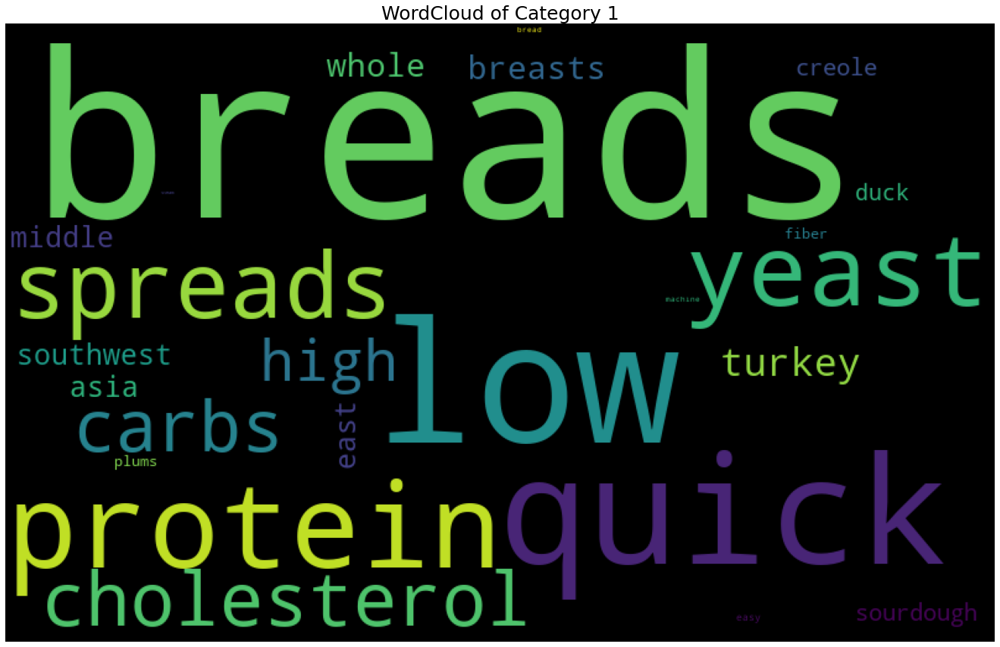

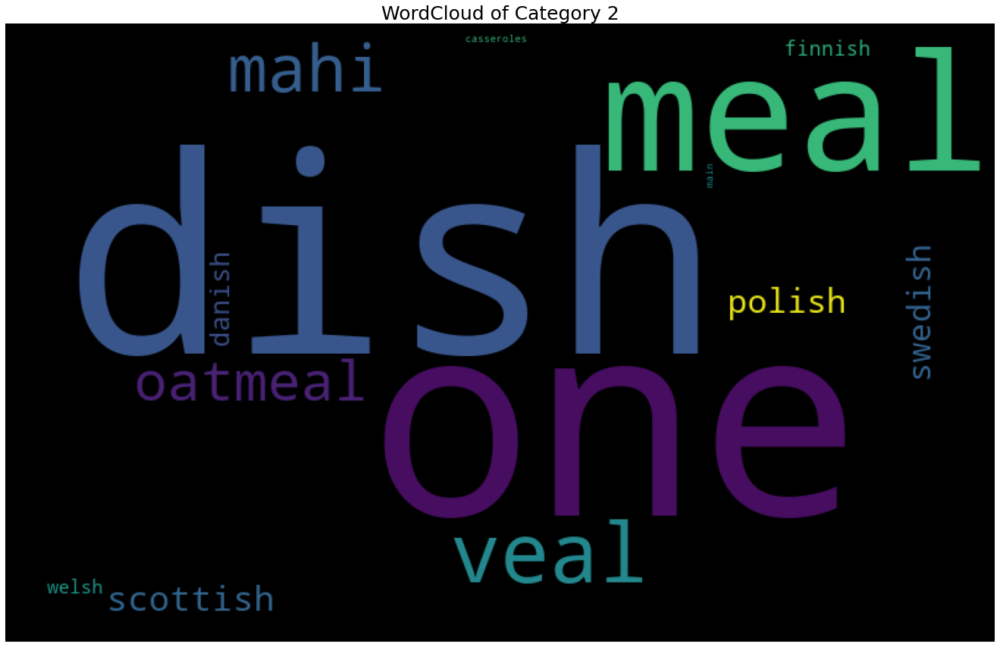

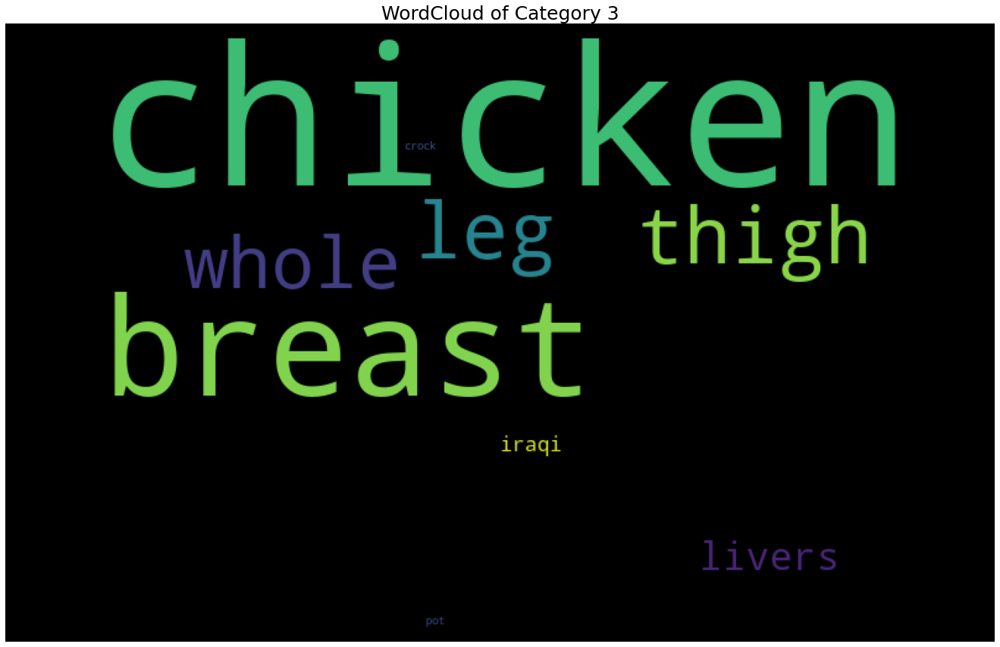

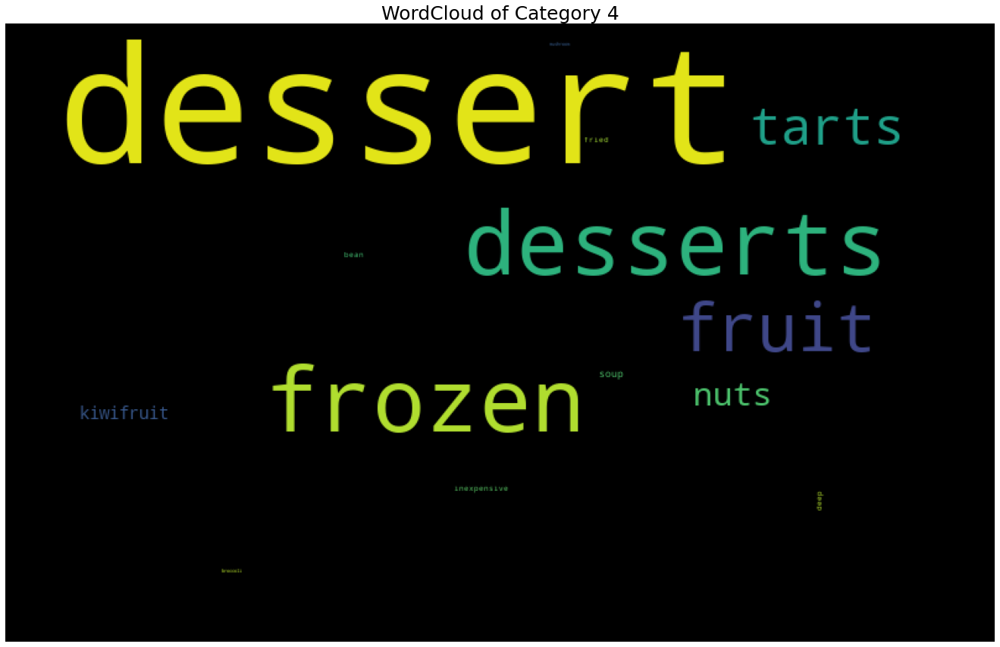

...

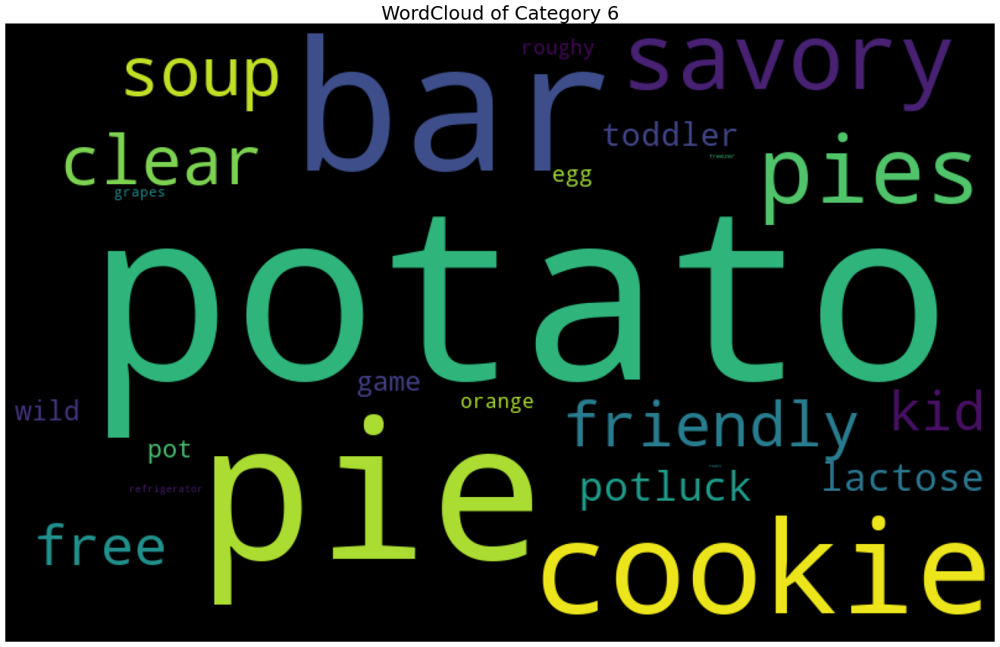

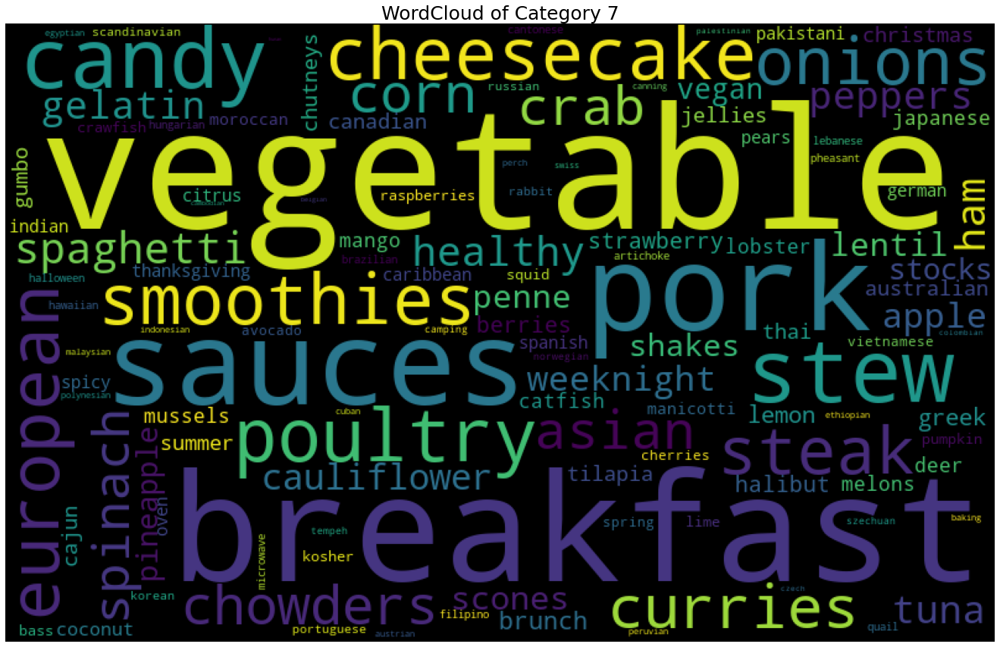

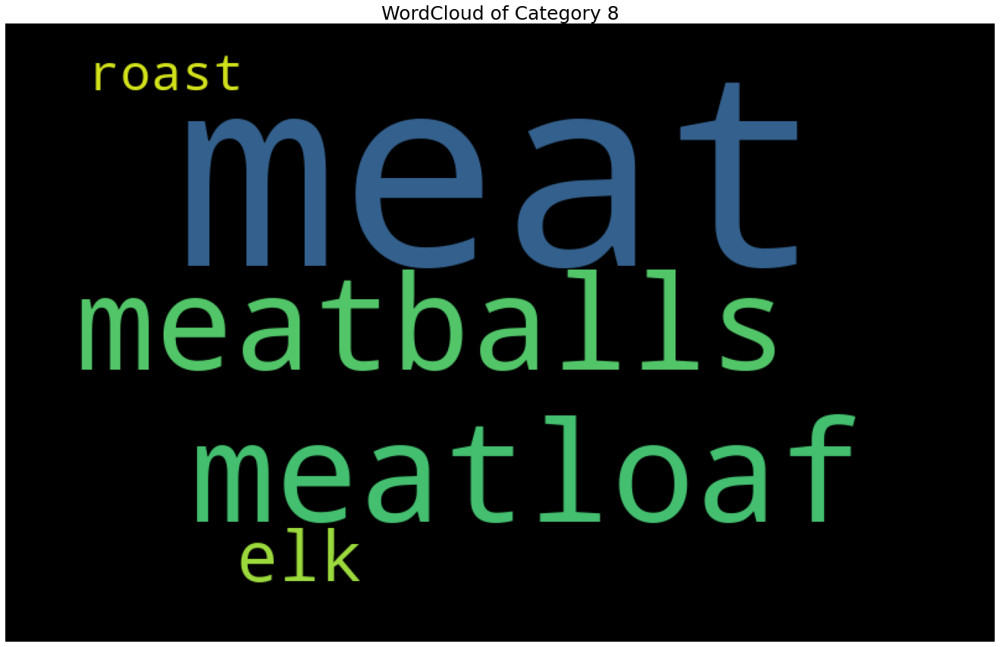

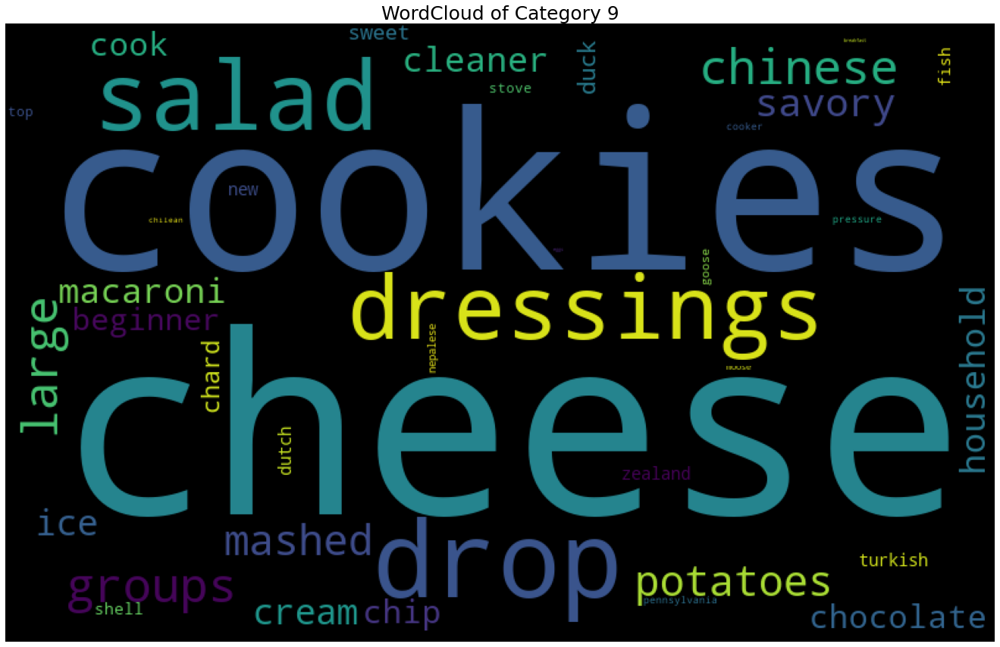

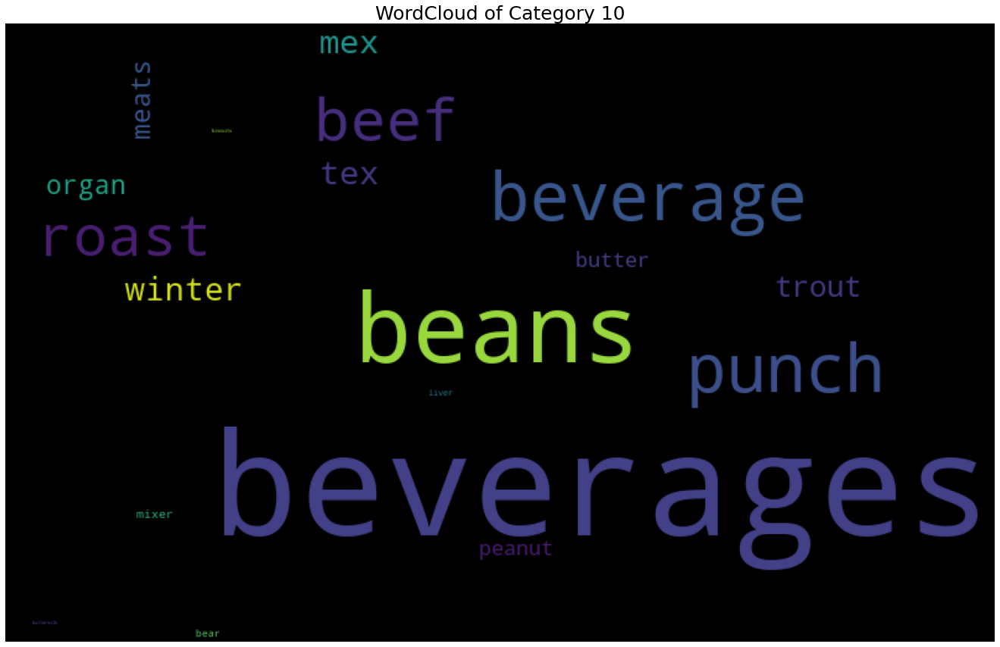

In [ ]:
# creating individual wordclouds of category values for each cluster
for i in range(11):
    category0 = category[category['cluster'] == i]
    category_tokens = category0['tokenized'].tolist()
    word_tokens = [x for sublist in category_tokens for x in sublist]
    category_0 = WordCloud(width = 800, height = 500, max_words=len(word_tokens), background_color='black').fit_words(Counter(word_tokens))
    plt.figure(figsize=(24, 15))
    plt.title("WordCloud of Category " + str(i), fontsize=25)
    plt.imshow(category_0)
    plt.axis("off")
    plt.show()

The results are actually quite interesting. There are some very obvious clusters and some that are not so obvious. We can describe the category clusters created as follows:

* Category 0 - This primarily contains words like rice, grains, white, brown, pasta and so on. Based on this, the higher level category can be called Carbs

* Category 1 - This primarily contains words like breads, yeast, protein, low, spreads, turkey and so on. Based on this, the higher level category can be called Breads/Sandwiches

* Category 2 - This category is not as obvious. The grouping ended up categorizing words that sound similar to each other. However, the three most frequent words are dish, one and meal. We can therefore call this Single Dish meals

* Category 3 - This category has been very well-defined by our model. It involves words like chicken, thigh, leg, breast, whole and liver. This category can be called Chicken Dishes

* Category 4 - This category is also very well defined. It contains words like desserts, frozen, fruit, tarts, nuts and so on. This category can be called Desserts

* Category 5 - This category contains words like mins, hours, greens and black beans. This is not particularly obvious as a grouping, but we can call it Time-Sensitive/Quick Foods.

* Category 6 - This category contains an assortment of different foods like potato, cookies, bars, soup, pies. There are also words like kid, friendly, potluck, toddler and so on. We can therefore call this category Family-Style.

* Category 7 - This cluster is the most confusing in terms of finding an obvious relation between the categories in it. There are words like vegetable, breakfast, sauces, onions, steak, poultry, pork, candy and so on. We were unable to find an obvious distinction so we call this category Miscellaneous.

* Category 8 - This category contains words associated with meat - meatballs, meatloaf, roast and elk. We can call this category Meats

* Category 9 - This cluster also contains an assortment of foods like cheese, cookies, salad, dressings, mashed potatoes and so on. This category can be called Sides.

* Category 10 - The last cluster contains the largest word as beverages, followed by beans, punch and so on. This is a little but of a mixed bag but we can call this category Beverages as it is predominantly that.


### **Creation of Label and Modelling Datasets**

We first begin by creating the column for the labels called `CreatedCategory`. This lists the category number received from our kMeans clustering for each recipe.

In [ ]:
# Creating new label column using the kMeans clustering results
recipes_df['CreatedCategory'] = kmeans.labels_.tolist()

Next we select the relevant numerical features for this classification problem. We create the scaled training and test datasets based on our selected features and the created label `CreatedCategory`.

In [ ]:
# Selecting relevant columns and projecting to new df
columns = ['CookTime', 'PrepTime', 'RecipeInstructionsCharCount', 'NumberOfIngredientParts', 'Has_Image', 
            'TotalReviewCounts', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 
            'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent', 
            'RecipeServings', 'RecipeServings_Na', 'SentimentRating', 'MeanRating', 'CreatedCategory']

recipes_model_df = recipes_df[columns]

# Creating feature set and label set
features = recipes_model_df.drop(columns=['CreatedCategory'])
cat = recipes_model_df['CreatedCategory']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, cat, random_state = 42, test_size = 0.2)

In [ ]:
# Scale features using StandardScaler
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

### **Rule-Based Baseline Model**

We first begin by implementing a rule-based baseline model to establish a benchmark. In this case, the rule is the most frequent label. This means the model will predict the label of the majority class irrespective of any features. This is an interesting baseline to consider as we will be able not only see what percent of the data is in the majority class, but also establish a baseline against which our model should definitely do better.

In [ ]:
# Fit and evaluate the model
classifier = DummyClassifier(strategy='most_frequent', random_state=42)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for "most_frequent" rule-based baseline model: ' + str(round(score, 3)))

Accuracy for "most_frequent" rule-based baseline model: 0.381


It can be seen that the accuracy of the rule-based model is 38.1%. This is definitely very low as it means about 62% of our recipes are classified incorrectly. This also means that 38.1% of our data is in our majority class. Now let’s see if we can improve on this rule-based baseline.

### **Baseline Logistic Regression Classification**

We begin by performing logistic regression without any hyperparameter tuning with just the numerical features. The results from this naive logistic regression will allow us to understand if the data is linearly separable to a certain degree and thereby be accurately classified using logistic regression. `max_iter` is set so that the model converges.

In [ ]:
# Fit and evaluate the model
classifier = LogisticRegression(max_iter = 1000)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for logistic regression baseline model: ' + str(round(score, 3)))


Accuracy for logistic regression baseline model: 0.43


The accuracy achieved by our naive logistic regression with just numerical features is higher than the rule-based model but not significantly. We have an accuracy of 43%. This is an increase of 4.9 percentage points. This result is still quite suboptimal as it means more than 57% of the data is classified incorrectly. Next, let's see if we can use additional text-based features to improve the model further.

### **Logistic Regression Classification with Additional Features**

Now, we add relevant text-based feature vectors to our model. Specifically, we add vectors for ingredients, descriptions, keywords and instructions. We do not add category vectors as those were what we used to create the categories to begin with.

Similar to before, we create scaled training (80%) and test (20%) datasets after selecting the specific features we want for our model.


In [ ]:
# Selecting relevant columns and projecting to new df
columns = ['CookTime', 'PrepTime', 'RecipeInstructionsCharCount', 'NumberOfIngredientParts', 'Has_Image', 
            'TotalReviewCounts', 'Calories', 'FatContent', 'SaturatedFatContent', 'CholesterolContent', 
            'SodiumContent', 'CarbohydrateContent', 'FiberContent', 'SugarContent', 'ProteinContent', 
            'RecipeServings', 'RecipeServings_Na', 'SentimentRating', 'MeanRating', 'CreatedCategory',
            'IngVec0', 'IngVec1','IngVec2', 'IngVec3', 'IngVec4', 'IngVec5', 'IngVec6', 'IngVec7', 'IngVec8', 'IngVec9',
            'DescVec0', 'DescVec1','DescVec2', 'DescVec3', 'DescVec4', 'DescVec5', 'DescVec6', 'DescVec7', 
            'DescVec8', 'DescVec9', 'KeyVec0', 'KeyVec1','KeyVec2', 'KeyVec3', 'KeyVec4', 
            'InsVec0', 'InsVec1','InsVec2', 'InsVec3', 'InsVec4', 'InsVec5', 'InsVec6', 'InsVec7', 'InsVec8', 'InsVec9']

recipes_model_df = recipes_df[columns]

# Creating feature set and label set
features = recipes_model_df.drop(columns=['CreatedCategory'])
cat = recipes_model_df['CreatedCategory']

# Train test split
x_train, x_test, y_train, y_test = train_test_split(features, cat, random_state = 42, test_size = 0.2)

In [ ]:
# Scaling the features
scaler = StandardScaler()
scaler = scaler.fit(x_train)
x_train = scaler.transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
# Fit and evaluate the model
classifier = LogisticRegression(max_iter = 1500)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)
print('Accuracy for logistic regression model with additional features: ' + str(round(score, 3)))

Accuracy for logistic regression model with additional features: 0.548


Interestingly, we see a significant boost in the accuracy score with the addition of these text-based features. The accuracy we received is 54.8% (11.8 percentage points higher than before). This confirms that the relevant text-based features do indeed play an important role in the classification of recipes based on their time. While the performance of the model still isn’t great, there is improvement which is promising for our next steps.

### **PCA to reduce dimensionality**

In this section we implement PCA to reduce the dimensionality of the data. Currently we have 54 features that we are using to classify each recipe. However, we are cognisant of the fact that down the line we will need to tune hyperparameters for each individual type of model we implement. Therefore, it may be useful to reduce the dimensions of our features while maintaining most of the variance to reduce the amount of computation that needs to go into hyperparameter tuning and training. This should help speed up our modeling efforts.

Therefore we implement PCA below and calculate the cumulative explained variance to determine the number of principal components that will account for 95% of the variance in our data. The plot of explained cumulative variance over the number of PCs can be seen below.


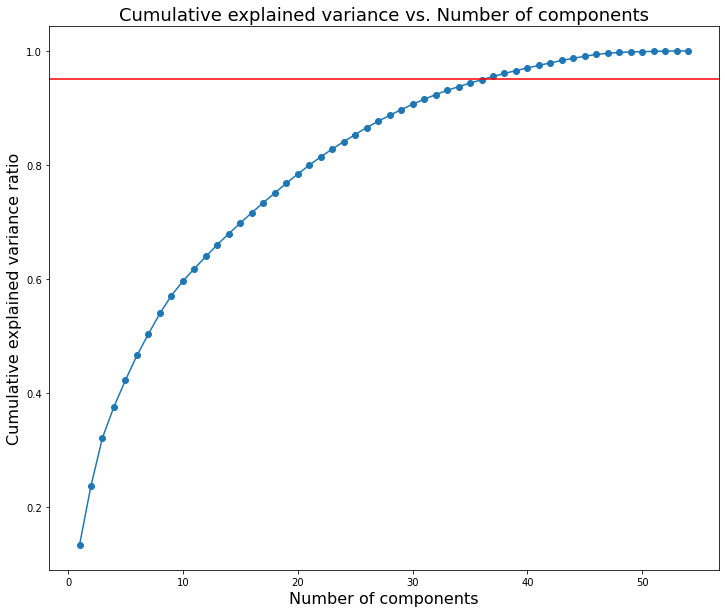

In [ ]:
# Applying PCA to training data and calculating cumulative explained variance
pca = PCA()
pca.fit(x_train)

explained_variance_ratios = pca.explained_variance_ratio_
cum_evr = []
sum = 0
for r in explained_variance_ratios:
  sum += r
  cum_evr.append(sum)
cum_evr = np.array(cum_evr)

# Plotting cumulative explained variance to determine optimal number of PCs
number = range(1, len(explained_variance_ratios)+1)
plt.figure(figsize=(12, 10))
plt.scatter(number, cum_evr)
plt.plot(number, cum_evr)
plt.axhline(y = 0.95, color = 'r', linestyle = '-')
plt.xlabel("Number of components", fontsize=16)
plt.ylabel("Cumulative explained variance ratio", fontsize=16)
plt.title("Cumulative explained variance vs. Number of components", fontsize=18)
plt.show()

Based on the graph, it is clear that we need 36 principal components to retain 95% of the explained variance in our data. Next, we run logistic regression on the PCA transformed training and test data to see the results and differences compared to the original data.

In [ ]:
# Determine number of components that give greater than 95% variance
num_comp = 0
while cum_evr[num_comp] < 0.95:
  num_comp += 1
num_comp += 1

# Using PCA to reduce dimensionality
pca = PCA(n_components= num_comp)
pca.fit(x_train)
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

# Running Linear Regression with PCA transformed data
classifier = LogisticRegression(max_iter = 1000)
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for logistic regression with PCA: ' + str(round(score, 3)))

Accuracy for logistic regression with PCA: 0.528


It can be seen that the Accuracy is now 52.8%, which is a 2% drop from the results of logistic regression with all features. However, this drop in accuracy comes with a reduction of the number of features from 54 to 36 (18 features less). This is quite significant and could reduce the amount of computation required further down due to hyperparameter tuning. Therefore, we decide to perform all further computations with the PCA transformed training and test datasets.

### **Logistic Regression with Hyperparameter tuning**

Now, we try to tune the hyperparameters for logistic regression to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we use `GridSearchCV`, similarly to what we did previously. We vary the regularization strength `C` to find the best combination. The range of `C` values we chose is 0.1, 1 and 10. These parameters alone take a significantly long time so we are unable to tune additional parameters, given our time constraints. Given more time and compute, we would look into a larger range of hyperparameters.


In [ ]:
# Model to use
log = LogisticRegression(max_iter = 3000)

# Defining grid of paramters to optimize for and their values
grid = {'C': [10, 1.0, 0.1]}
log_reg_GSCV = GridSearchCV(log, grid, cv=5, scoring='accuracy')

# Fitting and determining best hyperparameters
log_reg_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(log_reg_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(log_reg_GSCV.best_score_))

Best hyperparameter value (cross val with accuracy): {'C': 10}
Best score (cross val with accuracy): 0.5274883164033833


In [ ]:
# Fit and evaluate the model with chosen hyperparameters
classifier = LogisticRegression(max_iter = 3000, C = log_reg_GSCV.best_params_['C'], penalty='l2')
classifier = classifier.fit(x_train_pca, y_train)
prediction = classifier.predict(x_test_pca)
score = classifier.score(x_test_pca, y_test)
print('Accuracy for optimized logistic regression: ' + str(round(score, 3)))

Accuracy for optimized logistic regression: 0.528


Interestingly, post hyperparameter tuning the accuracy remains unchanged. This means that the default logistics regression hyperparameters used by scikit learn ( `C`: 1) perform similarly to the tuned hyperparameters chosen ( `C`: 10)

So, the best accuracy we receive from logistic regression (after dimensionality reduction) is 52.8%. This is still quite subpar, so it is likely that the features may not be linearly separable. Now let's try to explore certain types of models that don’t rely on the data being linearly separable.


### **Naive Decision Tree**

We begin by exploring whether we can get a better accuracy by using Decision Trees as the classification model. Our rationale is that the data may not be completely linearly separable. In this case, a decision tree may perform better than the logistic regression. To test this, we implement a decision tree with all the default hyperparameters and see how it fares in comparison to our logistic regression.

In [ ]:
# Fit and evaluate the model
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)

print('Accuracy for Naive Decision tree model: ' + str(round(score, 3)))

Accuracy for Naive Decision tree model: 0.498


It can be seen that our naive decision tree has an accuracy of 49.8%, which is 3 percentage points lower than the optimized logistic regression. However, we still have not optimized the hyperparameters. For a fair comparison, let's tune the hyperparameters for the decision tree as well and hope for improvement.

### **Decision Tree with Hyperparameter Tuning**

Similar to logistic regression, we try to tune the hyperparameters for the decision tree to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we once again use `GridSearchCV`. We vary the `max_depth` parameter (`None`, 2, 3, 5, 6, 10) to find the most optimal value. Max_depth is one of the most important parameters to tune as it prevents overfitting, which is a common problem faced when implementing decision trees. Given more time and compute, we would look into a larger range of hyperparameters to tune.


In [ ]:
# Model to use
classifier = DecisionTreeClassifier(random_state=0)

# Defining grid of paramters to optimize for and their values
grid = {'max_depth': [None, 2, 3, 5, 6, 10] }
dt_GSCV = GridSearchCV(classifier, grid, cv=5, scoring='accuracy')

# Fitting and determining best hyperparameters
dt_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(dt_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(dt_GSCV.best_score_))

Best hyperparameter value (cross val with accuracy): {'max_depth': 10}
Best score (cross val with accuracy): 0.4992828910947176


In [ ]:
# Fit and evaluate the model with chosen hyperparameters
classifier = DecisionTreeClassifier(random_state=0, max_depth=dt_GSCV.best_params_['max_depth'])
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)

print('Accuracy for optimized Decision tree model: ' + str(round(score, 3)))

Accuracy for optimized Decision tree model: 0.565


It can be seen that the optimal `max_depth` found by the gridsearch is 10, which is different from the default value of `None`. With this value, the test accuracy increases by 6.7 percentage points compared to the naive decision tree and becomes 56.5%. This is actually 3.7 percentage points higher than the accuracy of the optimized logistic regression. 

We immediately realized that given the potential of decision trees and its limitations of overfitting, we can try to use the ensemble method of random forests to improve performance in comparison to an individual decision tree.


### **Naive Random Forest**

After trying an individual decision tree, now we explore whether we can get an even better accuracy by using Random Forest as the classification model. Our rationale is that given the promising performance of our decision tree, the data may not be completely linearly separable. A random forest uses multiple decision trees to prevent overfitting and improve the generalizability of the model (at the expense of explainability). We first implement a naive random forest with the default hyperparameters and compare it to both the previous models.

In [ ]:
# Fit and evaluate the model
classifier = RandomForestClassifier(random_state=0)
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)

print('Accuracy for naive Random Forest model: ' + str(round(score, 3)))

Accuracy for naive Random Forest model: 0.646


It can be seen that our naive random forest has a test accuracy of 64.6%, which is significantly better than both our previously optimized logistic regression and decision tree models. Now, let’s try to tune the hyperparameters and see if we can improve on this accuracy even further.

### **Random Forest with Hyperparameter Tuning**

Similar to the two models before, we try to tune the hyperparameters for the random forest to potentially find the best combination of hyperparameters to get the highest test accuracy.

To do so, we once again use `GridSearchCV`. We vary the `n_estimators` (100 and 200) which is the number of decision trees created by the model and the `max_depth` parameter (`None`, 5, 10) to find the most optimal value. Max_depth is one of the most important parameters to tune as it prevents overfitting. Given more time and compute, we would look into a larger range of hyperparameters to tune.


In [ ]:
# Model to use
classifier = RandomForestClassifier(random_state=0)

# Defining grid of paramters to optimize for and their values
grid = {'n_estimators': [100, 200], 'max_depth': [None, 5, 10]}
rf_GSCV = GridSearchCV(classifier, grid, cv=5, scoring='accuracy')

# Fitting and determining best hyperparameters
rf_GSCV.fit(x_train_pca, y_train)

print("Best hyperparameter value (cross val with accuracy): " + str(rf_GSCV.best_params_))
print("Best score (cross val with accuracy): " + str(rf_GSCV.best_score_))

Best hyperparameter value (cross val with accuracy): {'max_depth': None, 'n_estimators': 200}
Best score (cross val with accuracy): 0.5597904033576662


In [ ]:
# Fit and evaluate the model with chosen hyperparameters
classifier = RandomForestClassifier(random_state=0, n_estimators=rf_GSCV.best_params_['n_estimators'], max_depth= rf_GSCV.best_params_['max_depth'])
classifier = classifier.fit(x_train, y_train)
prediction = classifier.predict(x_test)
score = classifier.score(x_test, y_test)

print('Accuracy for optimized Random Forest model: ' + str(round(score, 3)))

Accuracy for optimized Random Forest model: 0.648


It can be seen that the optimal `max_depth` found by the gridsearch is `None` and the `n_estimators` is 200.  The `n_estimators` value we got is different from the default value of 100. With these values, the test accuracy increases to 64.8%, which is only 0.2 percentage point increase compared to the naive random forest model, however, an increase is still an increase.

Based on all these results so far, it is clear that our Random Forest model has received the highest test accuracy. This means that there is some non-linearity in our data which is captured by our Random Forest. 

To see if we can capture all the relationships between our feature set and label, we finally try to use a FeedForward Neural Network next.


### **Neural Network**

The binary classification neural network we used above can be adapted to be a multi-class predictor with just a few changes - first we would need to use Cross Entropy Loss (which makes use of softmax instead of sigmoid) instead of Binary Cross Entropy Loss and the final layer of our neural network would need to as many neurons in the output layer as there are classes that we are hoping to predict between. Neural networks have been used for a lot of popular and difficult multi-class classification problems such as MNIST, CIFAR, etc. This is why we are hopeful that it might work well for our use case too.

For this classification task we start by creating the PyTorch training, validation and test datasets containing all the cooking time related components found through PCA and their corresponding labels.

In [ ]:
# Split into train and validation sets
x_train_pca, x_val, y_train, y_val = train_test_split(x_train_pca, y_train, test_size=0.2, random_state=42)

# Load the dataset
train_dataset = NNDataset(x_train_pca, y_train.to_numpy())
validation_dataset = NNDataset(x_val, y_val.to_numpy())
test_dataset = NNDataset(x_test_pca, y_test.to_numpy())

#### Model 1 - Simple NN with 1 hidden layer

To start we build a simple NN with just 1 hidden layer as shown below. The number of hidden neurons is less than two times the size of the inputs and the final layer has 11 outputs as there are 11 classes for the model to predict between.

In [ ]:
# Define model architecture
class CategoryNN1(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp,70),
      nn.ReLU(),
      nn.Linear(70,11)
    )

  def forward(self, x):
    return self.layers(x)

We make use of arbitrarily chosen hyperparameters for now and use Cross Entropy Loss as the objective function.

In [ ]:
# Train and test this model
categoryNN = CategoryNN1().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 10
criterion = nn.CrossEntropyLoss()

# Calling function to train the model as defined previously
train_losses, val_losses, train_accuracy, validation_accuracy = train_nn(categoryNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "multi", True)

The training loss for Epoch 0 is: 1.5069018114975872
The training accuracy for Epoch 0 is: 0.5067687613456413
The validation loss for Epoch 0 is: 1.3638106643711716
The validation accuracy for Epoch 0 is: 0.5356301417480978
The training loss for Epoch 1 is: 1.3320078012258214
The training accuracy for Epoch 1 is: 0.5426853604212531
The validation loss for Epoch 1 is: 1.3096740384765668
The validation accuracy for Epoch 1 is: 0.546959689982362
The training loss for Epoch 2 is: 1.2915224316375509
The training accuracy for Epoch 2 is: 0.5531040387264557
The validation loss for Epoch 2 is: 1.2784718491591183
The validation accuracy for Epoch 2 is: 0.5565769314948567
The training loss for Epoch 3 is: 1.2652063550498531
The training accuracy for Epoch 3 is: 0.5609478197056892
The validation loss for Epoch 3 is: 1.25696346524618
The validation accuracy for Epoch 3 is: 0.5632974135156361
The training loss for Epoch 4 is: 1.2461858336208531
The training accuracy for Epoch 4 is: 0.56679283663563

We can see that the validation accuracy after training is 58.3%. While this is much better than the accuracy achieved by the naive rule-based model (38% accuracy), it is much worse than the accuracy achieved by the tuned random forest classifier (64.8% accuracy).

In [ ]:
get_test_performance(categoryNN, criterion, "multi")

The test Cross Entropy loss is 1.0926402865672549
The test accuracy is 0.5826329666707865


The performance on the test set is mostly the same with only the minutest fall in accuracy (to 58.2%).

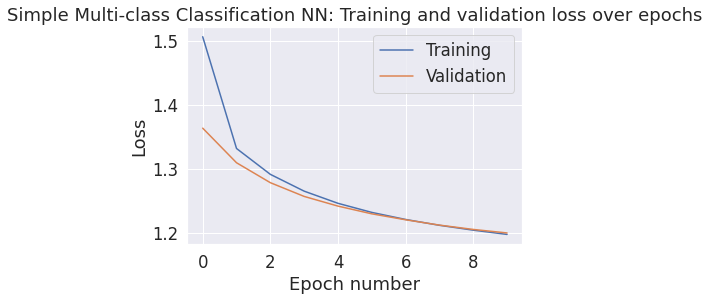

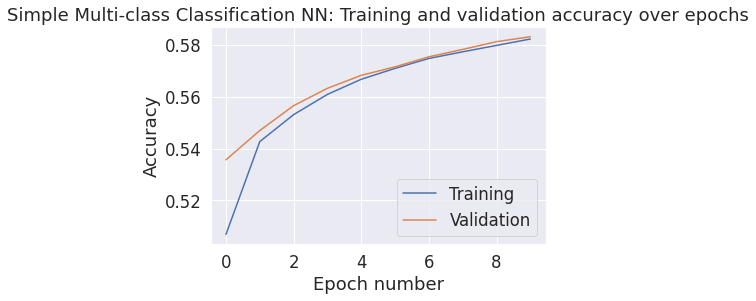

In [ ]:
# Visualize the accuracy and losses
make_plot(train_losses, val_losses, True, "Simple Multi-class Classification NN")
make_plot(train_accuracy, validation_accuracy, False, "Simple Multi-class Classification NN")

The plots show that the losses as well as accuracies have not converged yet. Let’s try to use a more complex model next that could fit to the data more closely and thus potentially reach the minimum faster.

#### Model 2 - Complex NN with 3 hidden layers

For this model, we again decided to use 3 hidden layers because we read that increasing the depth of a neural network can be very useful for learning abstract relationships especially in the case where there are many features.

In [ ]:
# Define model architecture
class CategoryNN2(nn.Module):
  def __init__(self):
    super().__init__()
    self.layers = nn.Sequential(
      nn.Linear(num_comp,70),
      nn.ReLU(),
      nn.Linear(70,135),
      nn.ReLU(),
      nn.Linear(135,70),
      nn.ReLU(),
      nn.Linear(70,11)
    )

  def forward(self, x):
    return self.layers(x)

Again we are using the same hyperparameters as before.

In [ ]:
# Train and test this model
categoryNN = CategoryNN2().to(device)

# Define all the  hyperparameters we will be using for it
learning_rate = 1e-4
train_batch_size = 32
validation_batch_size = 32
num_epochs = 10
criterion = nn.CrossEntropyLoss()

# Calling function to train the model as defined previously
train_losses, val_losses, train_accuracy, validation_accuracy = train_nn(categoryNN, criterion, num_epochs, train_batch_size, validation_batch_size, learning_rate, "multi", True)

The training loss for Epoch 0 is: 1.4479092025793667
The training accuracy for Epoch 0 is: 0.5218415665675331
The validation loss for Epoch 0 is: 1.3227431994342724
The validation accuracy for Epoch 0 is: 0.5464318360305382
The training loss for Epoch 1 is: 1.281684767131825
The training accuracy for Epoch 1 is: 0.557124097176625
The validation loss for Epoch 1 is: 1.2517024531494059
The validation accuracy for Epoch 1 is: 0.5689879366060279
The training loss for Epoch 2 is: 1.2289986273287254
The training accuracy for Epoch 2 is: 0.57172376501487
The validation loss for Epoch 2 is: 1.2147623631225584
The validation accuracy for Epoch 2 is: 0.5784893077388539
The training loss for Epoch 3 is: 1.199543459119561
The training accuracy for Epoch 3 is: 0.5801565537574189
The validation loss for Epoch 3 is: 1.1927137628958684
The validation accuracy for Epoch 3 is: 0.5845274419682516
The training loss for Epoch 4 is: 1.1780383783744612
The training accuracy for Epoch 4 is: 0.5871570558623975

We find that making the neural network deeper improved the validation accuracy to 60.9%. This is still quite less compared to the tuned random classifier model.

In [ ]:
get_test_performance(categoryNN, criterion, "multi")

The test Cross Entropy loss is 1.0567687797745777
The test accuracy is 0.6098854694516541


The test accuracy is also very similar to the final validation accuracy (61%). We want to try to improve this by experimenting with different hyperparameters next.

#### Tuning the model

We make use of the same function that we defined in the binary classification section to search for the optimal hyperparameter combination. The only difference is that we let the function know that it is a multi-class classification problem so it can calculate all the metrics correctly for us. We make use of the same lists of hyperparameter options based on our rationale explained earlier.

Learning rate: 0.01, Number of epochs: 10, Batch Size: 32, Final Validation Loss: 1.2515765267011558, Final Validation Accuracy: 0.5869478454546625
Learning rate: 0.01, Number of epochs: 10, Batch Size: 128, Final Validation Loss: 1.1601005896704986, Final Validation Accuracy: 0.6072766598431888
Learning rate: 0.01, Number of epochs: 10, Batch Size: 512, Final Validation Loss: 1.0761725020251776, Final Validation Accuracy: 0.6312489539479613
Learning rate: 0.01, Number of epochs: 20, Batch Size: 32, Final Validation Loss: 1.2645996951389156, Final Validation Accuracy: 0.5940674365609672
Learning rate: 0.01, Number of epochs: 20, Batch Size: 128, Final Validation Loss: 1.142215132320536, Final Validation Accuracy: 0.6140615142971174
Learning rate: 0.01, Number of epochs: 20, Batch Size: 512, Final Validation Loss: 1.0748601438183534, Final Validation Accuracy: 0.6286225586754728
Learning rate: 0.01, Number of epochs: 30, Batch Size: 32, Final Validation Loss: 1.296338024038263, Final Va

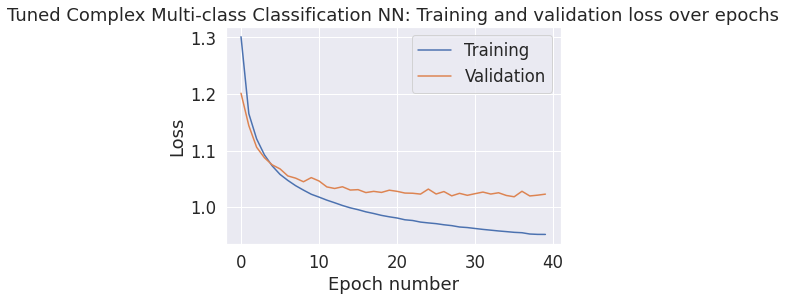

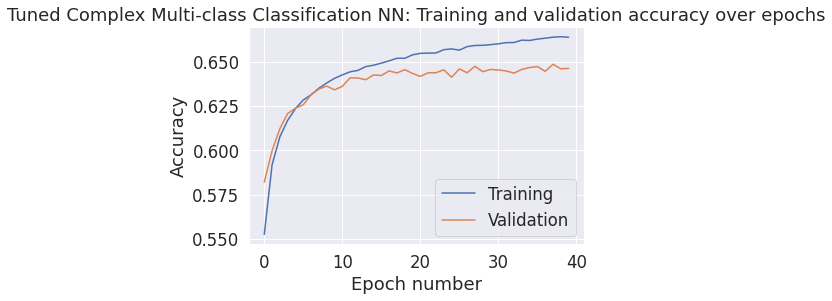

The test Cross Entropy loss is 1.0067965095562574
The test accuracy is 0.6497857701973386


In [ ]:
# These are the different hyperparameters we want to try
model_class = CategoryNN2
learning_rates = [1e-2, 1e-3, 1e-4]
num_epochs = [10, 20, 30, 40]
batch_sizes = [32, 128, 512]
classification_type = "multi"

# Calling previously defined function to obtain the best combination of hyperparameters
search_hyperparameters_classification(model_class, learning_rates, num_epochs, batch_sizes, classification_type)

The model using the best hyperparameters gives us a test accuracy of 64.9% which is very slightly better than what we were able to achieve with the random forest classifier trained on the same inputs. At first, this may seem like a low accuracy. However, given that there are 11 different categories that the model has to choose between, and that the majority class is 38%, this performance is a great starting point for this multi-class classification problem.

To improve the neural network model further, in addition to previously mentioned ideas, we would also want to explore the performance obtained by non-feed forward neural networks such as RNNs that are known to work well with sequential data such as text. 


# **Conclusion**

Our overall objective for this project was to help people improve the way they are consuming food, choosing their recipes and taking care of their health. Throughout this project, we explored a large array of different topics, from predicting different nutritional content, to classifying recipes based on time and categories, to exploring various questions about how people interact with recipes online. Based on all of this modeling and exploration, here are our final takeaways.


## **Prediction of Fiber Content**

We found that the relationship between at least some of our recipe information inputs and fiber content was likely non-linear. This is why the best neural network performed significantly better than the best linear regression model which ended up underfitting because it was too simple to capture the underlying signals in the data. The simple linear regression model had a R^2 score of 0.551 and RMSE of 7.685 whereas the tuned 3 hidden layer neural network had a R^2 score of 0.79 and RMSE of 5.24.

We also found that using regularization was not very helpful in this case for the same reason - reducing the number of features made the problem of underfitting much worse.

In addition, PCA was not useful at all in this case because it is possible that the patterns that the PCA learned from the training set may not have been very applicable to the test set and for predicting fiber specifically. 


## **Prediction of Cholesterol Content**

Similar to what we found while predicting fiber content, in this case the performance of the best neural network was better than the performance of the best linear regression model that we found. In the case of cholesterol content prediction, using PCA was quite helpful as it helped us cut down our number of features used significantly (by 32% - from 58 to 39) while allowing us to have similar prediction power. The linear regression model using PCA inputs had a R^2 score of 0.62 and a RMSE of 99.2 whereas the 3 hidden layer neural network using PCA inputs had a R^2 of 0.71 and RMSE of 85.9. 

Regularization was not useful in this case and even after trying several different coefficients, we found that the performance only worsened. This made sense because the linear model itself was too simple and led to underfitting.


## **Classification of Quick vs Time-consuming recipes**

For the classification of recipes into Quick (within 30 min) or Long, it was observed that our tuned complex neural network performed the best in terms of accuracy of the classification. The accuracy it achieved was 85%, which was significantly higher than our other models. The tuned logistic regression received an accuracy of 76.8%, the tuned decision tree received an accuracy of 76.4% and the tuned Random Forest received an accuracy of 80.3%. It is therefore quite clear that there is some non-linearity present in the data which the logistic regression model was not able to capture, however, our Random Forest and Neural networks were able to identify.

## **Classification of Recipes into Higher Level Categories**

For the classification of recipes into Higher Level categories, we ended up using kMeans clustering based on the fasttext word-to-vec features. This led to 11 higher level categories. While some of these categories were well-separated and defined, there are quite a few categories that were not so obvious or delineated. 

Our highest multi-class classification accuracy was once again received by our tuned complex neural network, although just barely improving on the Random Forest. The accuracy received by the tuned neural network was 65%. This is followed by the tuned Random Forest with an accuracy of 64.8%, the tuned decision tree with an accuracy of 56.5% and lastly the logistic regression with an accuracy of 52.8%. Once again, it is clear that this problem, more so than the previous one, contained data which was non-linearly separable. This is why the Random Forests and Neural Networks were able to perform better than the logistic regression model.


## **Exploration and Analysis of the Data**

Given the large amount of data present in our data set, we were thrilled to be able to explore various questions that we had about the data, food, nutrition, and people's interaction with websites like Food.com.

We were able to get the following results from our exploration:
* There were a significant portion of recipes that did not have any reviews. Additionally, of those that were reviewed, most of the ratings were extremely positive.
* We observed various obvious correlations between some of the nutritional information provided to us, however, there were some notable correlations that may not be so obvious. Cholesterol was seen to be correlated with sugar and carbohydrates. Also, protein was more highly correlated with calories than carbohydrates. Additionally, `Mean Rating` was seen to be completely uncorrelated with all the numerical features in our dataset. 
* Analyzing the nutritional content further by breaking them down based on recipes being positive or negatively reviewed did not lead to any major revelations
* The most commonly used ingredient across all recipes was salt, followed by butter, eggs and sugar. These are honestly quite expected as they are essentially pantry staples. Diving in further, we found the most used vegetable to be onion, the most used fruit to be tomato, the most used dairy product to be butter, the most used proteins to be eggs followed by bacon and the top spices to be salt followed by pepper.
* On analyzing trends in percentage of daily values recipes contain for different nutritional content and the count of recipes that exceed meal limits for nutritional content, it can be seen that both these graphs follow the same overall shape and time lines. There is a U-shaped trend with the values decreasing till around 2010 and then increasing. Interestingly fiber content shows an increasing trend over the years.
* Sentiment analysis results revealed that the certain words are used more in positive reviews like great, loved and delicious. There are also certain words that are used more in negative reviews like would, little and instead.
* There is surprisingly only a coefficient of correlation of 0.4 between `Mean Rating` and `Sentiment Rating`. We had expected it to be greater. However, the distribution of scores skewed towards the high scores remained consistent between both.
* Food.com’s publishing counts and review counts peaked around 2007-2008 and has been gradually declining ever since. This could indicate a fall in its popularity due to other competition within this space.
* January is the month with the highest number of published recipes and highest number of reviews. There are also other monthly peaks and troughs which could be attributed to different holidays and festivals within the US.
* The average recipe instruction’s length has been increasing over time, indicating that people are preferring more detailed recipes or that recipes may be becoming more complex over time.


# **Next Steps**

There are a wide variety of ideas that we had which we were not able to explore over the course of this project due to time and computational constraints. Future work can build on what we have already done by exploring them:
* What are the best combinations of ingredients? i.e. find pairs of ingredients which result in the highest recipe rating on average (exclude staples such as sugar, salt, oil)
* Improving on our clustering algorithm and using it along with our multi-class classification model to build a real system that can automatically categorize any new recipe that is uploaded to the recipes website.
* Investigate changes in the nutritional content of recipes over time - are they becoming more unhealthy?
* Build a recommender system based on user reviews that relies on K-Nearest Neighbors and understanding how to recommend recipes to people who are similar to each other.

We also had several specific ideas for how to improve our model predictions and evaluations
* Ideas for changes in our dataset
  * Address an important concern we had but weren’t able to tackle - since we are using rating, each user has a very different scale of review. Some might be very harsh or generous reviewers. How can we incorporate this fact into models?
  * Exploring the effect of adding text embeddings of longer length for each of the text features.
* Ideas for how to evaluate results better
  * Incorporate more metrics beyond just accuracy for the assessment of classification models.
* Ideas for how to build more effective models
  * Explore the performance obtained by non-feed forward neural networks such as RNNs that are known to work well with sequential data such as text.
  * Try deeper neural networks by adding even more layers (and potentially tackling any overfitting with dropout layers).
  * Training for a longer number of epochs until the model converges.
  * Trying a much wider range of hyperparameters and different hyperparameters that we did not even consider tuning in our current exploration (such as different weight initialization techniques, optimizer used and activation function used).
  * Try different clustering techniques that may work better such as DBScan or hierarchical clustering.
